## **PSO com datasets combinados**

In [1]:
# %pip install ipykernel --break-system-packages
# %pip install scikit-learn --break-system-packages
# %pip install matplotlib --break-system-packages
# %pip install keras --break-system-packages
# %pip install tensorflow --break-system-packages
# %pip install pandas --break-system-packages
# %pip install plotly --break-system-packages
# %pip install seaborn --break-system-packages
# %pip install nbformat --break-system-packages
# %pip install keras --break-system-packages
# %pip install pswarm


In [2]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tensorflow.keras.initializers import GlorotUniform    #Inicializador de pesos
from sklearn.model_selection import KFold
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from scipy.signal import find_peaks

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf #Biblioteca para machine learning

In [3]:
base_path = './dataset/'
time_base = 'days'
agrupamento = "3"
dataset_type = f"{agrupamento}_days_dataset"

In [4]:
scaler = MinMaxScaler(feature_range=(0, 1))  # Padronização dos dados

duas_unas_dataset = f'{base_path}duas_unas/{time_base}/grouped_{agrupamento}_{time_base}.csv'
prataI_dataset = f'{base_path}outras_unidades/{time_base}/PRATA_I_{agrupamento}_{time_base}.csv'
prataII_dataset = f'{base_path}outras_unidades/{time_base}/PRATA_II_{agrupamento}_{time_base}.csv'
prataIII_dataset = f'{base_path}outras_unidades/{time_base}/PRATA_III_{agrupamento}_{time_base}.csv'
pirapama_dataset = f'{base_path}outras_unidades/pirapama/Pirapama_{agrupamento}_{time_base}.csv'

In [5]:
# transformando CSV em DataFrame
duas_unas_df = pd.read_csv(duas_unas_dataset)  # Transformação em dataset
prataI_df = pd.read_csv(prataI_dataset)  # Transformação em dataset
prataII_df = pd.read_csv(prataII_dataset)  # Transformação em dataset
prataIII_df = pd.read_csv(prataIII_dataset)  # Transformação em dataset
pirapama_df = pd.read_csv(pirapama_dataset)  # Transformação em dataset

In [6]:
validation_interval = 31  # Definição da parcela dos dados que serão retiradas do treinamento/teste para validação
time_step = 1  # Number of previous time steps to consider
output_steps = 30  # Number of future steps to predict

indices_to_validate = duas_unas_df.index[-validation_interval:].tolist()  # Obtenção dos índices dos dadoss de validação

datasets = [pirapama_df, prataI_df, prataII_df, prataIII_df, duas_unas_df]  # df1, df2, etc., são os seus dataframes

# Aplicar MinMaxScaler para cada dataset individualmente
scaled_datasets = []
scalers = []
for i, df in enumerate(datasets):
    # Garantir que 'timestamp' é do tipo datetime e já está configurado corretamente como índice
    if 'timestamp' in df.columns:
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        df = df.sort_values(by='timestamp')
        df.set_index('timestamp', inplace=True)

    # Aplicar o scaler apenas nas colunas numéricas
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df.select_dtypes(include=[float, int]))  # Apenas colunas numéricas
    scaled_df = pd.DataFrame(scaled_data, columns=df.select_dtypes(include=[float, int]).columns, index=df.index)
    
    # Adicionar o DataFrame escalado à lista
    scaled_datasets.append(scaled_df)
    scalers.append(scaler)  # Salvar o scaler específico para este dataset

# print(scaled_datasets[4].index)
# print(indices_to_validate)

# duas_unas_df_scaled = scaled_datasets[4].iloc[~scaled_datasets[4].index.isin(indices_to_validate)].reset_index(drop=True)
# print(duas_unas_df_scaled)
duas_unas_validation_scaled = scaled_datasets[4].tail(validation_interval)  # Criação do dataset de validação
#print(duas_unas_validation_scaled)
#duas_unas_df_scaled = scaled_datasets[4].drop(tail(indices_to_validate.shape)).reset_index(drop=True)  # Retirada dos dados de validação do dataset original de treino/teste

# Define o número de linhas a serem removidas
X = len(indices_to_validate)
duas_unas_df_scaled = scaled_datasets[4].iloc[:-X]
#print(duas_unas_df_scaled)
# print(duas_unas_validation_scaled)

scaled_datasets[4] = duas_unas_df_scaled

In [7]:

# base_path = './dataset/'

# # carregando arquivo CSV
# time_base = 'days'  # Escolha do tipo de agrupamento
# duas_unas_dataset = f'{base_path}duas_unas/{time_base}/grouped_7_{time_base}.csv'  # Definição do caminho do diretório do dataset
# print(len(duas_unas_dataset))
# validation_interval = 13  # Definição da parcela dos dados que serão retiradas do treinamento/teste para validação
# time_step = 1  # Number of previous time steps to consider
# output_steps = 12  # Number of future steps to predict

# # transformando CSV em DataFrame
# duas_unas_df = pd.read_csv(duas_unas_dataset)  # Transformação em dataset

# duas_unas_validation = duas_unas_df.tail(validation_interval)  # Criação do dataset de validação

# indices_to_validate = duas_unas_df.index[-validation_interval:].tolist()  # Obtenção dos índices dos dadoss de validação
# duas_unas_df = duas_unas_df.drop(indices_to_validate).reset_index(drop=True)  # Retirada dos dados de validação do dataset original de treino/teste

# duas_unas_df['timestamp'] = pd.to_datetime(duas_unas_df['timestamp'])  # Transformação dos dados da coluna 'timestamp' no formato datetime. Ela lida com vários formatos de data/hora e tenta interpretá-los de forma inteligente.
# duas_unas_validation['timestamp'] = pd.to_datetime(duas_unas_validation['timestamp'])  # Idem da ação da linha de cima.

# duas_unas_df['index'] = range(len(duas_unas_df))  # Criação da coluna 'index' em que os valores vão de zero ao tamanho total do daframe
# duas_unas_validation['index'] = indices_to_validate  # Idem da acima da linha acima
# print(indices_to_validate)
# duas_unas_df['kwh'] = duas_unas_df['kWh fornecido']  # Criação da coluna 'kwh' que copia os dados da coluna 'kWh fornecido'
# duas_unas_validation['kwh'] = duas_unas_validation['kWh fornecido']  # Idem da acima da linha acima

# duas_unas_df.drop(columns=['timestamp'], inplace=True)  # Remoção da coluna 'timestamp', inclusive no dataframe original
# duas_unas_validation.drop(columns=['timestamp'], inplace=True)  # Idem da acima da linha acima

# duas_unas_df.drop(columns=['kWh fornecido'], inplace=True)  # Remoção da coluna 'kWh fornecido', inclusive no dataframe original
# duas_unas_validation.drop(columns=['kWh fornecido'], inplace=True)  # Idem da acima da linha acima

# X = duas_unas_df['index'].values.reshape(-1,1)  # Cria o array X com os índices do dataframe duas_unas_df
# y = duas_unas_df['kwh'].values  # Cria o array y com os dados de energia de duas_unas_df
# #print(y)
# X_validation = duas_unas_validation['index'].values.reshape(-1,1)  # Cria o array X_validation com os índices do dataframe duas_unas_validation
# y_validation = duas_unas_validation['kwh'].values  # Cria o array y com os dados de energia de duas_unas_validation
# #print(X_validation)

In [8]:
def identify_peaks_and_valleys(y_test):
    # Converte y_test em um tensor
    #y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
    # Inicializa pesos como um tensor de 1s do mesmo formato
    weights = tf.ones(tf.shape(y_test), dtype=tf.float32)

    # Condicional para verificar se y_test tem pelo menos 3 elementos
    mask = tf.size(y_test) < 3
    #print(tf.size(y_test) < 3)

    # Função para processar picos e vales
    def process_peaks_and_valleys():
        # Certifique-se de que y_test é do tipo float32
        y_test_float = tf.cast(y_test, tf.float32)

        # Obtém os índices de picos e vales para elementos intermediários
        # Corrigido: use tf.expand_dims para garantir que o primeiro elemento tenha o formato correto
        y_test_prev = tf.concat([tf.expand_dims(y_test_float[0], axis=0), y_test_float[:-1]], axis=0)  # Adiciona o primeiro elemento como anterior
        y_test_next = tf.concat([y_test_float[1:], tf.expand_dims(y_test_float[-1], axis=0)], axis=0)  # Adiciona o último elemento como próximo

        # Define picos e vales para os elementos intermediários
        peaks = tf.where((y_test_float > y_test_prev) & (y_test_float > y_test_next))
        valleys = tf.where((y_test_float < y_test_prev) & (y_test_float < y_test_next))
        # print(f"picos",peaks)
        # print(f"vales",valleys)
        # Atualiza os pesos para picos e vales intermediários
        weights_updated = tf.tensor_scatter_nd_update(weights, peaks, tf.fill(tf.shape(peaks)[:1], 2.0))
        weights_updated = tf.tensor_scatter_nd_update(weights_updated, valleys, tf.fill(tf.shape(valleys)[:1], 2.0))

        return weights_updated

    # Condicional para executar a função de processamento se y_test tiver 3 ou mais elementos
    weights = tf.cond(mask, lambda: weights, process_peaks_and_valleys)

    return weights


In [9]:
# Função WMSE ajustada com pesos para picos e vales
def wmse(y_test, y_pred):
    # Convertendo y_test e y_pred para float32
    y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
    y_pred = tf.convert_to_tensor(y_pred, dtype=tf.float32)

    # Removendo dimensões desnecessárias
    #y_test = tf.squeeze(y_test)
    #y_pred = tf.squeeze(y_pred)

    # Obtendo pesos
    weights = identify_peaks_and_valleys(y_test)
    #tf.print("Pesos (weights) no WMSE:", weights)

    # Calculando WMSE
    wmse_value = (tf.reduce_sum(weights * tf.square(y_test - y_pred)) / tf.reduce_sum(weights))
    return wmse_value

In [10]:
# Função WMAE ajustada com pesos para picos e vales
def wmae(y_test, y_pred):
    # Convertendo y_test e y_pred para float32
    y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
    y_pred = tf.convert_to_tensor(y_pred, dtype=tf.float32)

    #y_test = tf.squeeze(y_test)
    #y_pred = tf.squeeze(y_pred)

    weights = identify_peaks_and_valleys(y_test)
    #tf.print("Pesos (weights) no WMAE:", weights)

    # Calculando WMAE
    wmae_value = (tf.reduce_sum(weights * tf.abs(y_test - y_pred)) / tf.reduce_sum(weights))
    return wmae_value

In [11]:
def concatenate_selected_datasets(datasets, indices):
    
    # Selecionar os datasets pelos índices fornecidos
    selected_datasets = [datasets[i] for i in indices]
    
    # Concatenar os datasets selecionados
    concatenated_df = pd.concat(selected_datasets, ignore_index=True)
    
    # Resetar o índice para uma sequência numérica
    concatenated_df.reset_index(drop=True, inplace=True)
    
    return concatenated_df

In [12]:
### DATASETS PARA PSO ###

# datasets = [pirapama_df, prataI_df, prataII_df, prataIII_df, duas_unas_df]
indices = [0, 1, 2, 3, 4]
dataset_test = concatenate_selected_datasets(scaled_datasets, indices)

# scaler = MinMaxScaler(feature_range=(0, 1))  # Padronização dos dados
# scaled_kwh = scaler.fit_transform(duas_unas_df['kwh'].values.reshape(-1, 1))  # padronização de duas_unas_df

# scaled_kwh_validation = scaler.fit_transform(duas_unas_validation['kwh'].values.reshape(-1,1))  # padronização de duas_unas_validacao

def create_dataset(data, time_step, output_steps):
    data = data.to_numpy()  # Transformar o DataFrame em um array NumPy
    X, y = [], []
    for i in range(len(data) - time_step - output_steps + 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[(i + time_step):(i + time_step + output_steps), 0])
    return np.array(X), np.array(y)


# Create the dataset
X, y = create_dataset(dataset_test, time_step, output_steps)

X_validation, y_validation = create_dataset(duas_unas_validation_scaled, time_step, output_steps)

# Reshape input to be [samples, time steps, features]
X = X.reshape(X.shape[0], X.shape[1], 1)
X_validation = X_validation.reshape(X_validation.shape[0], X_validation.shape[1], 1)

In [13]:
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from sklearn.metrics import mean_absolute_error, mean_squared_error
from keras.callbacks import EarlyStopping
from keras.activations import relu, tanh, sigmoid

# Treina o modelo LSTM com os hiperparâmetros fornecidos pela partícula do PSO e avalia o modelo
def fitness_function(particle):
    units = 150 #int(particle[0])
    dropout_rate = 0.4 #particle[1]
    learning_rate = 0.005 #particle[0]
    batch_size = 20 #int(particle[1])
    patience = 4 #int(particle[1])
    num_camadas_LSTM = 2 #int(particle[0])
    activation_idx = 1 
    loss_idx = 1 
    optimizer_idx = int(particle[0])
    
    print(f"units", units)
    print(f"dropout_rate", dropout_rate)
    print(f"learning_rate", learning_rate)
    print(f"batch_size", batch_size)
    print(f"patience", patience)
    print(f"num_camadas_LSTM", num_camadas_LSTM)

    # Mapeamentos para as métricas de perda, otimizadores e ativação
    loss_options = [wmse, wmae, "mean_squared_error", "mean_absolute_error"]
    optimizer_options = ["adam", "rmsprop", "sgd"]
    activation_options = ["tanh", "relu", "sigmoid"]

    # Mapear índices para os parâmetros
    loss = loss_options[loss_idx]  # índice da função de perda
    optimizer = optimizer_options[optimizer_idx]  # índice do otimizador
    activation = activation_options[activation_idx]  # índice da função de ativação

    print(f"activation", activation)
    print(f"loss", loss)
    print(f"optimizer", optimizer)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Criar o modelo
    model = Sequential()

    # Laço para adicionar o número de camadas LSTM e dropout especificado por num_camadas_LSTM
    for _ in range(int(num_camadas_LSTM)):
        model.add(LSTM(int(units), return_sequences=True if _ < int(num_camadas_LSTM) - 1 else False, input_shape=(X_train.shape[1], 1)))
        # A relação condicional define se a camada deve retornar a sequência completa ou somente 
        # o último estado. Apenas a última camada LSTM não retorna sequência, porque é a camada final
        model.add(Dropout(dropout_rate))

    model.add(Dense(output_steps, activation=activation))
    # camada de saída em que "out_steps" define o número de passos futuros que serão previstos

    # Selecionar o otimizador
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    else:  # 'sgd'
        opt = SGD(learning_rate=learning_rate)

    model.compile(optimizer=opt, loss=loss)  # Compilação do modelo definição da função de perda

    # Treinamento do modelo salvamento de 'loss' e 'val_loss' para posterior plot
    early_stopping = EarlyStopping(monitor='val_loss', patience=int(patience), restore_best_weights=True)
    # EarlyStopping: Importa o callback EarlyStopping, que para o treinamento se a perda de validação
    # (val_loss) não melhorar após "patience" épocas. O parâmetro "restore_best_weights=True" garante
    # que os pesos do melhor modelo serão restaurados.
    
    
    
    # k_folds = 2
    # shuffle = False
    # kf = KFold(n_splits=min(k_folds, len(X_train)), shuffle=shuffle)
    # for train_index, val_index in kf.split(X_train):
    #     X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    #     y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]
    #     # X_train, X_val = X_train[train_index], X_train[val_index]
    #     # y_train, y_val = y_train[train_index], y_train[val_index]
    #     history = model.fit(X_train_fold, y_train_fold, epochs=int(100000), batch_size=int(batch_size), validation_data=(X_val_fold, y_val_fold), shuffle=shuffle, verbose=0, callbacks=[early_stopping])


    history = model.fit(X_train, y_train, batch_size=int(batch_size), epochs=int(100000), validation_data=(X_test, y_test), 
                        verbose=0, callbacks=[early_stopping])
    # Modelo é treinado até que a condição do EarlyStopping seja alcançada. O "loss" e "val_loss" são salvos
    #em "history" para plot posterior.

    # Plotar as perdas de treinamento e validação
    plt.plot(history.history['loss'], label='Loss de Treinamento')
    plt.plot(history.history['val_loss'], label='Loss de Validação')
    plt.xlabel('Épocas')
    plt.ylabel('Perda')
    plt.legend()
    plt.show()
    
    # # Avaliar o modelo
    # score = model.evaluate(X_validation, y_validation, verbose=0)
    # print(f"score: {score}")

    # # Avaliação do desempenho no conjunto de validação
    # #y_pred = model.predict(X_validation) # Previsão
    
    return model.evaluate(X_validation, y_validation) # Cálculo do erro


units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


c:\Users\renantorres\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


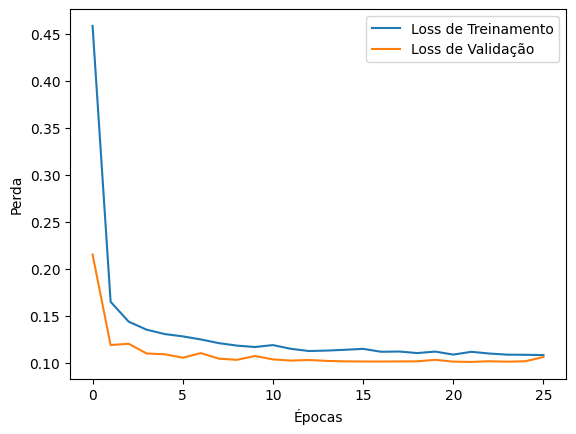

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1001
best_score_until_now 0.10009918361902237
Melhor solução encontrada até agora: [0.11393696]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


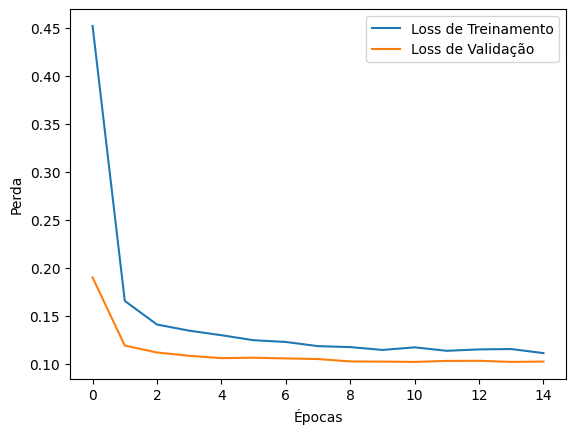

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0972
best_score_until_now 0.09715820103883743
Melhor solução encontrada até agora: [0.53736959]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


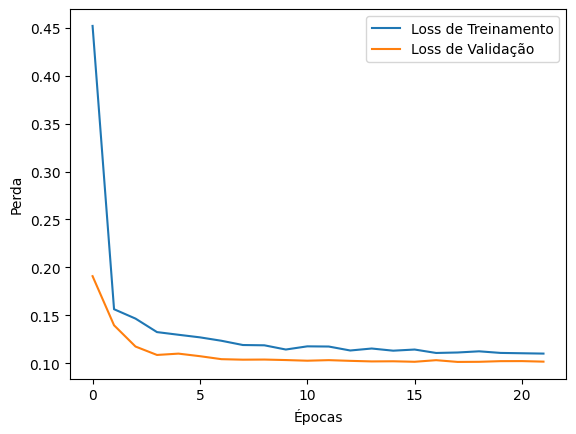

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0981
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


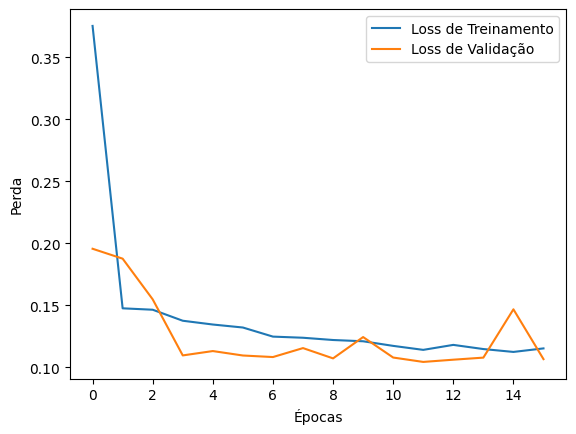

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


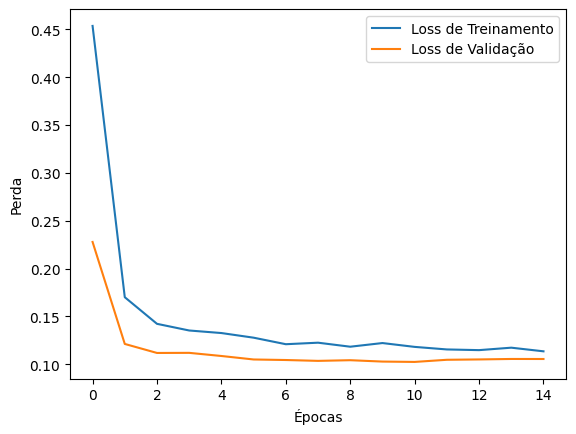

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0957
best_score_until_now 0.09565136581659317
Melhor solução encontrada até agora: [0.43521296]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


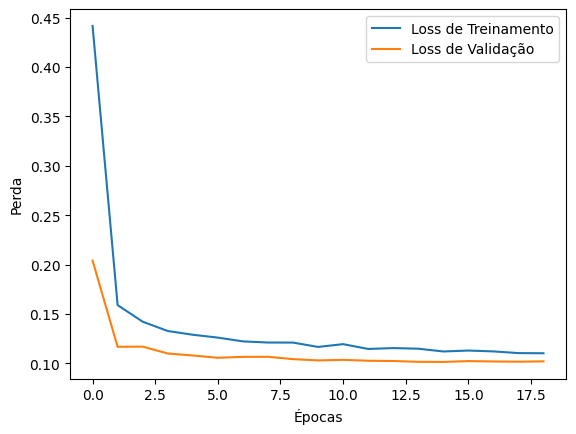

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0950
best_score_until_now 0.0949808657169342
Melhor solução encontrada até agora: [0.07634233]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


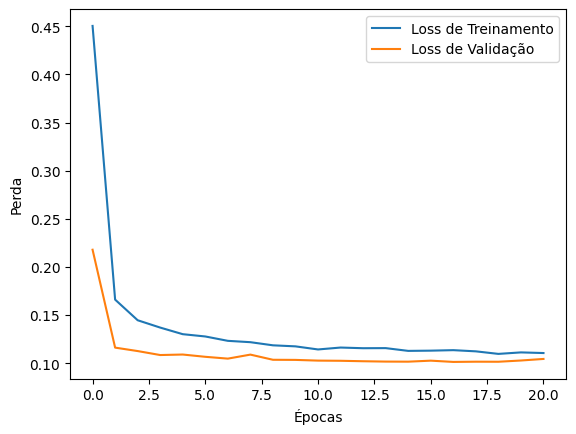

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0998
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


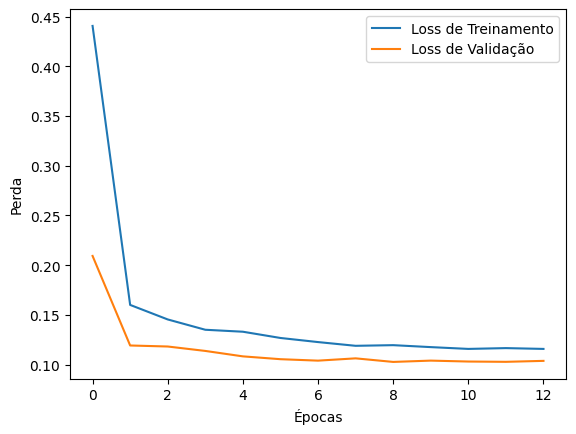

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1046
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


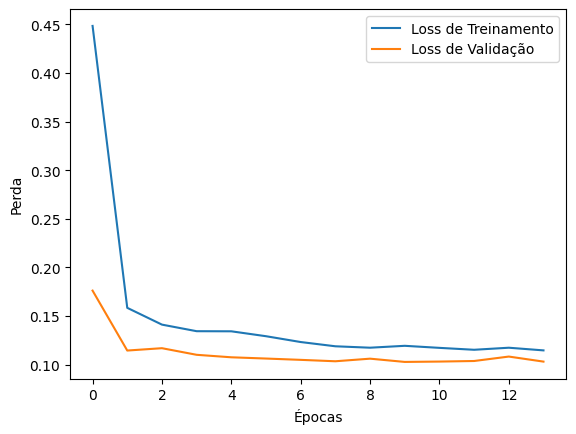

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1043
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


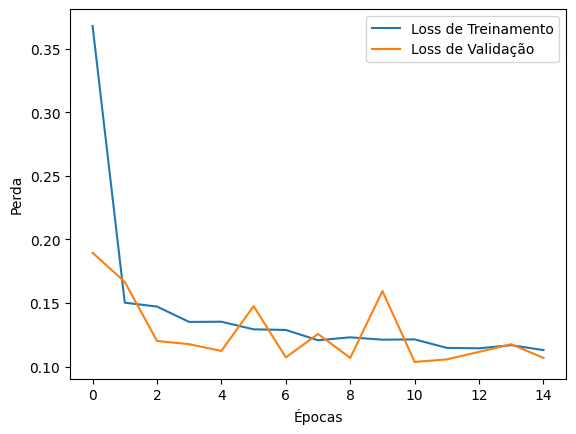

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0921
best_score_until_now 0.09212548285722733
Melhor solução encontrada até agora: [1.27295069]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


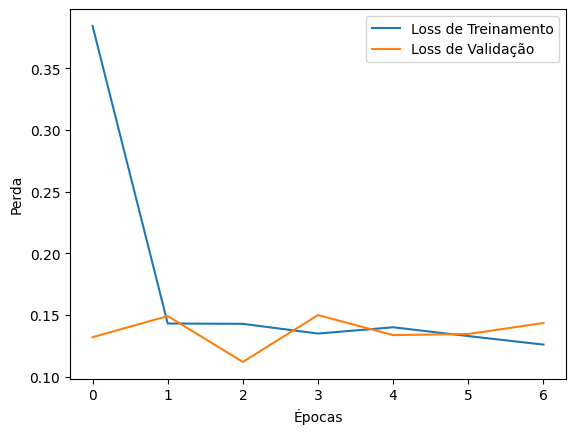

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1092
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


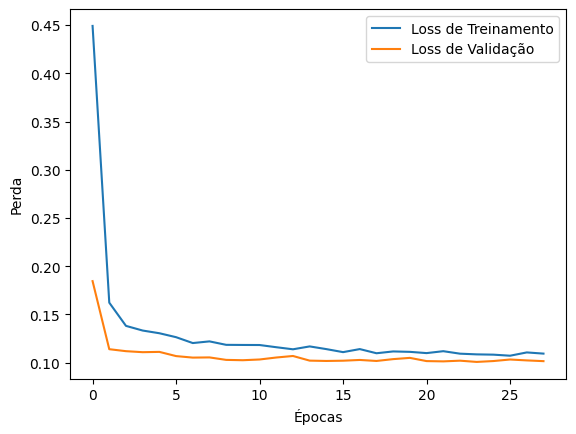

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0995
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


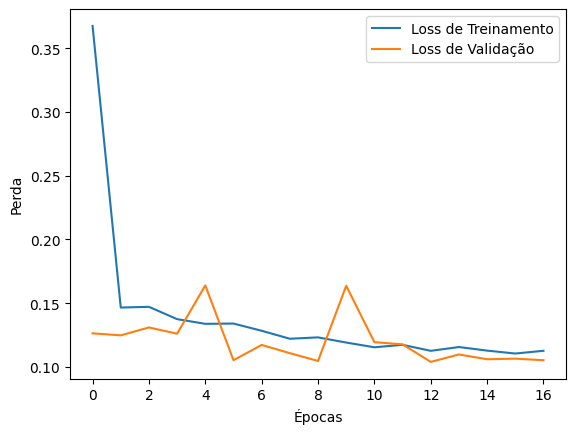

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1046
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


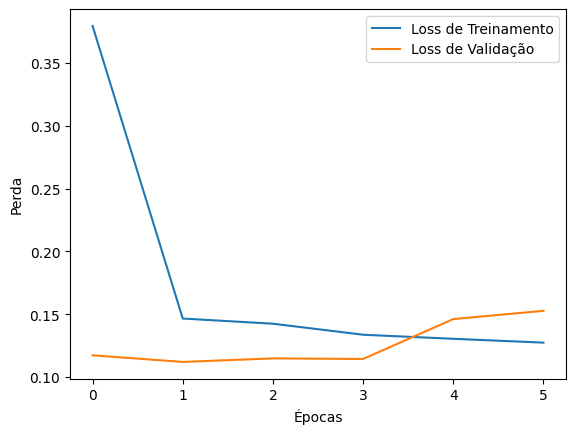

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1092
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


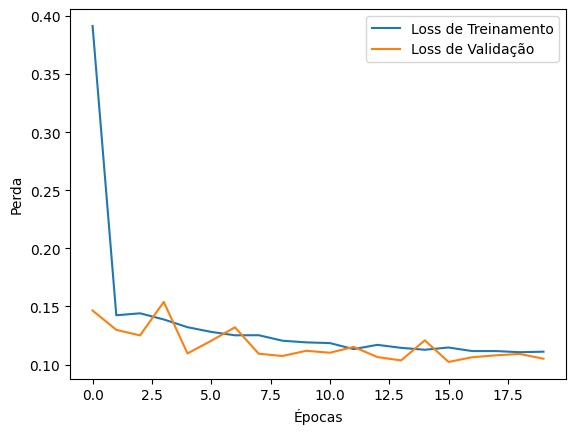

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0866
best_score_until_now 0.08661351352930069
Melhor solução encontrada até agora: [1.91353446]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


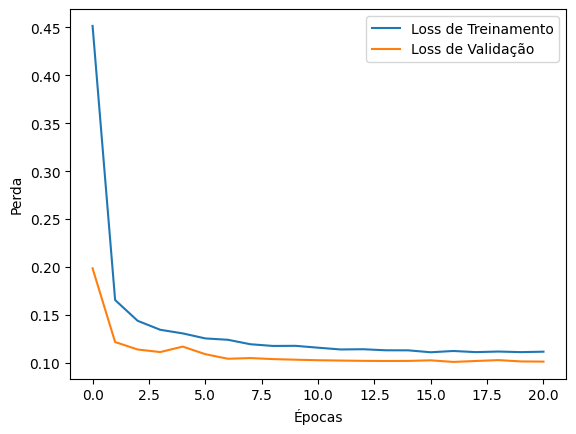

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0964
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


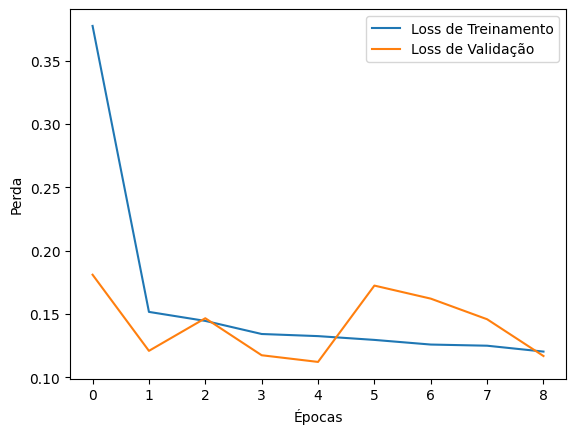

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0753
best_score_until_now 0.07529953122138977
Melhor solução encontrada até agora: [1.30716069]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


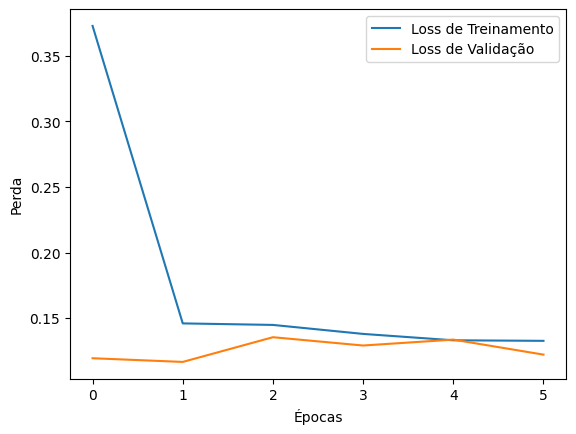

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1327
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


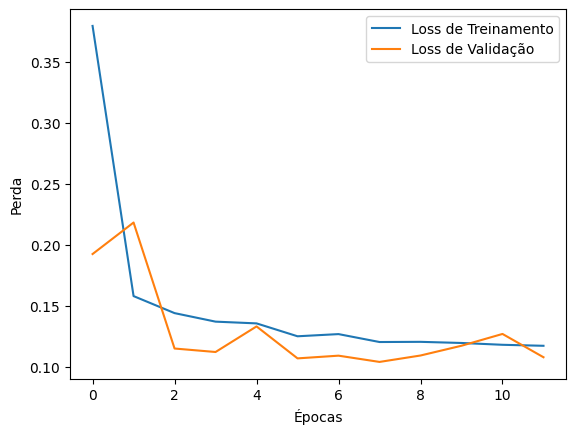

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1100
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


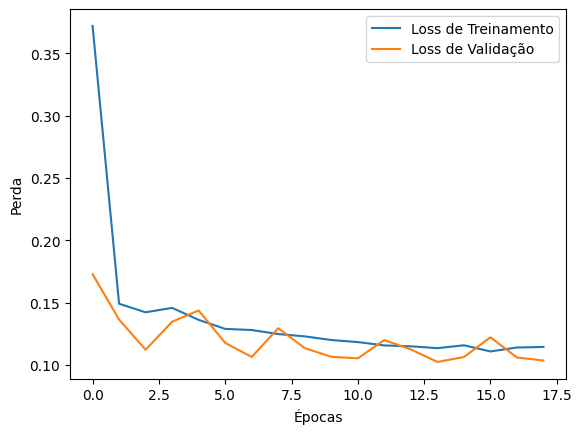

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0955
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


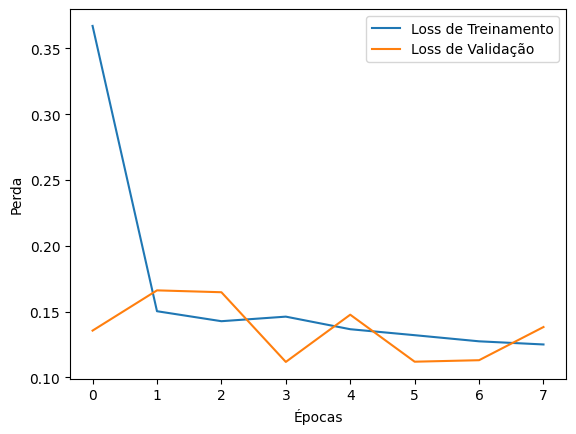

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0962
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


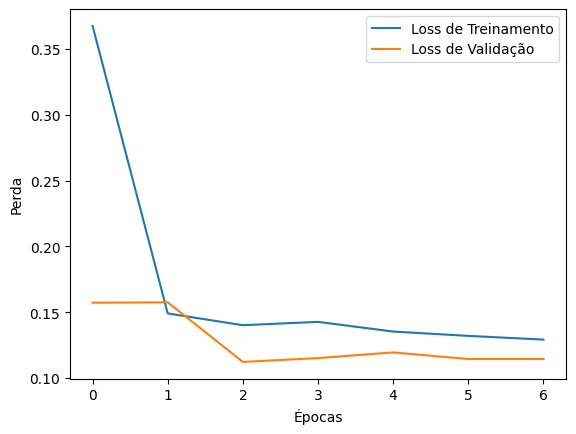

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0932
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


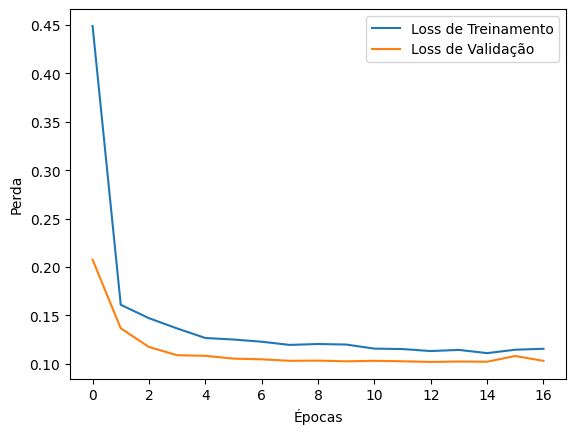

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0965
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


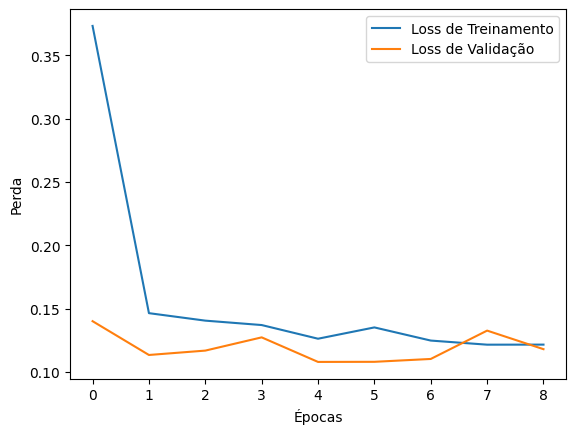

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0934
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


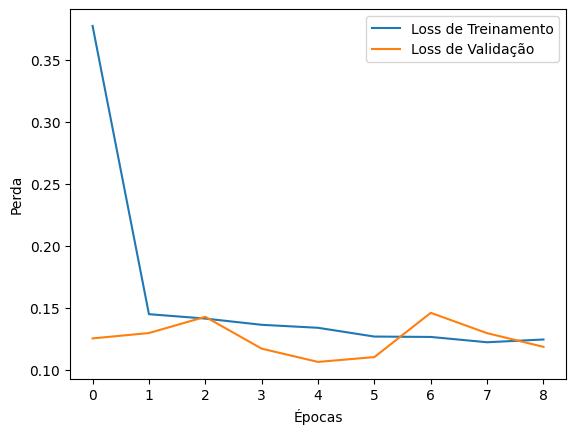

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1105
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


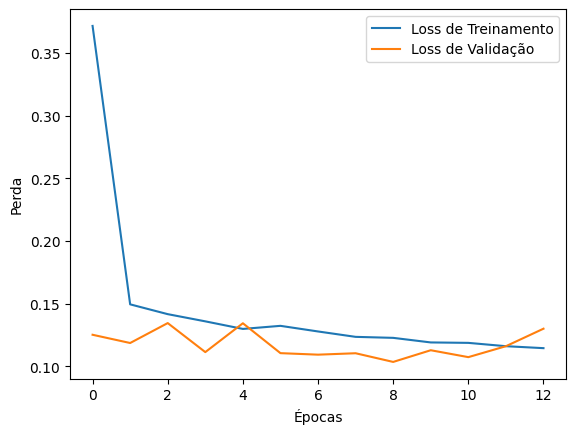

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0845
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


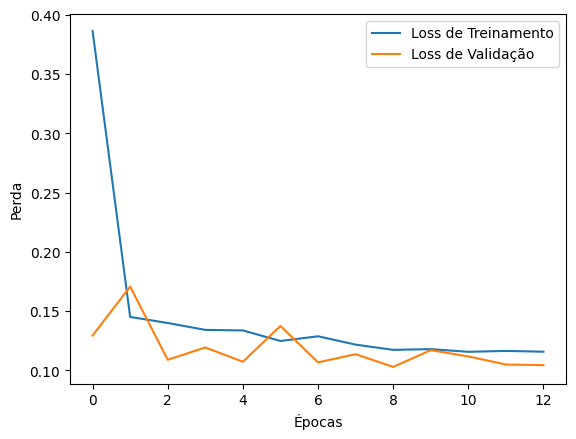

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0997
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


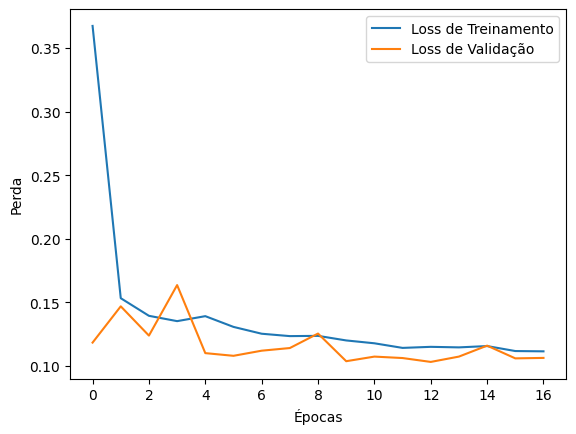

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0888
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


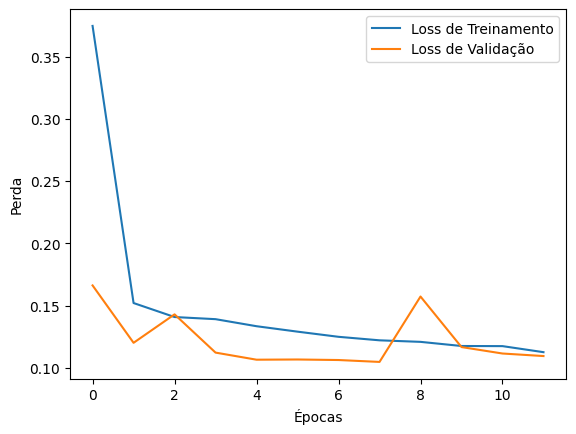

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0922
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer sgd


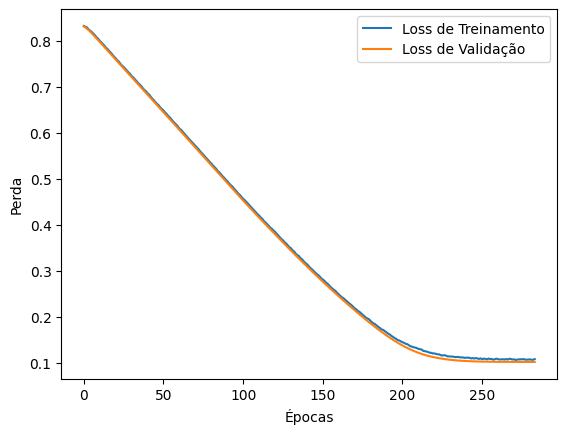

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0975
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


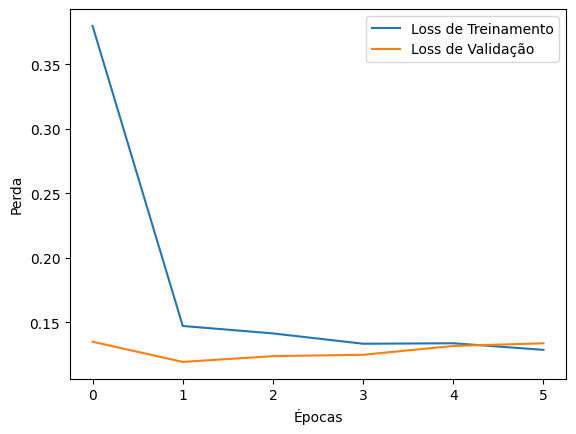

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0813
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


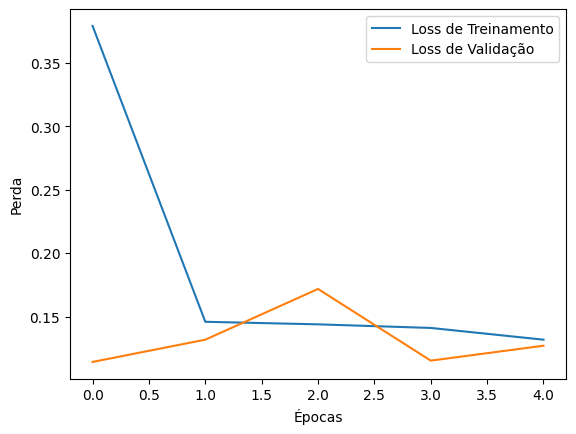

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1027
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


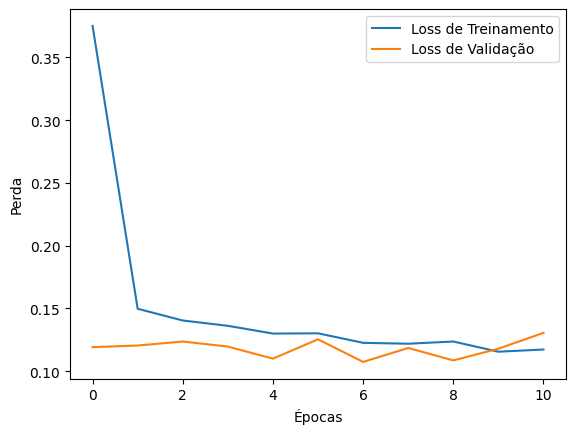

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1215
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


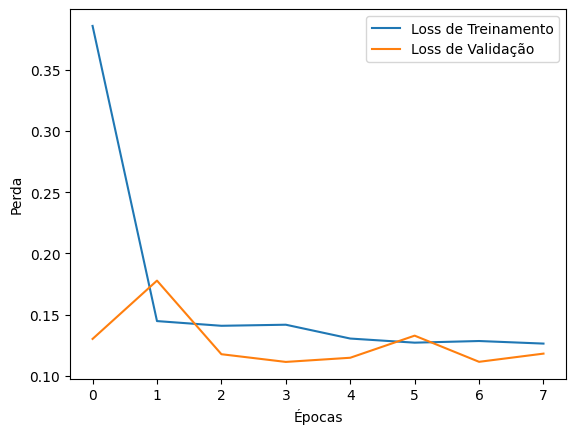

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1146
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


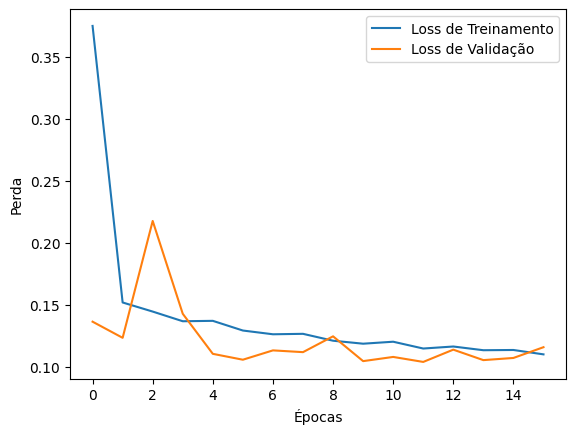

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1030
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


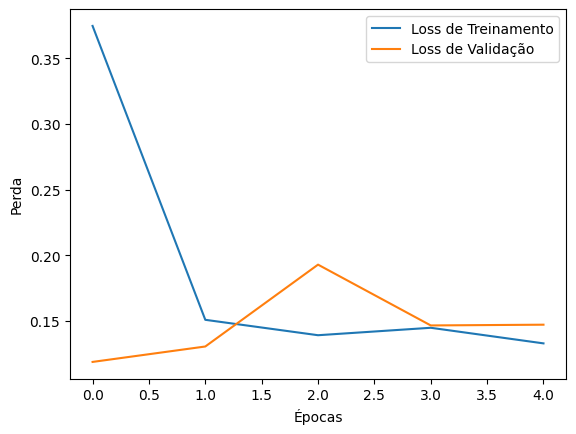

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0903
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


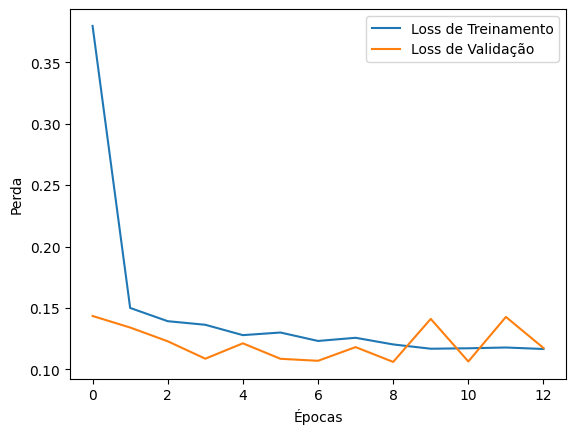

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0830
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


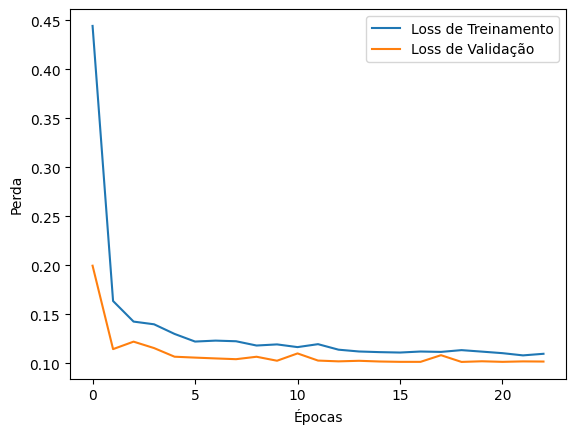

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0914
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


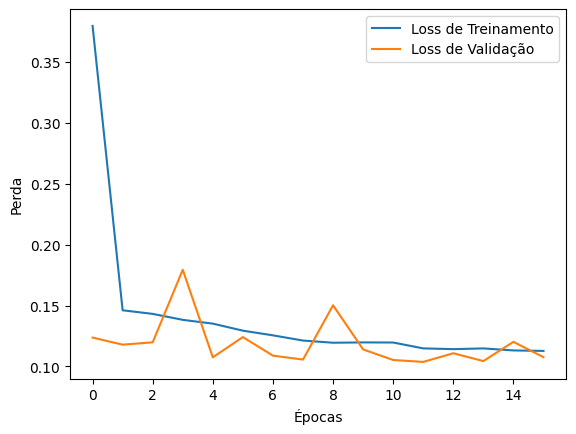

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1071
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer sgd


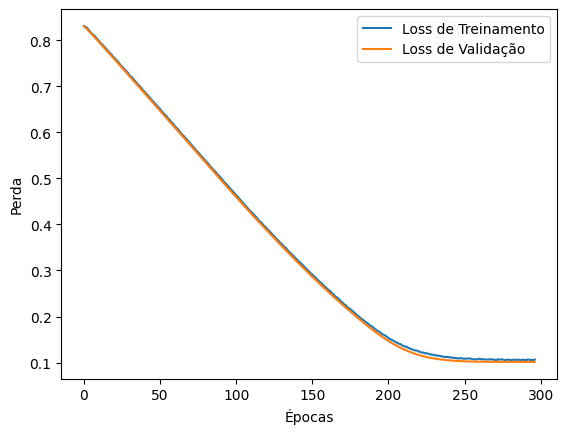

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0961
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


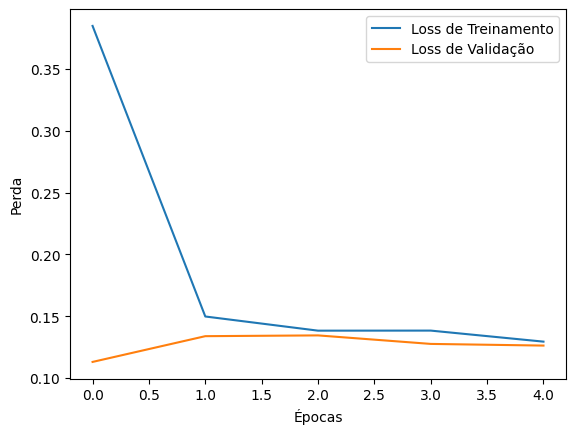

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1016
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


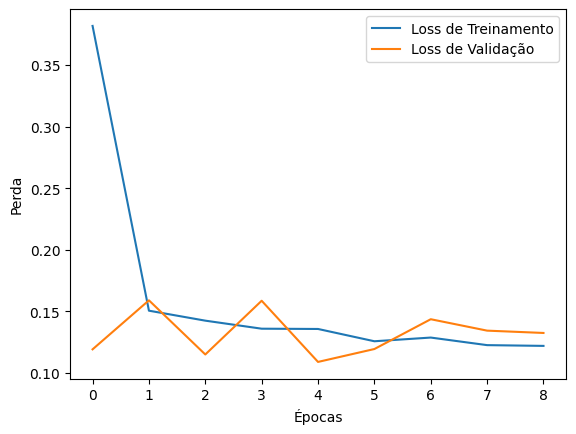

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1006
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


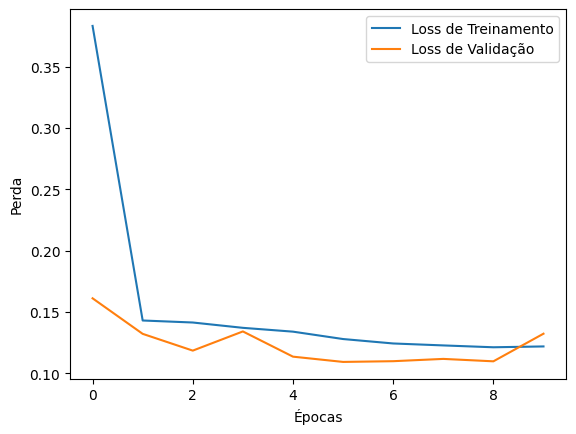

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0756
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


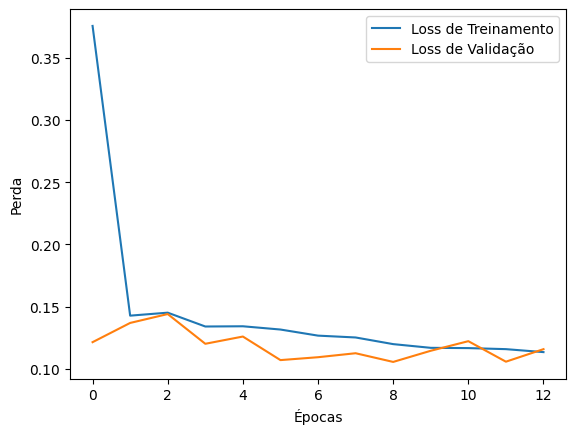

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0980
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


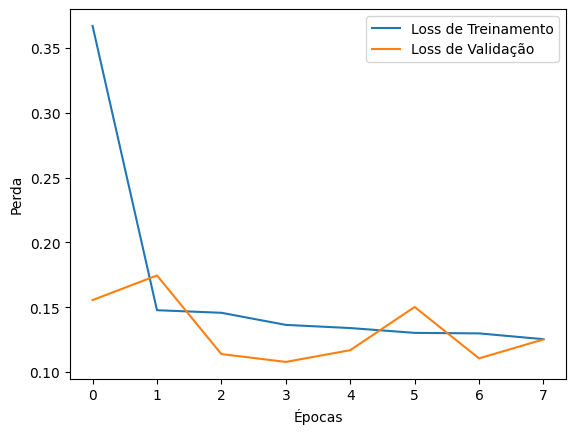

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1047
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


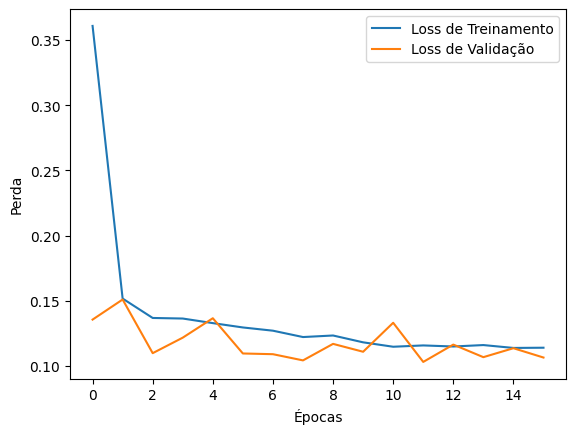

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0916
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


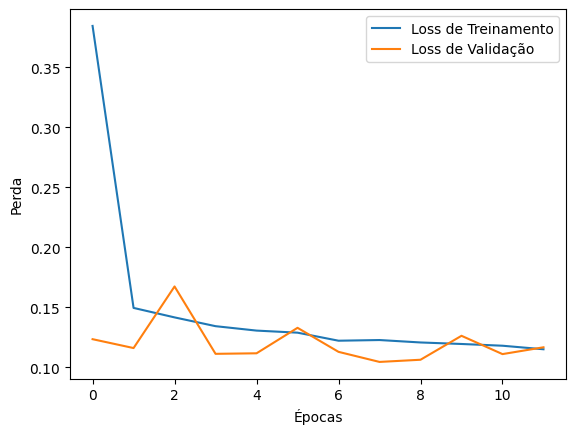

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0962
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


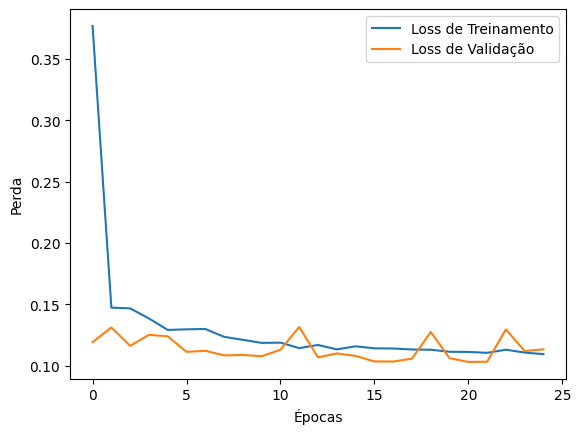

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1106
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


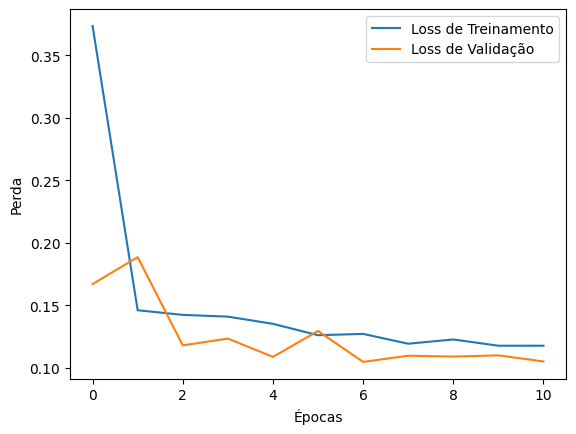

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1019
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


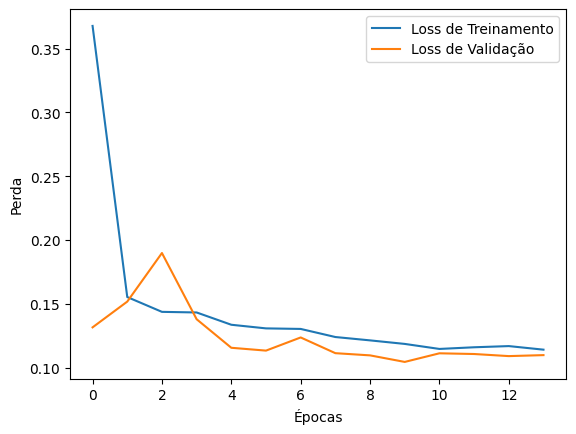

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1060
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


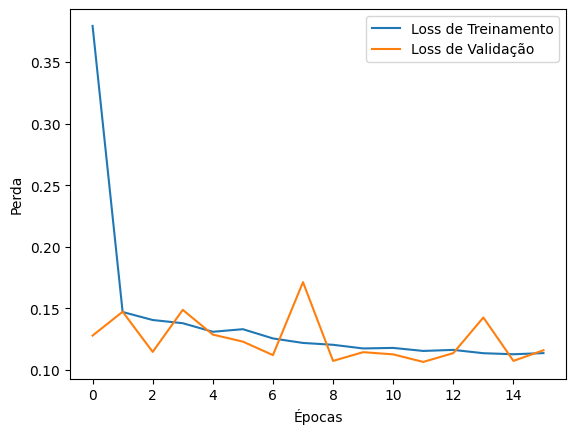

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1066
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


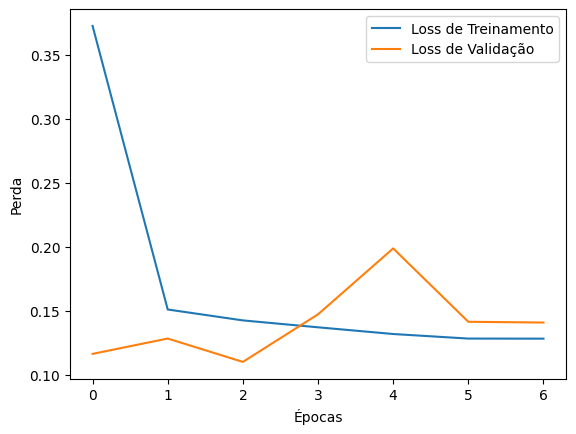

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1073
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


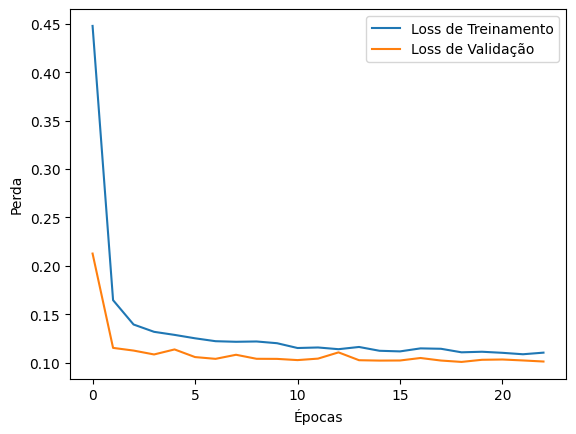

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1007
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


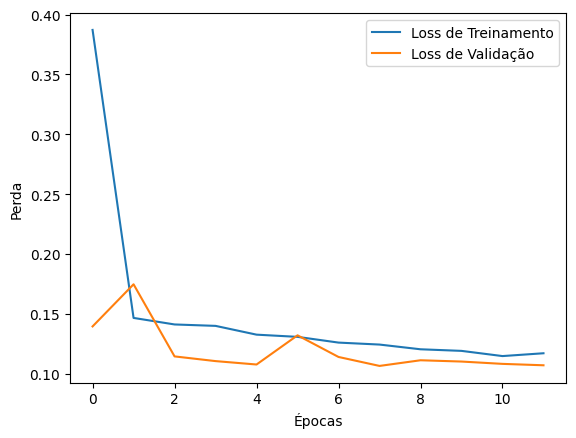

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0970
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


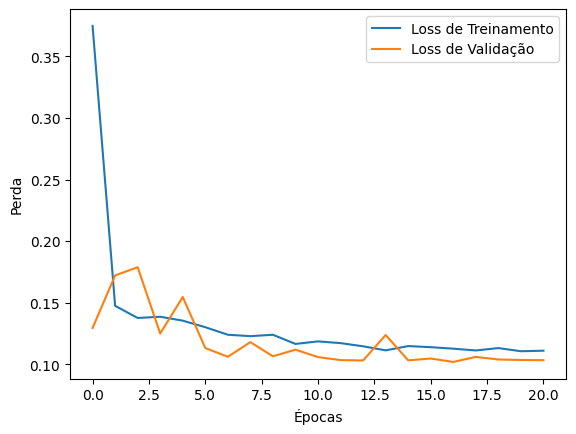

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0950
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


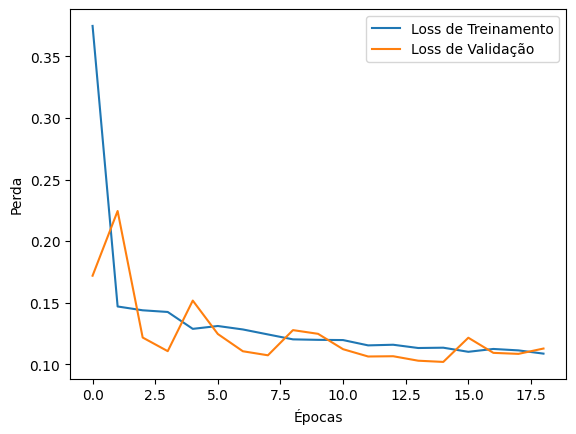

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0974
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


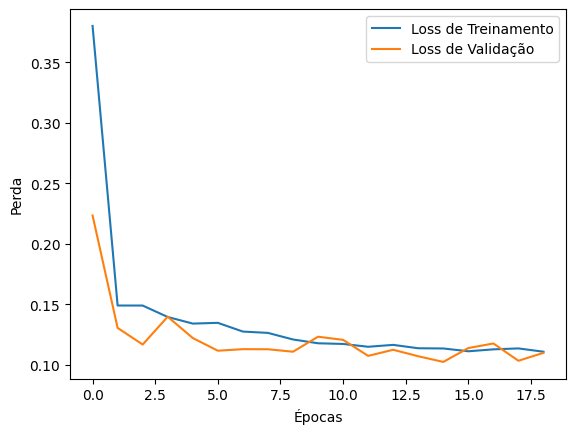

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1012
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


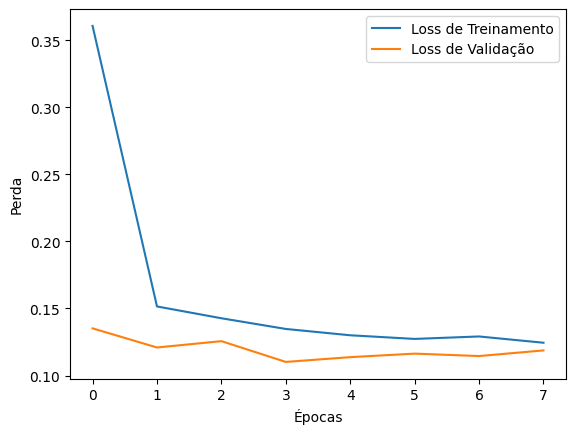

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1168
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


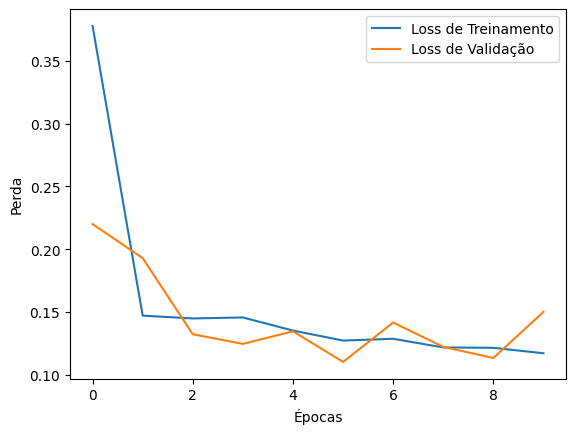

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1202
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


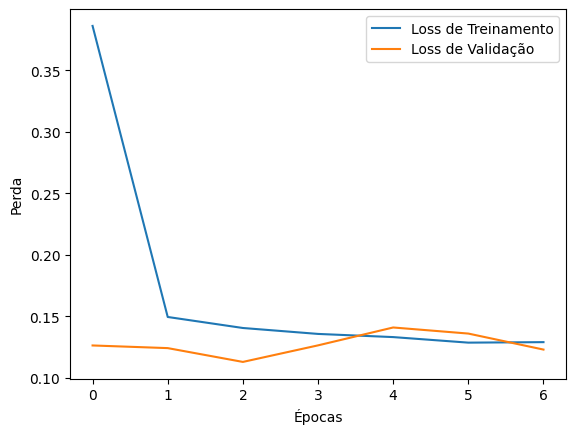

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1243
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


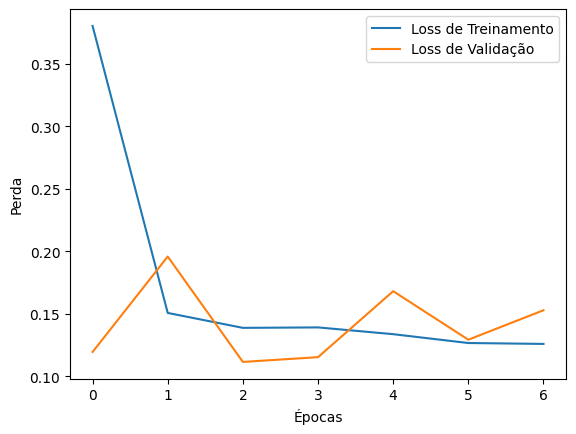

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0981
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


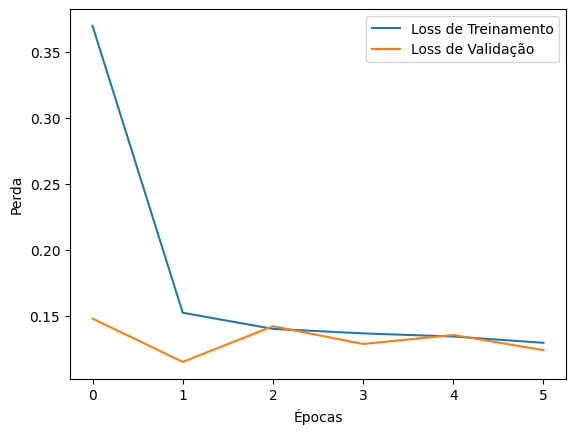

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1140
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


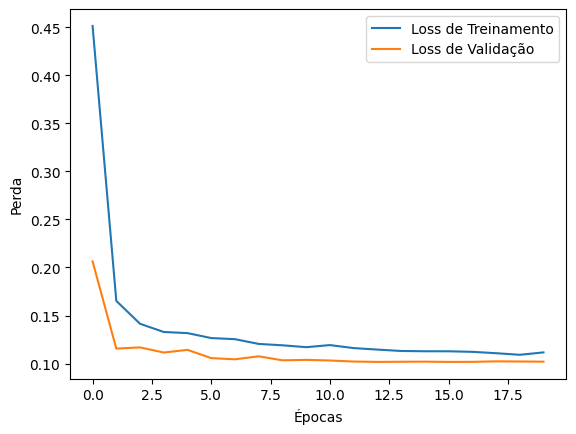

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0833
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


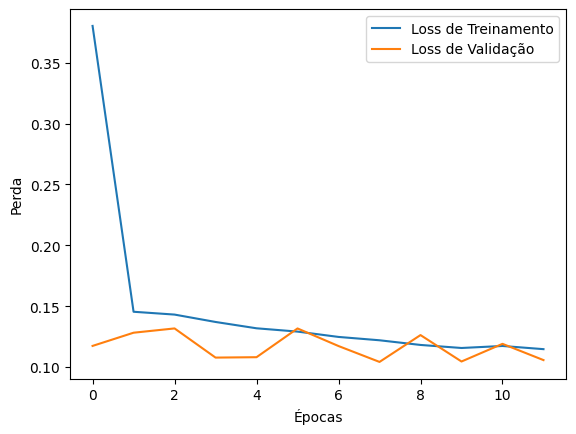

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0893
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


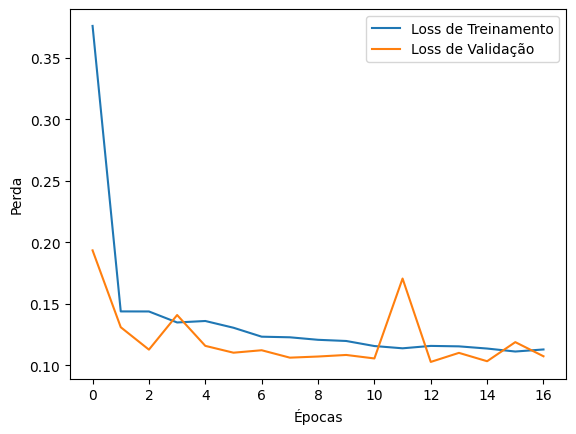

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1008
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


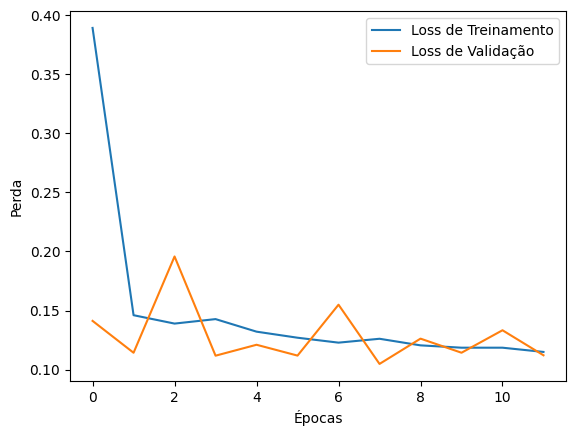

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1106
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


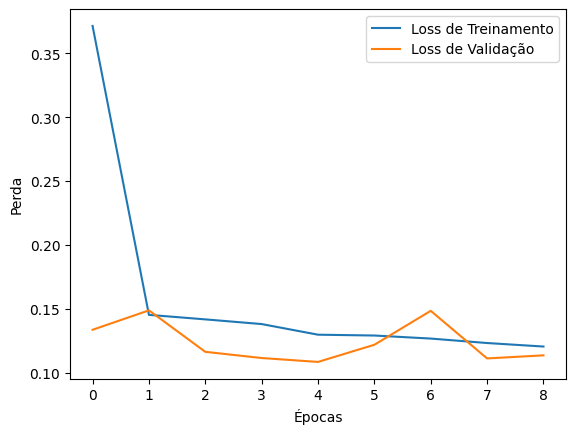

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1162
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


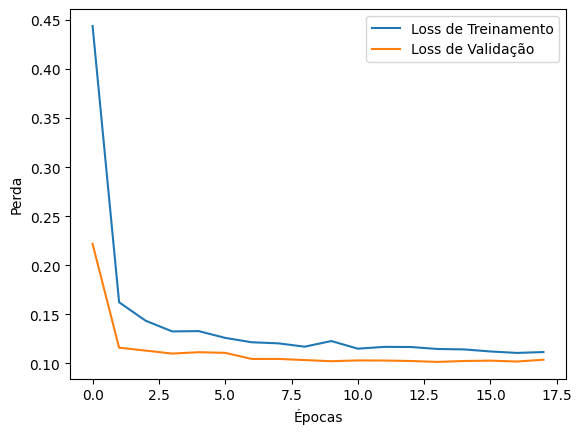

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1021
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


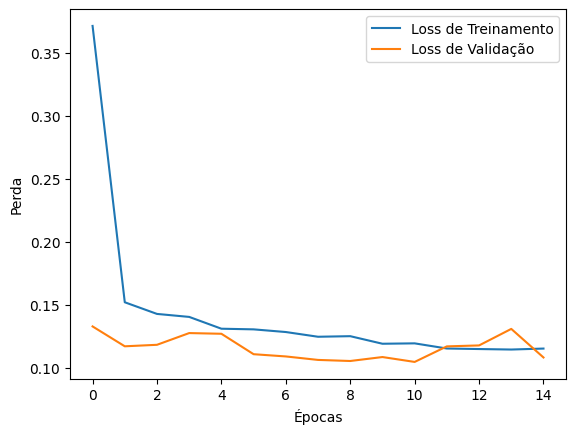

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1041
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


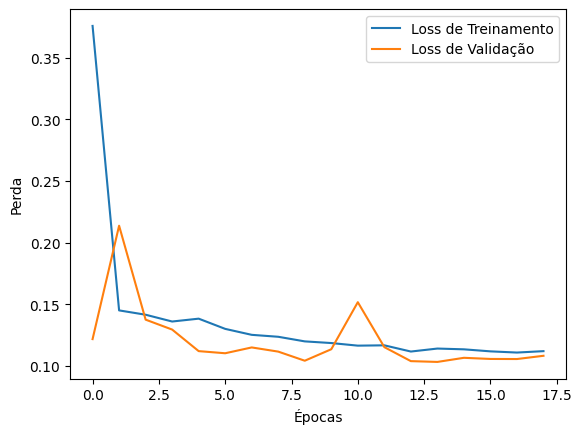

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0905
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


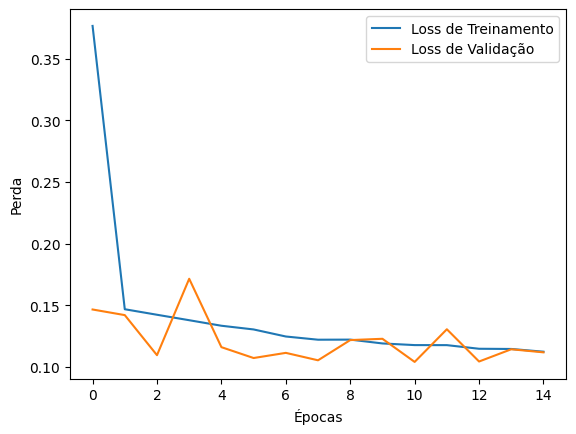

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1131
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


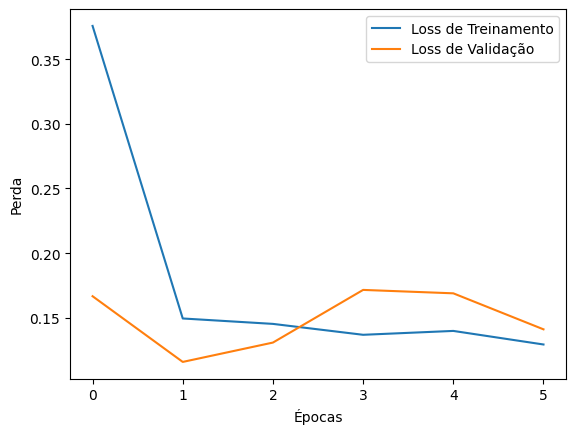

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1045
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


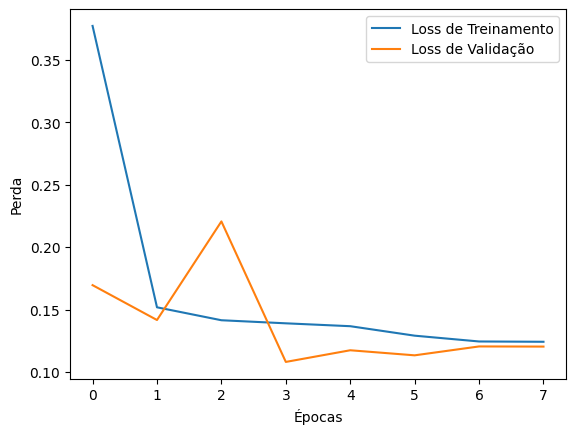

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1145
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


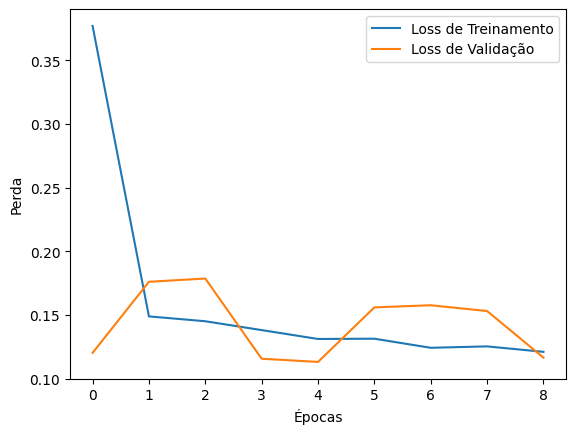

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0832
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


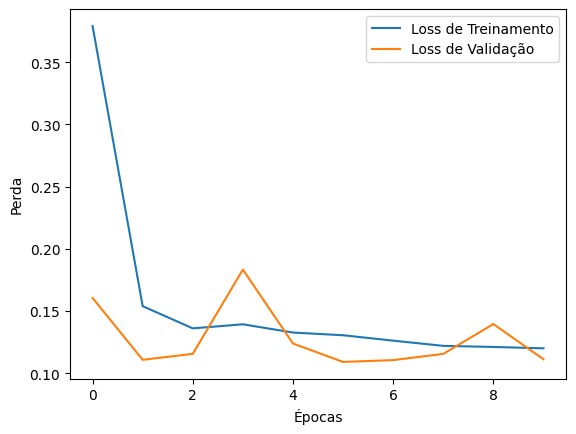

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1055
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


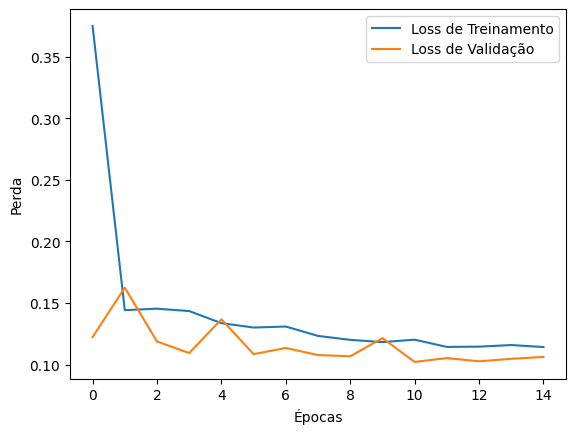

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0951
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


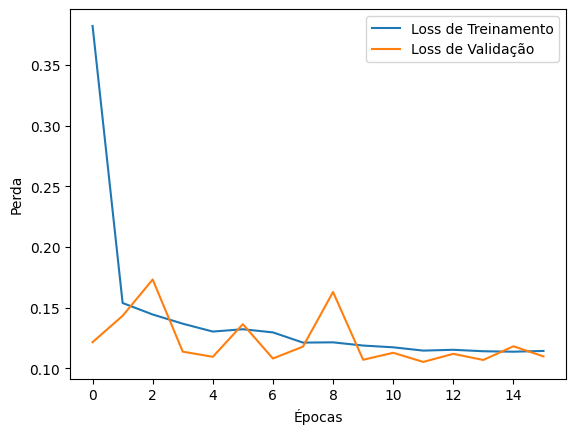

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1157
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


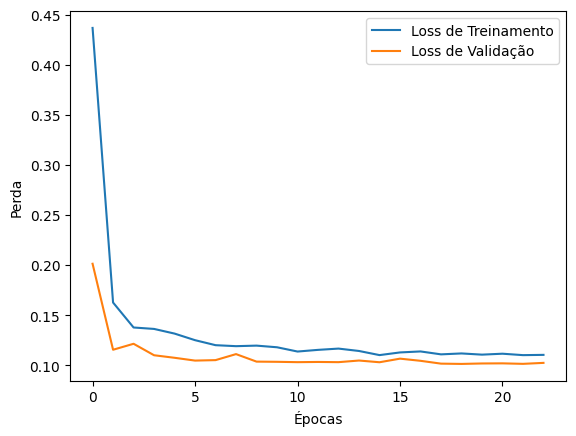

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0963
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


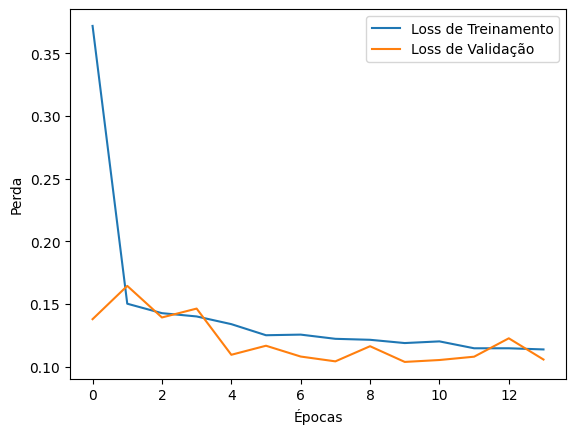

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1094
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


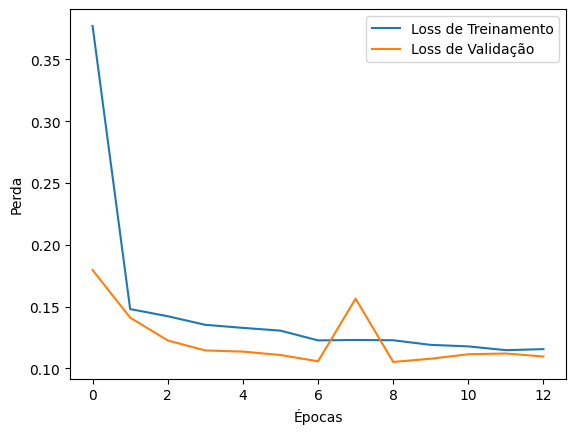

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0929
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


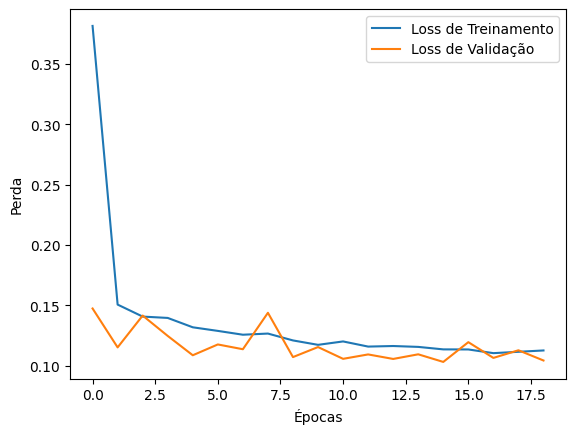

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0992
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


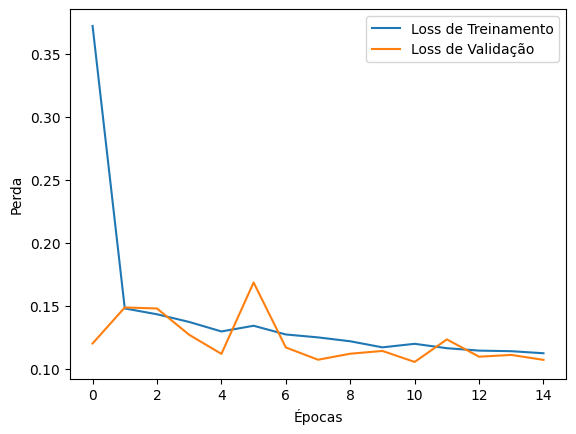

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1161
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


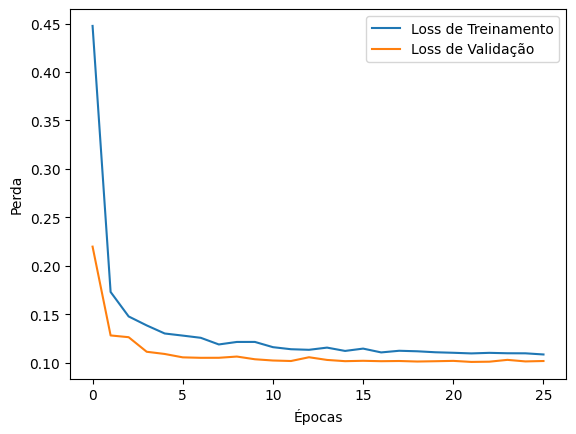

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0966
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


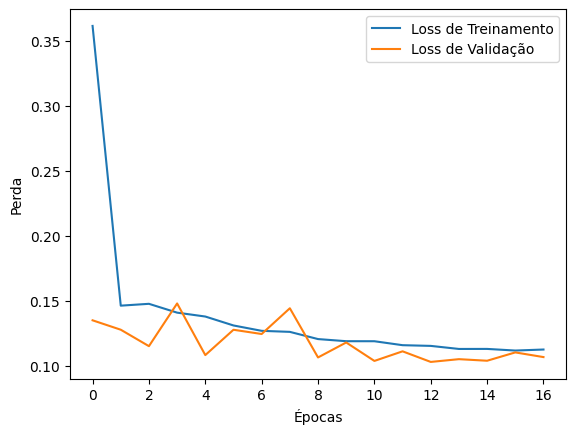

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1129
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


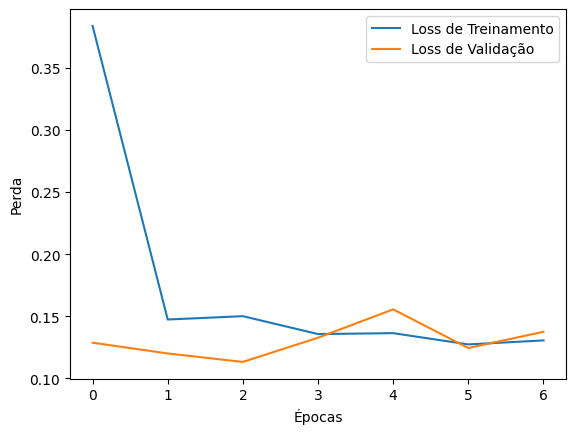

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1195
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


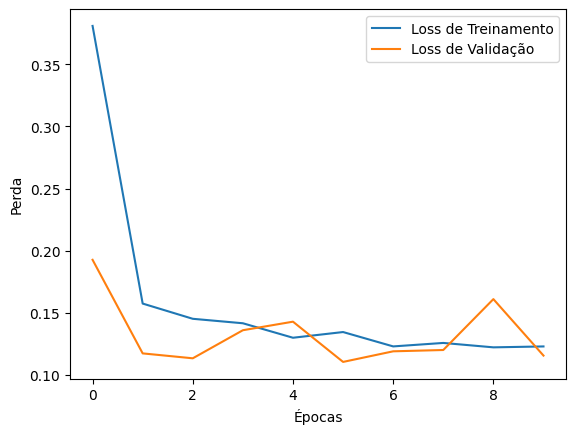

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1287
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


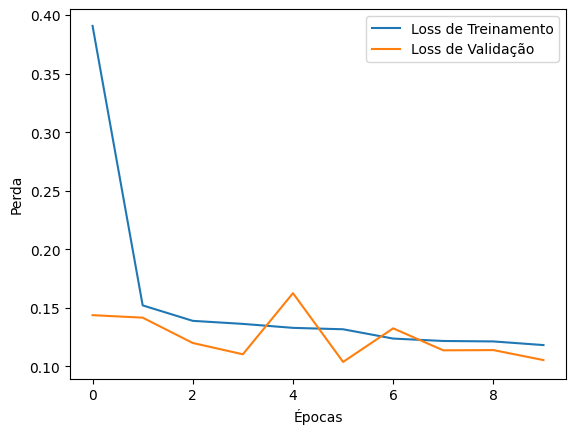

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0988
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


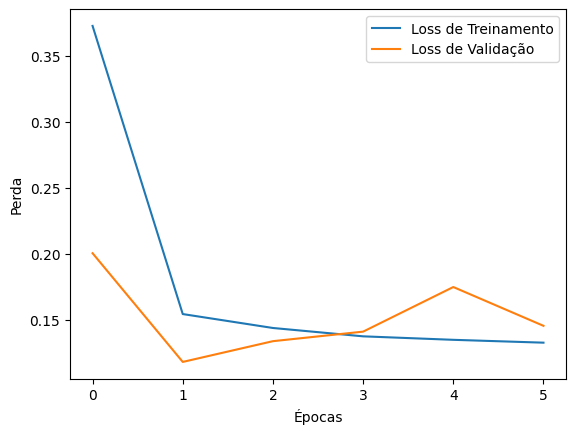

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1396
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


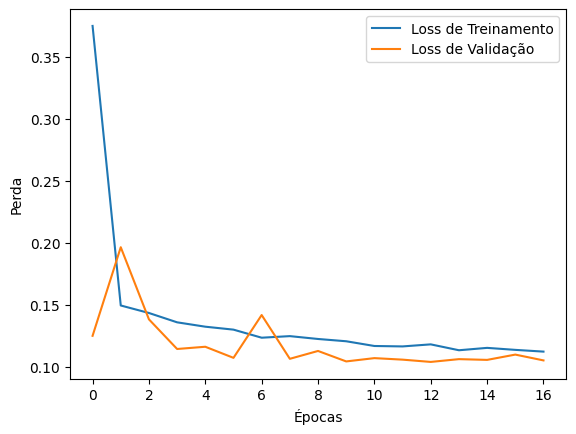

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1006
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


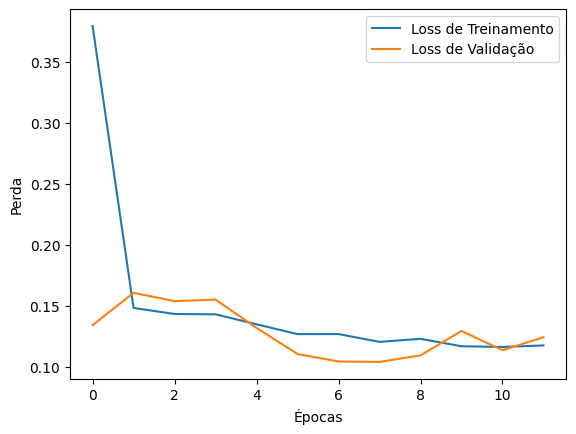

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1132
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


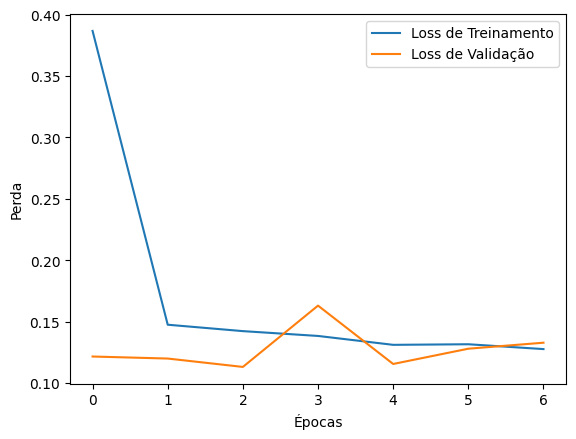

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1124
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


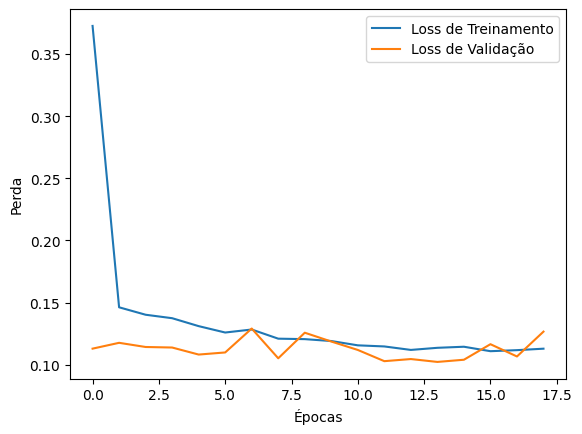

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0968
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


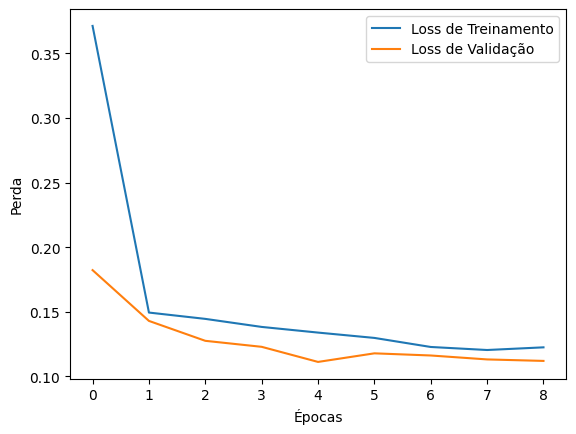

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1216
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


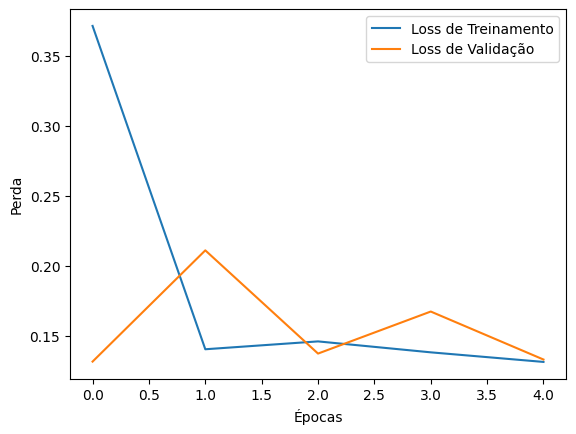

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0613
best_score_until_now 0.061280012130737305
Melhor solução encontrada até agora: [1.25940527]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


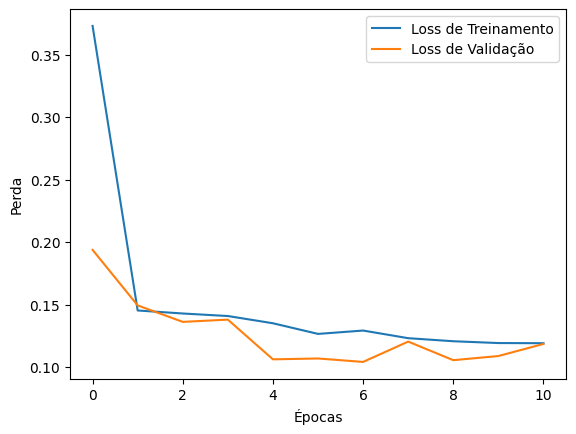

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1060
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


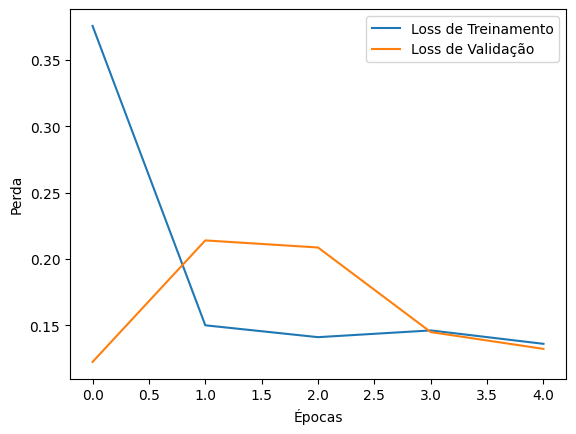

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1379
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


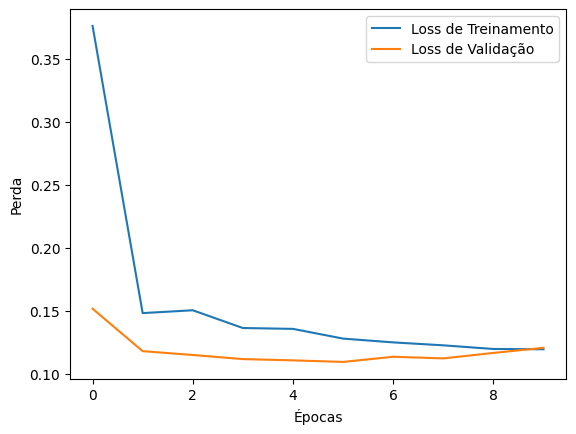

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1167
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


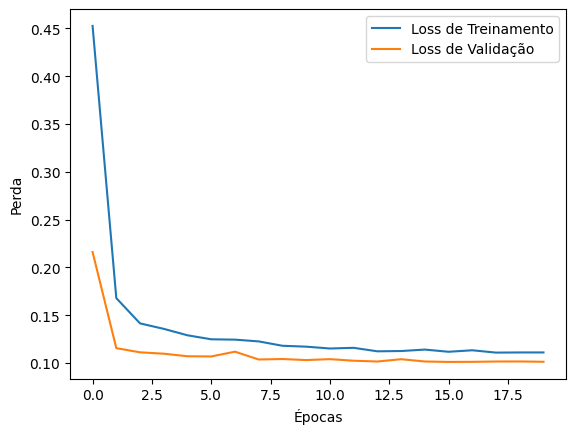

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0911
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


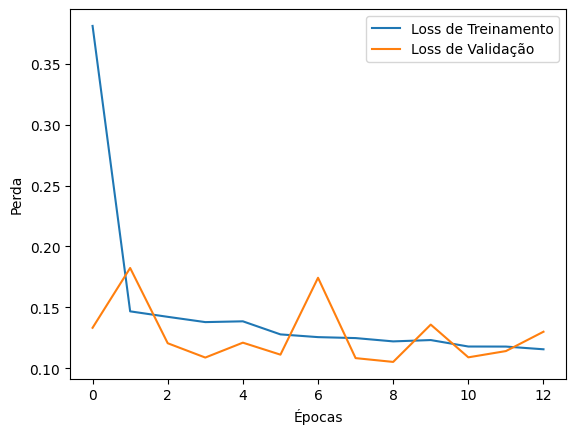

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0947
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


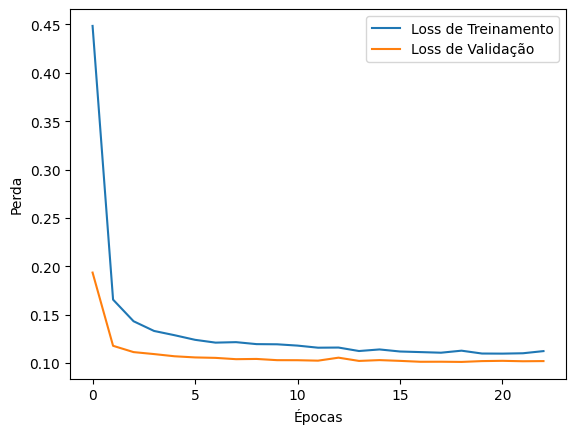

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0971
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


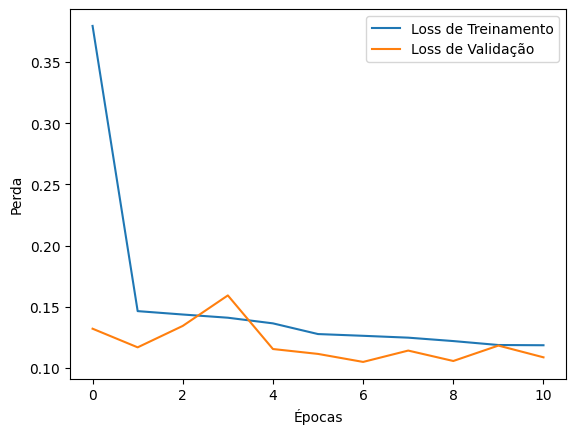

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0899
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


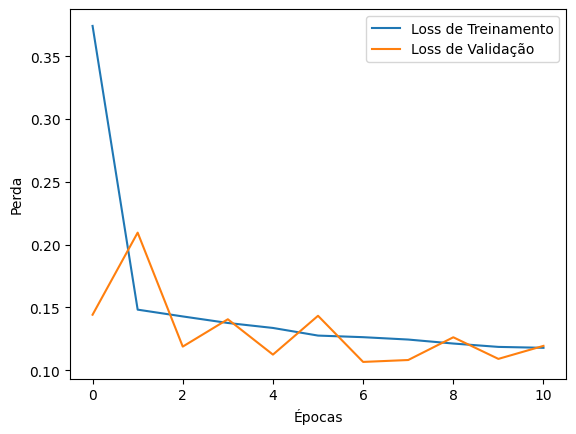

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0914
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


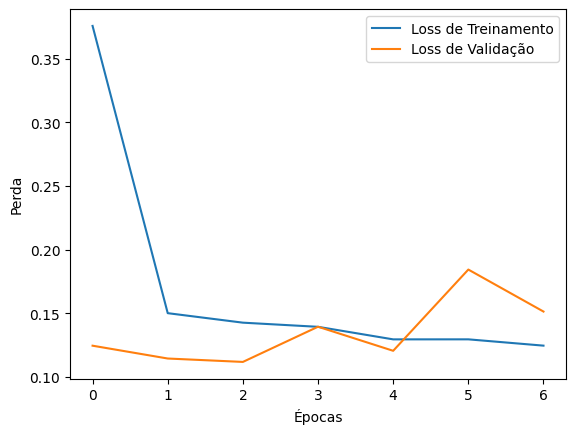

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1171
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


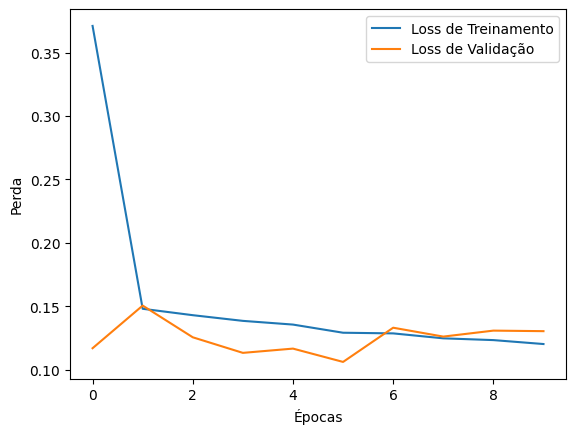

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0895
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


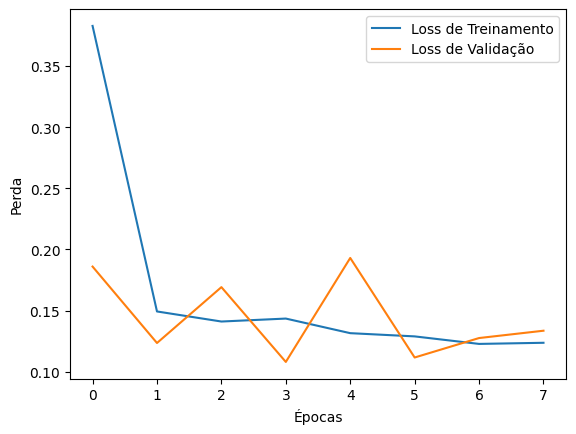

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1109
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


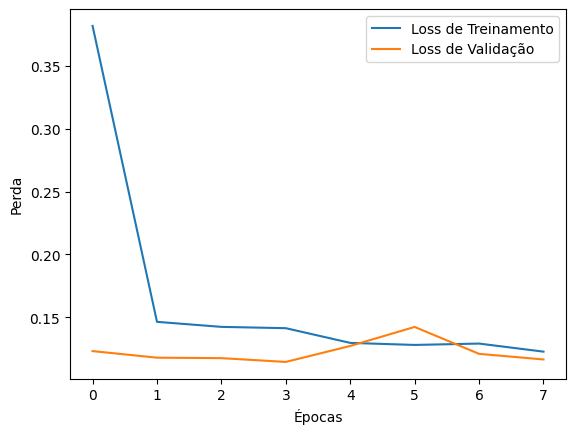

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0766
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


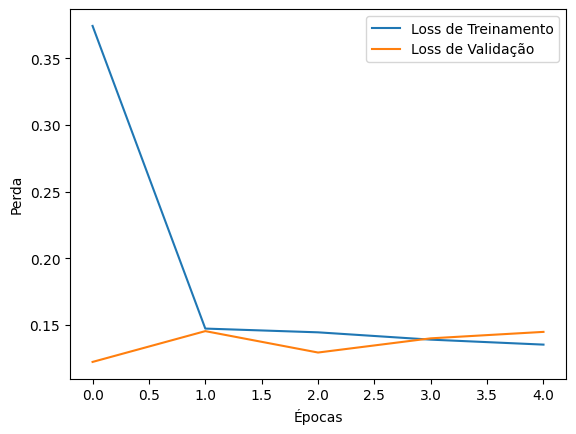

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0772
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


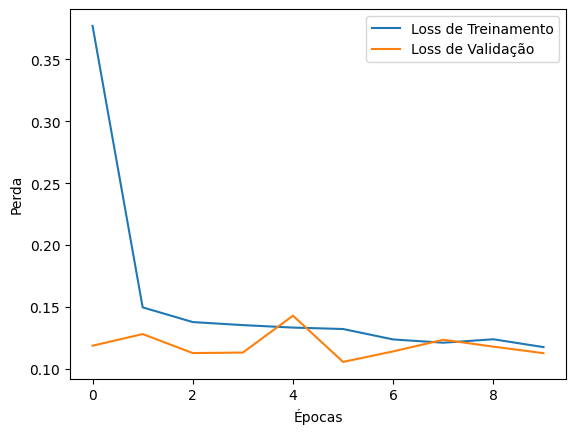

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1087
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


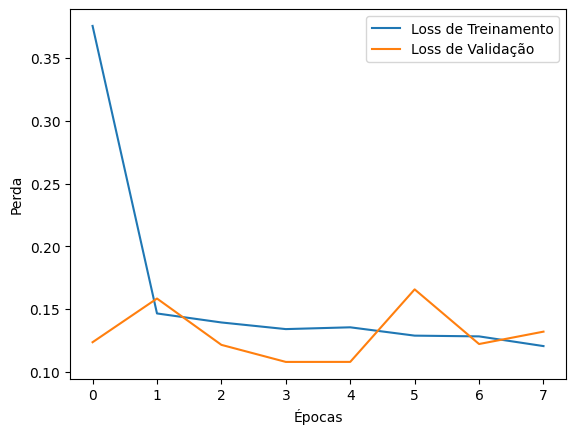

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1048
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


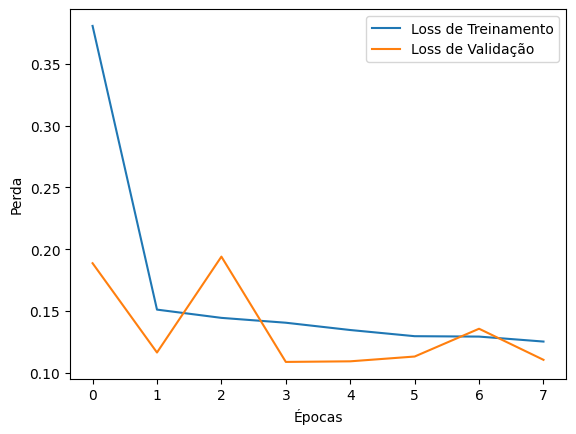

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1223
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


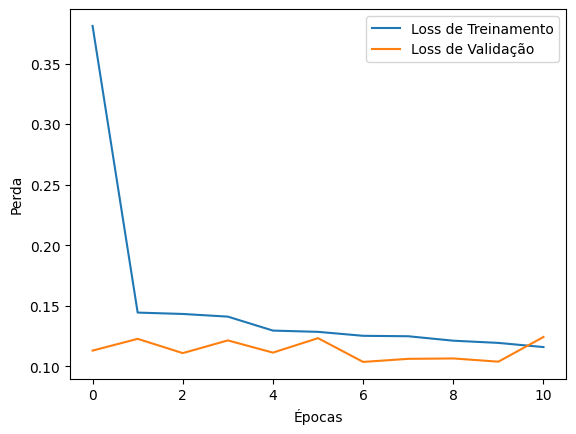

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1011
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


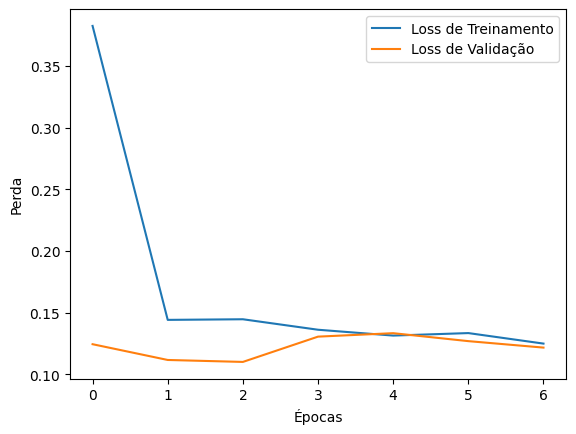

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1195
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


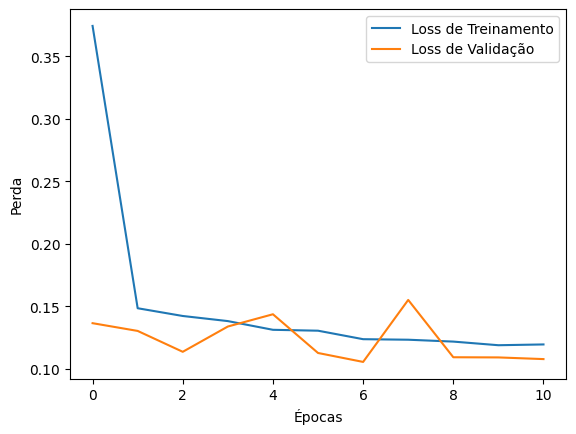

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1039
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


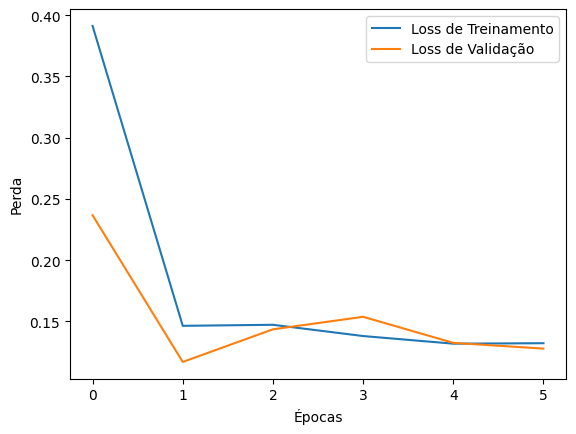

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1030
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


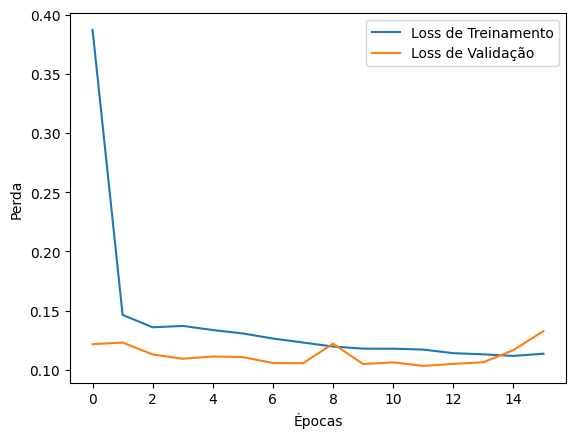

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0980
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


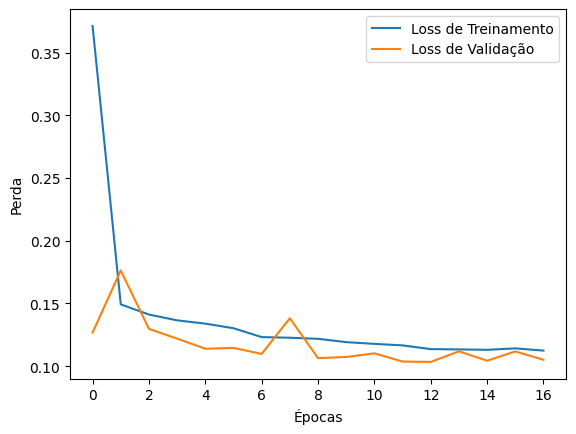

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0912
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


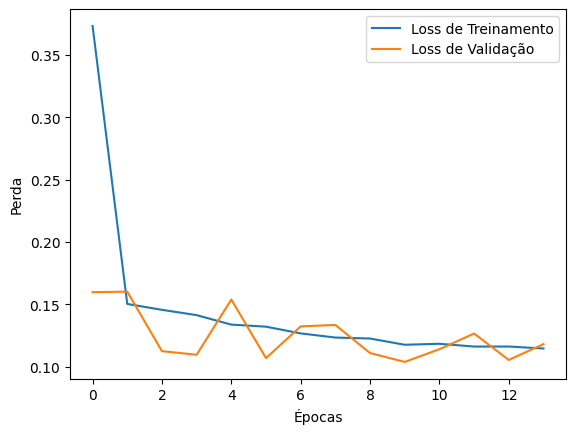

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0878
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


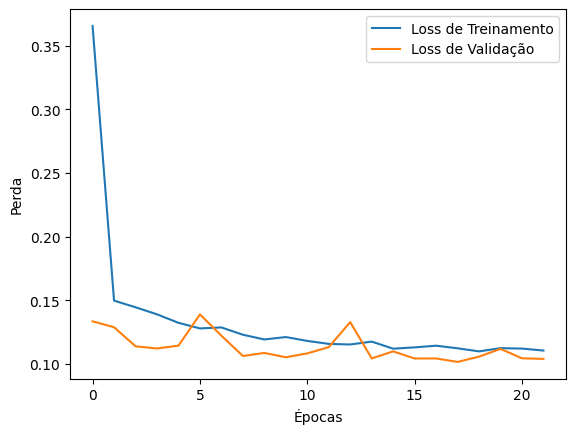

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1000
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


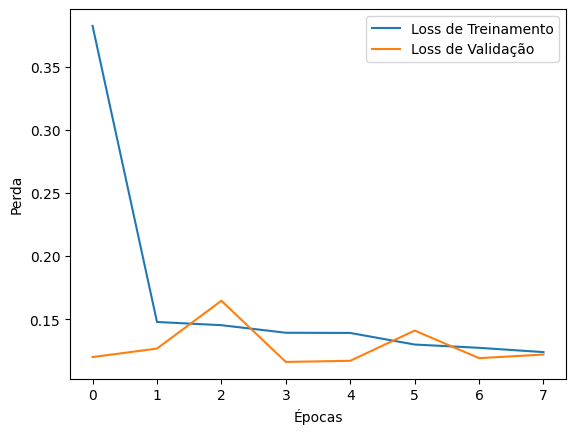

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1387
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


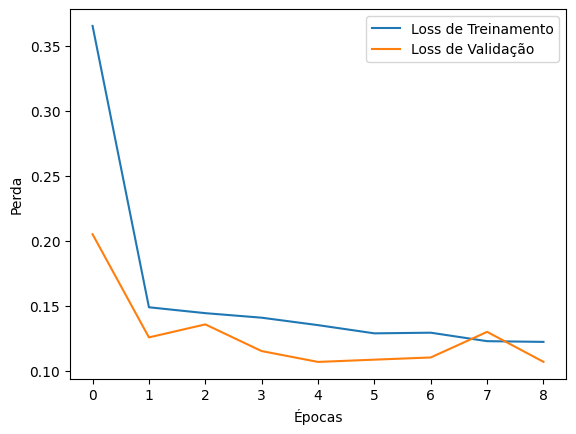

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1138
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


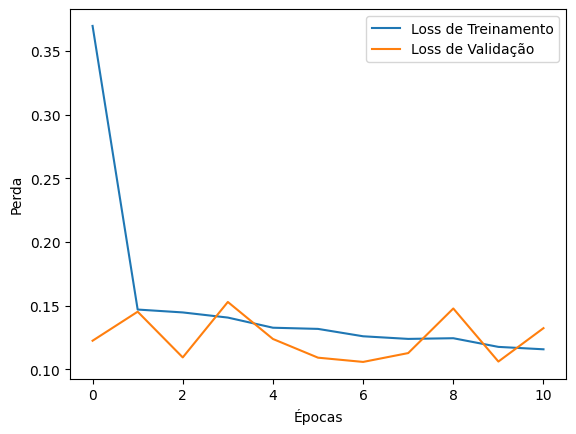

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0961
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


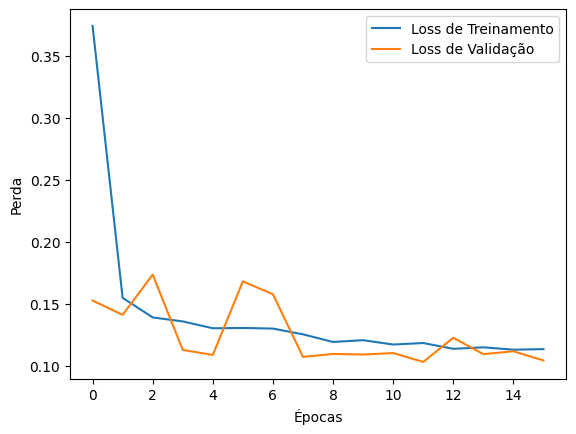

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0808
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


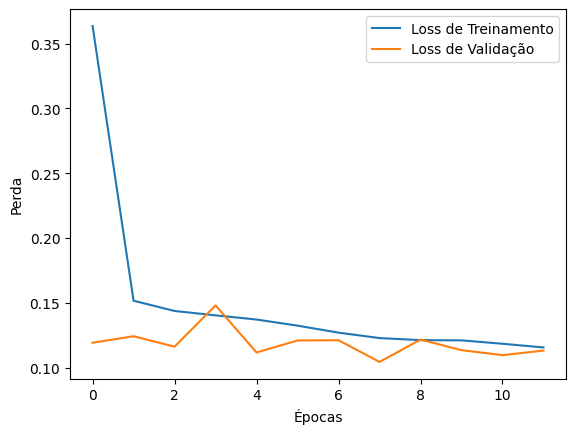

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0943
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


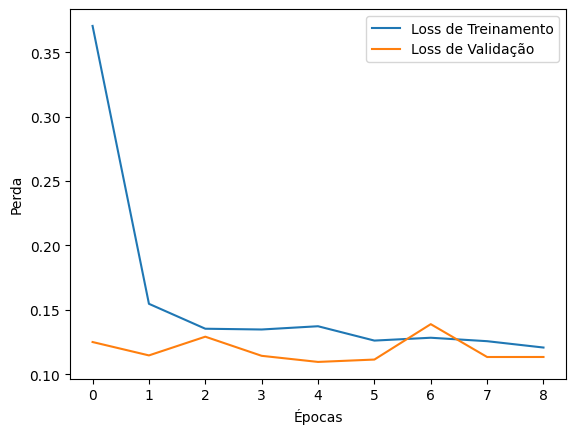

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1279
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


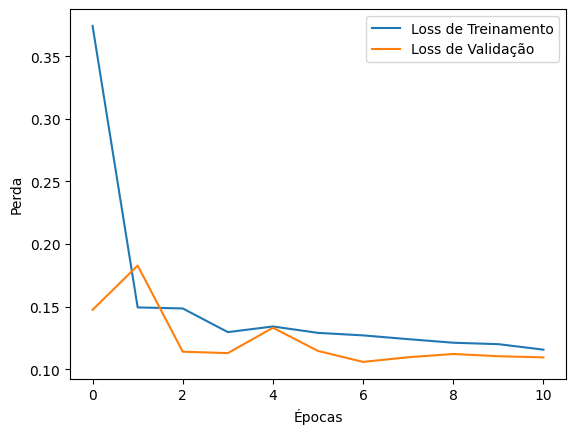

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0909
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


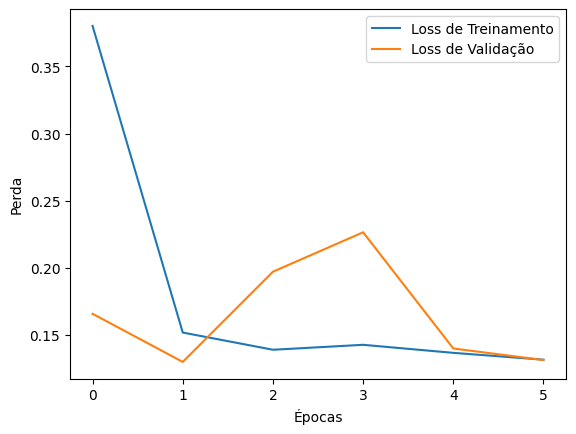

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0725
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


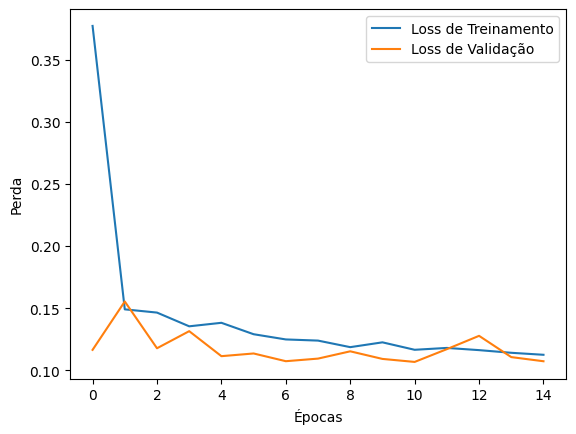

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1208
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


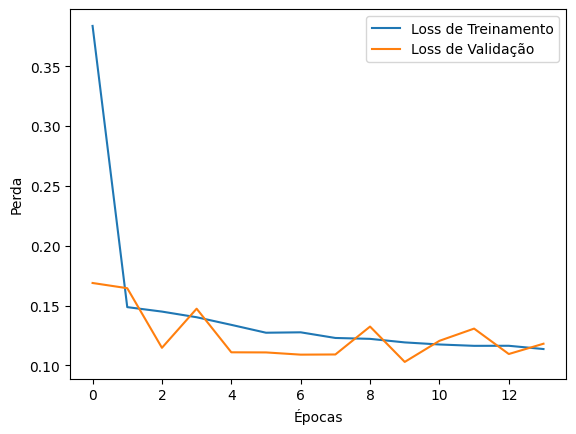

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0980
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


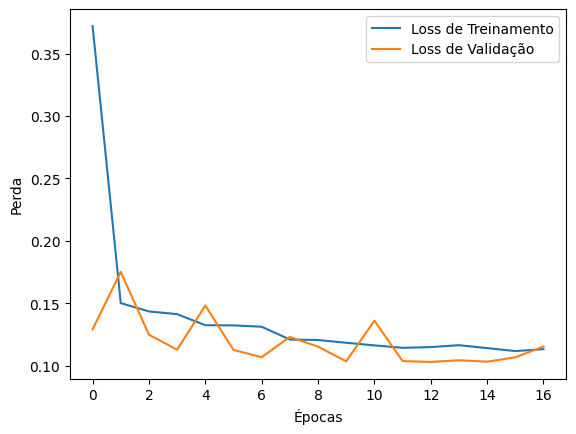

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0912
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


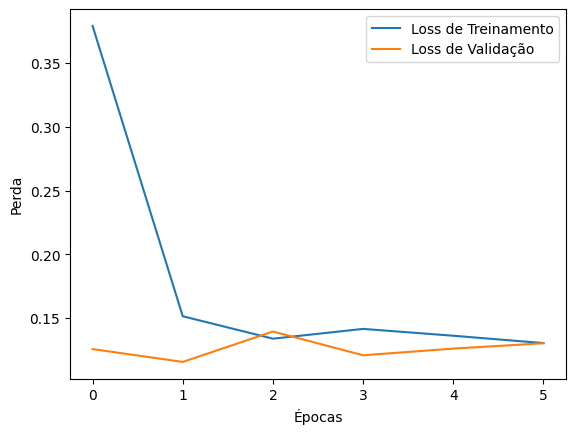

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1065
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


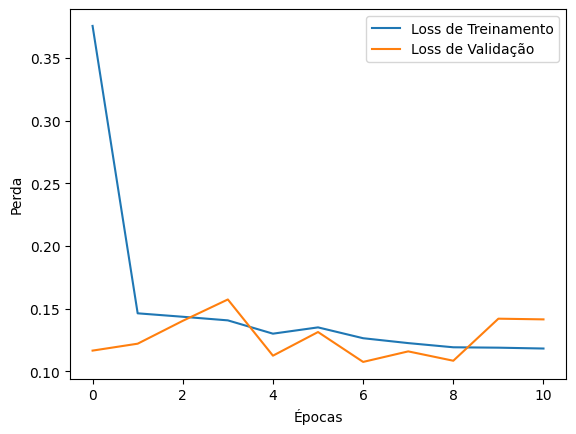

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0943
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


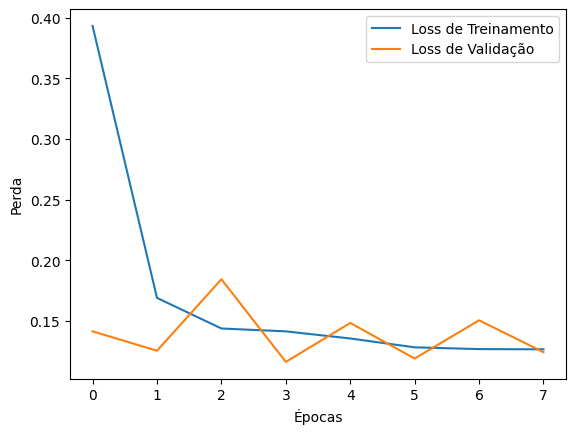

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0825
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


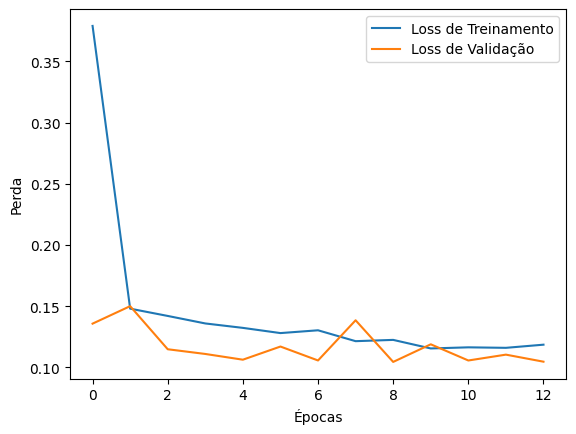

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1095
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


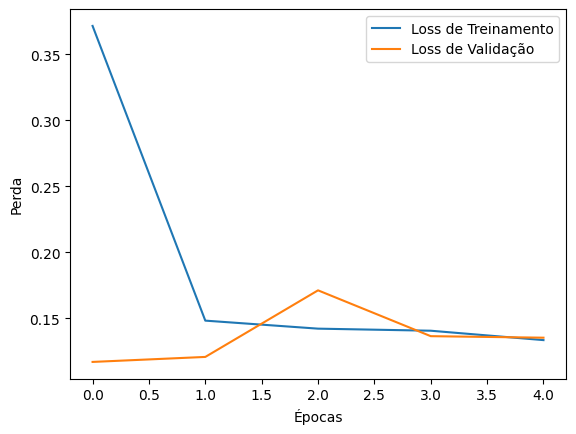

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0954
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


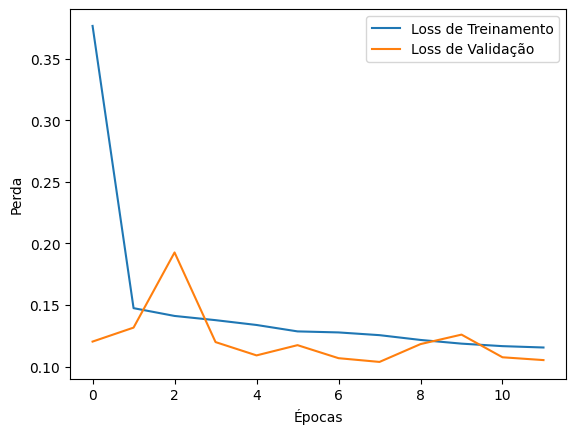

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1130
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


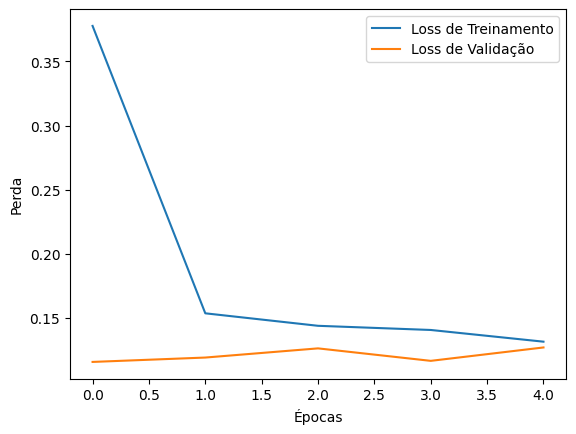

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1226
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


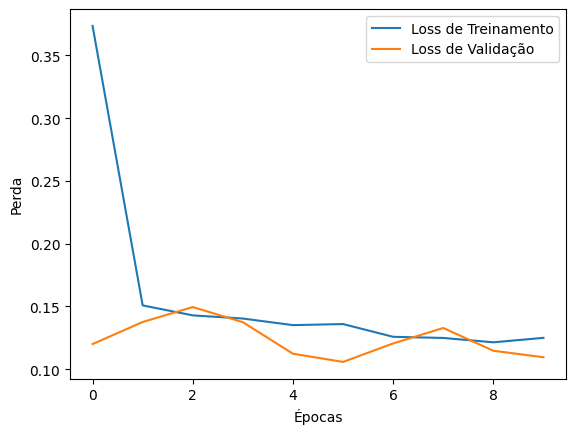

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1078
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


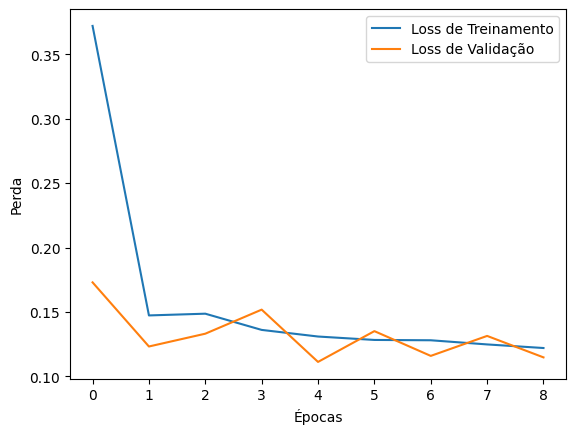

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1154
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


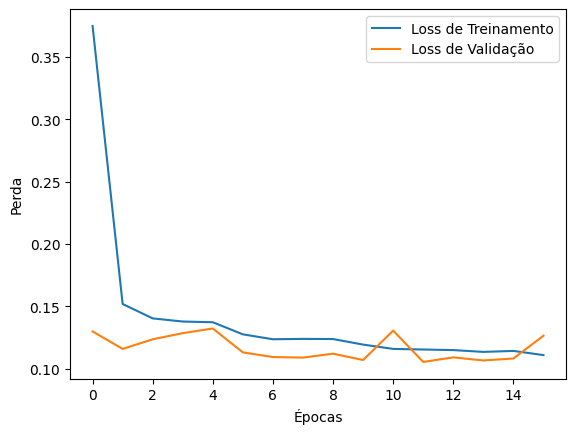

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1149
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


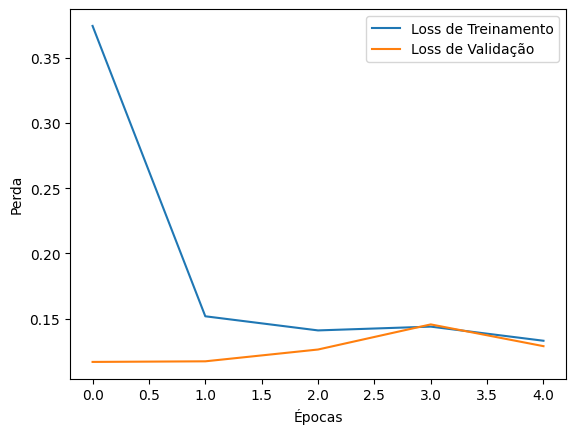

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1312
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


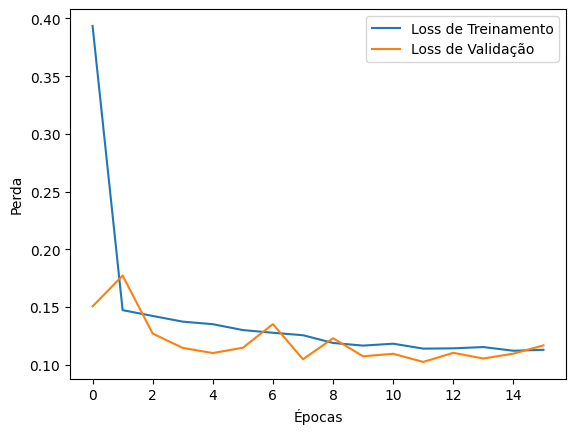

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0934
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


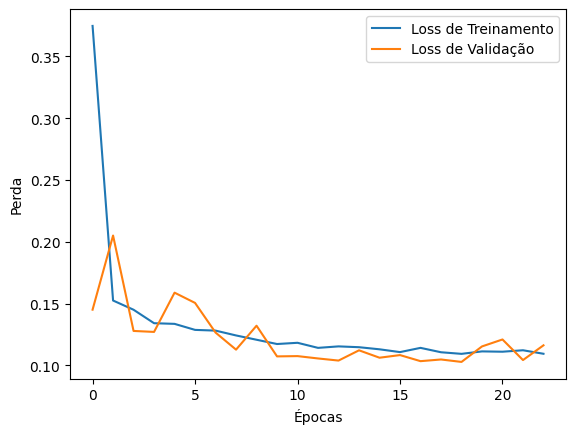

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0917
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


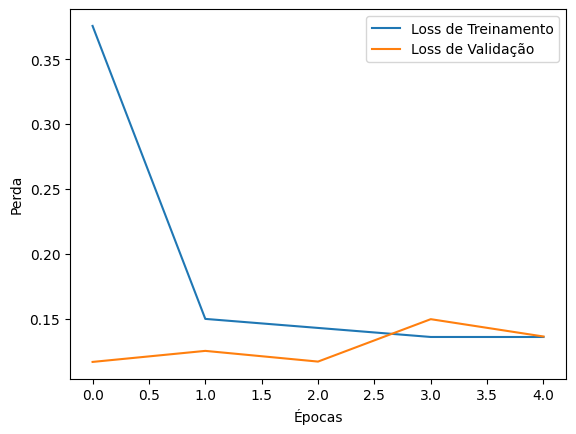

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1160
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


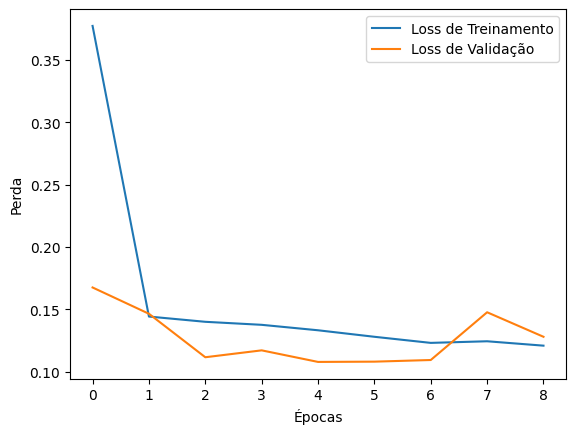

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1094
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


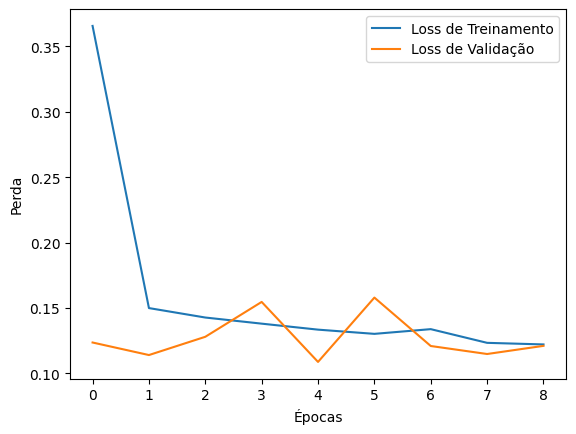

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1057
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


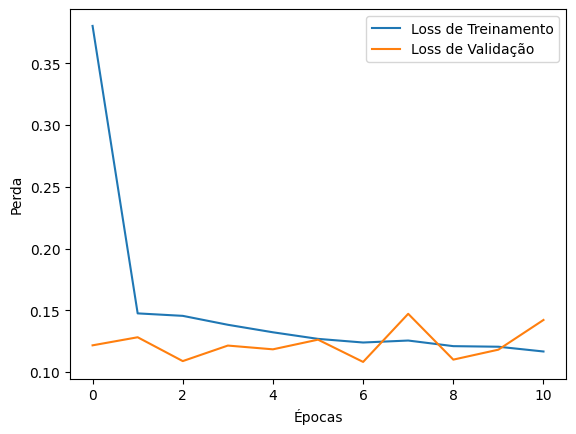

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1157
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


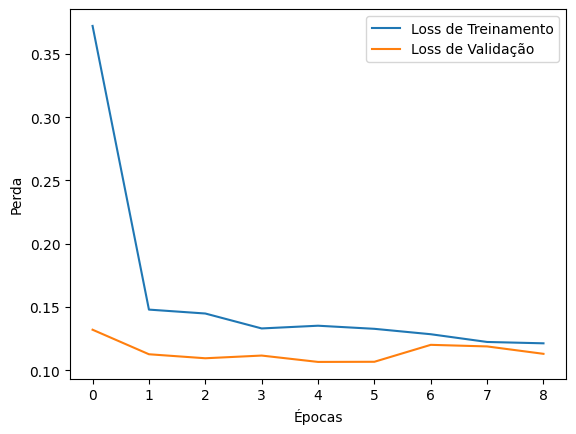

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1072
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


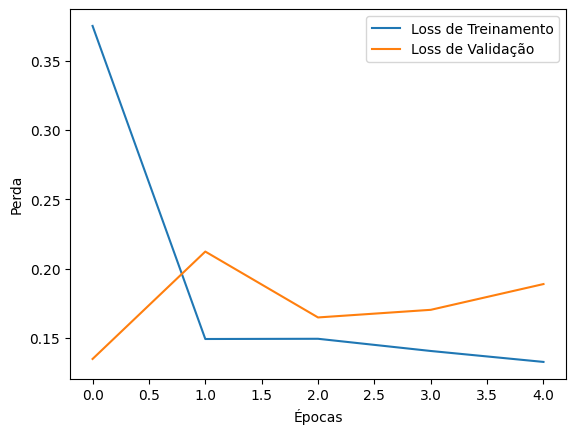

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1646
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


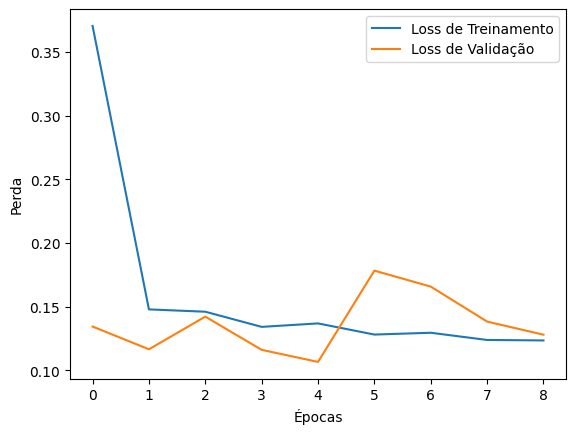

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1016
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


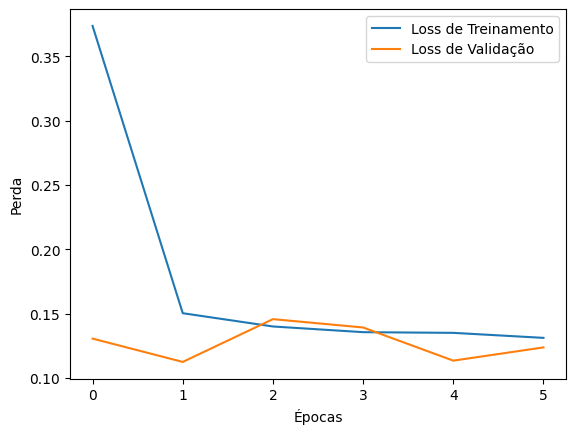

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0868
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


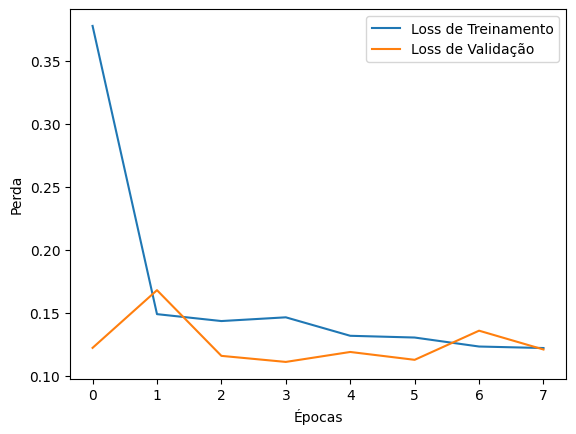

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0880
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


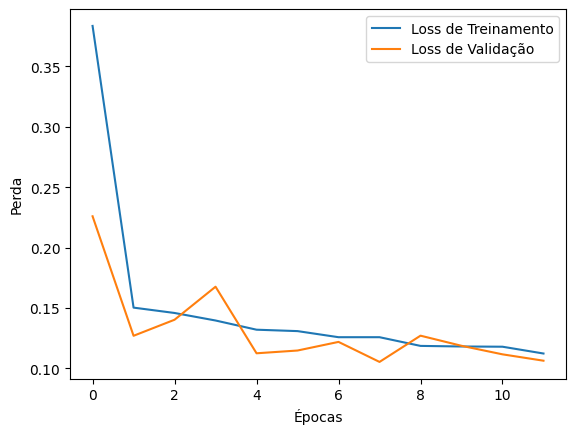

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0980
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


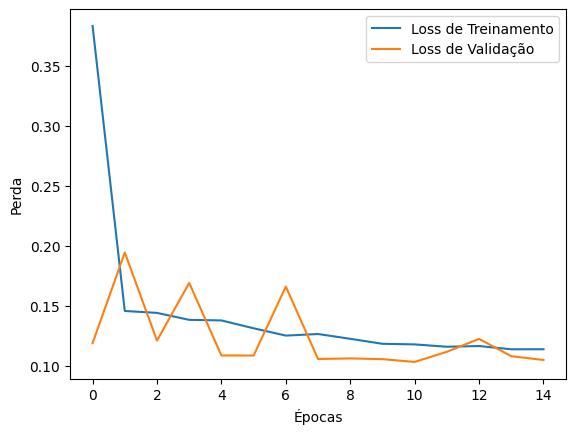

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0935
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


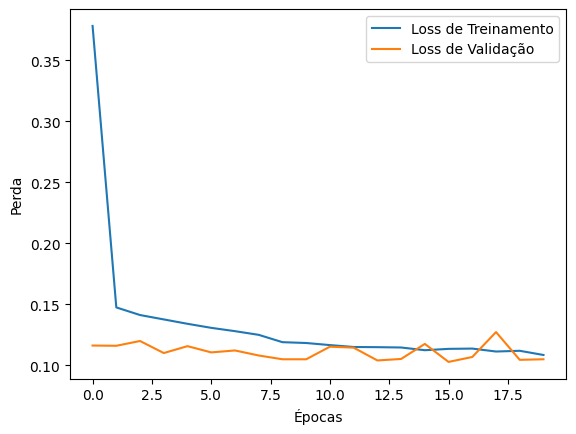

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0851
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


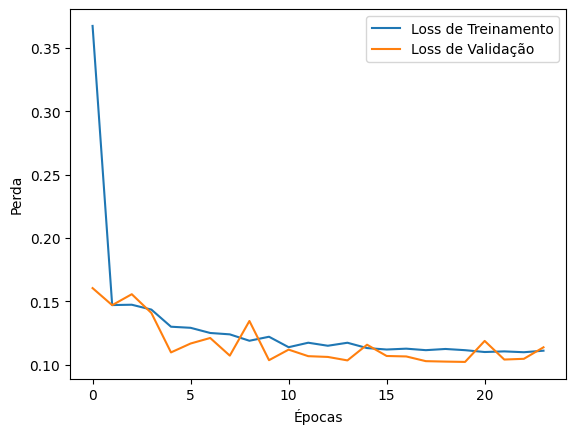

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1074
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


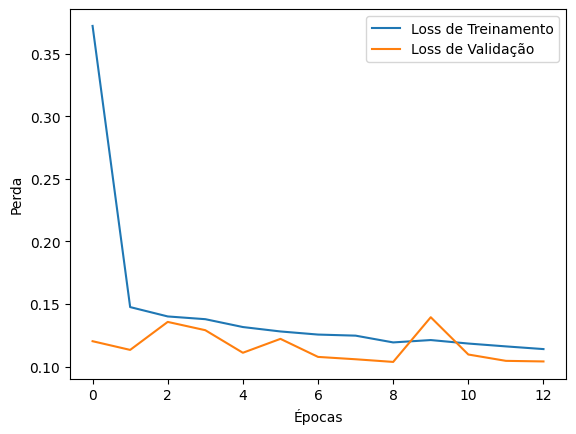

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0987
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


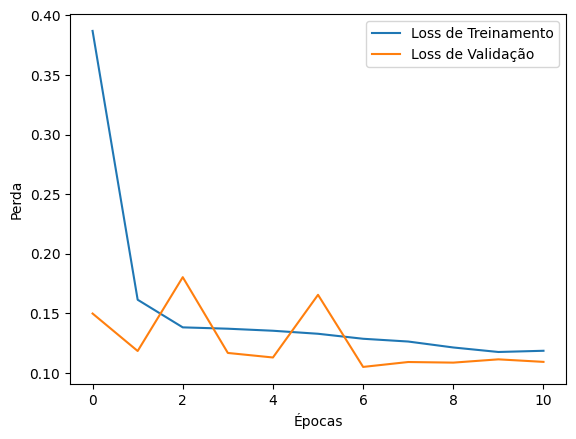

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0932
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


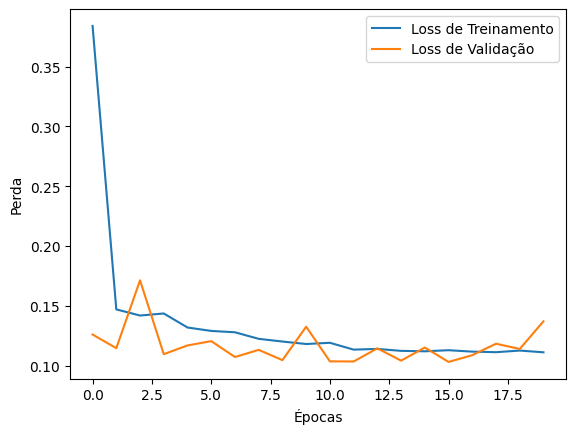

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1044
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


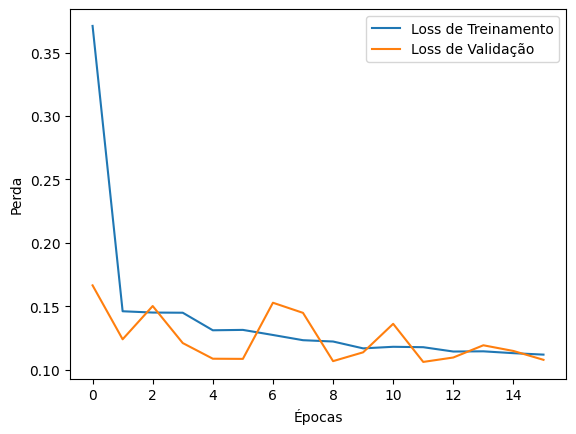

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0805
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


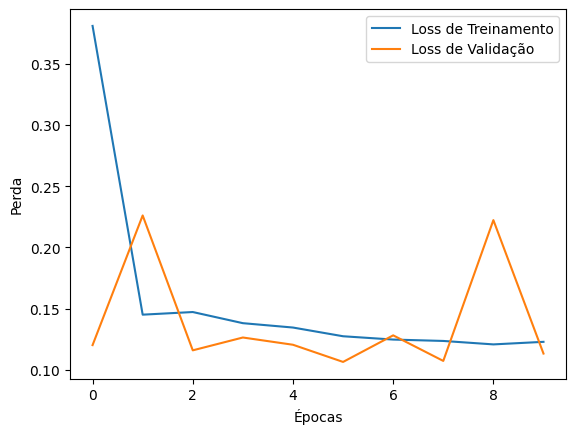

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1020
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


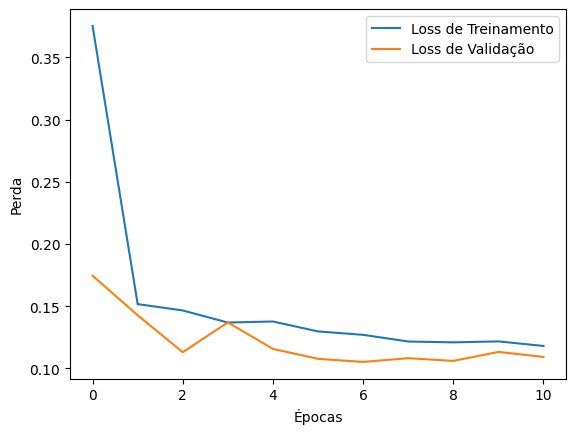

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


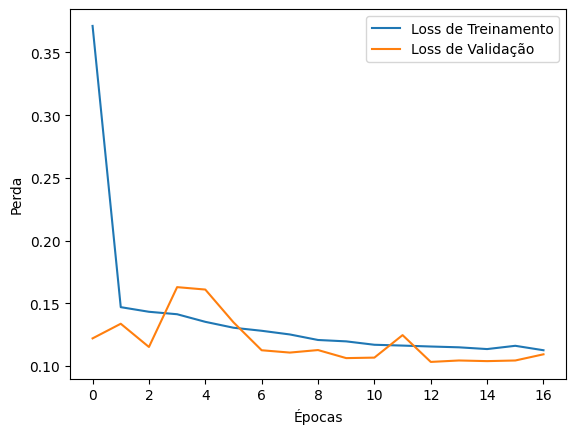

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1069
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


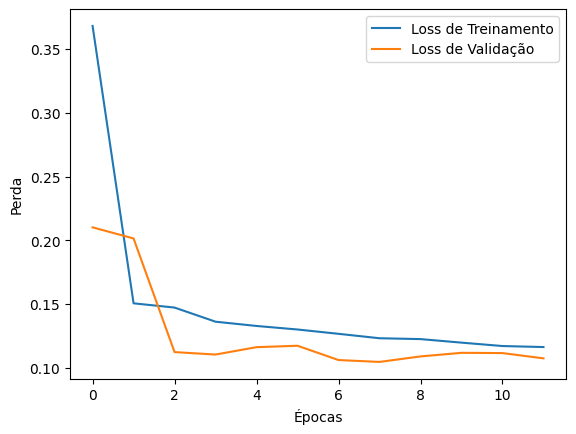

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1029
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


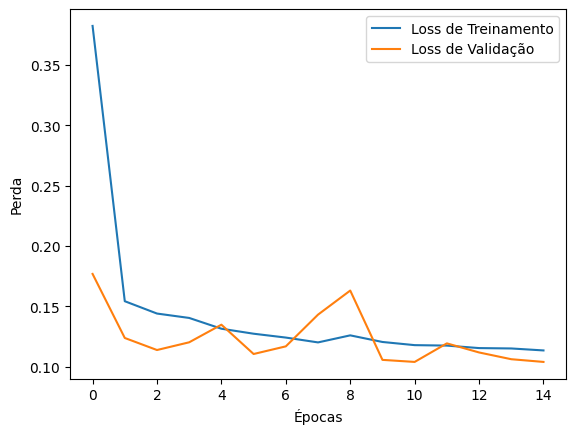

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0914
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


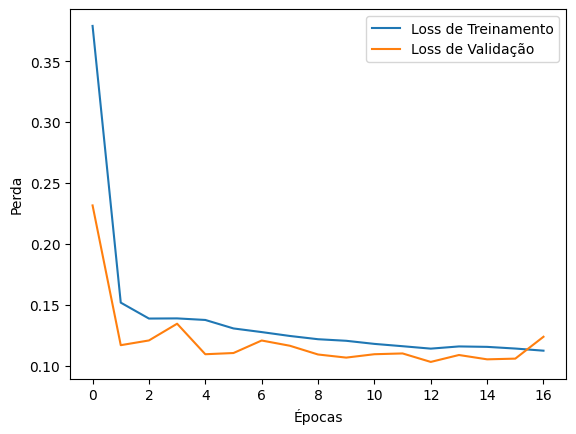

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0832
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


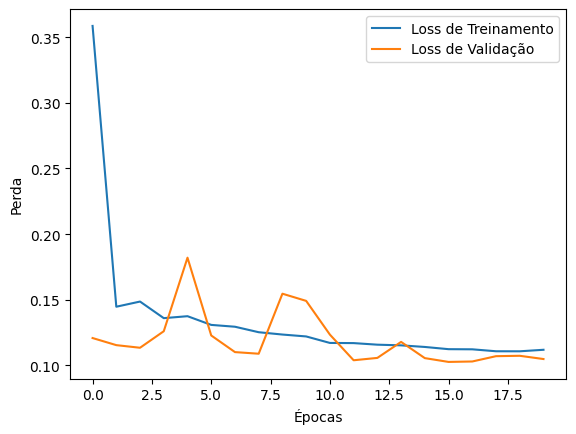

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0908
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


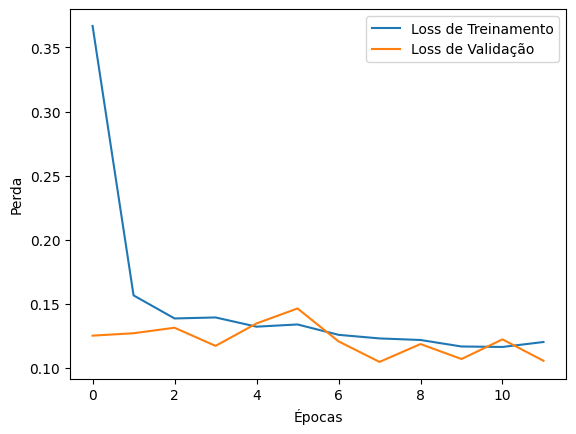

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1189
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


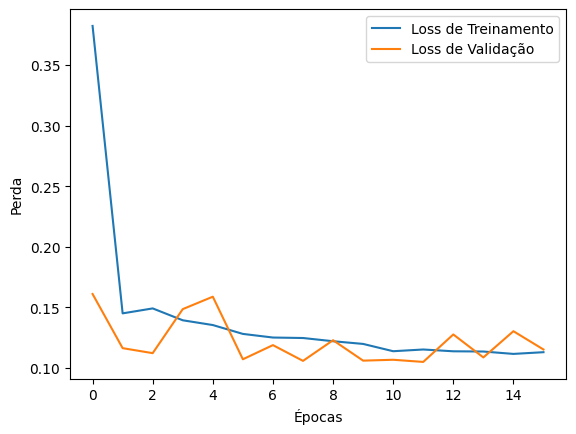

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1125
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


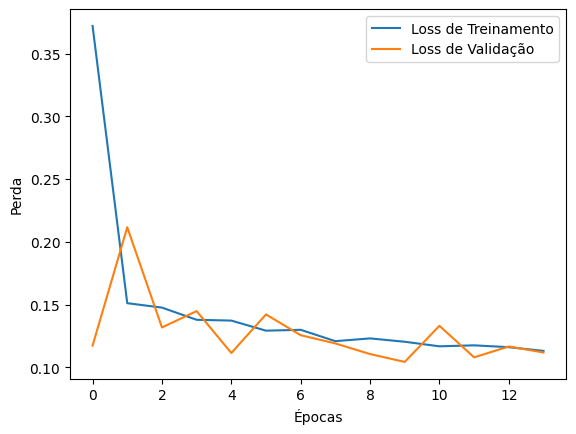

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


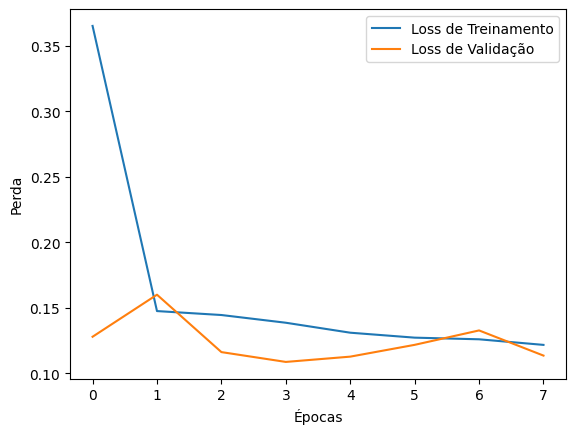

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1144
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


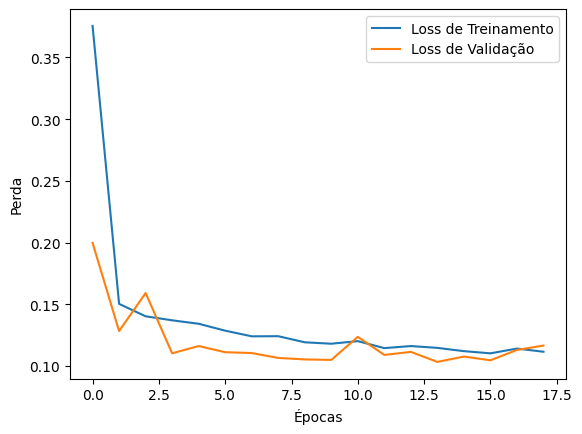

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0973
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


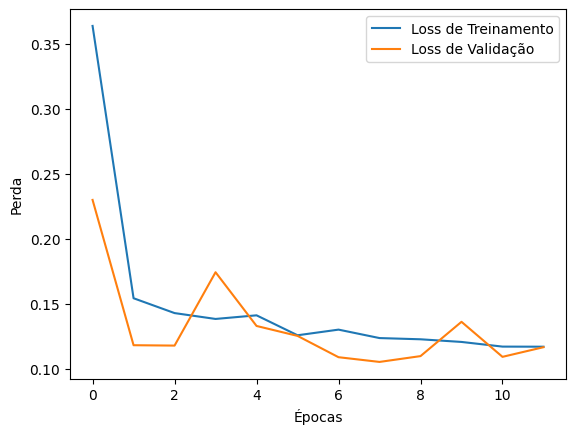

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0956
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


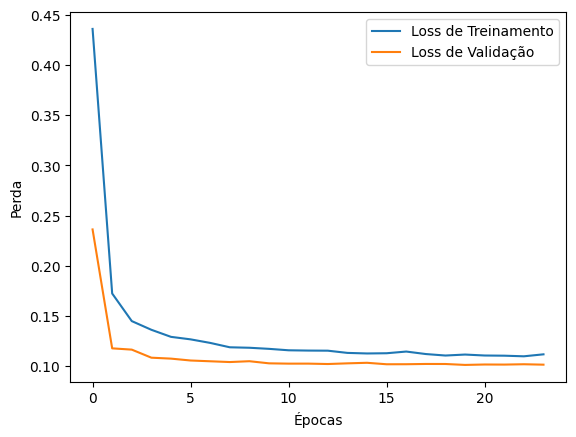

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0964
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


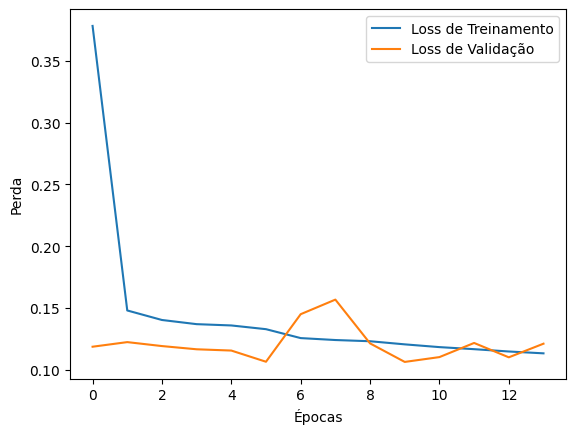

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1285
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


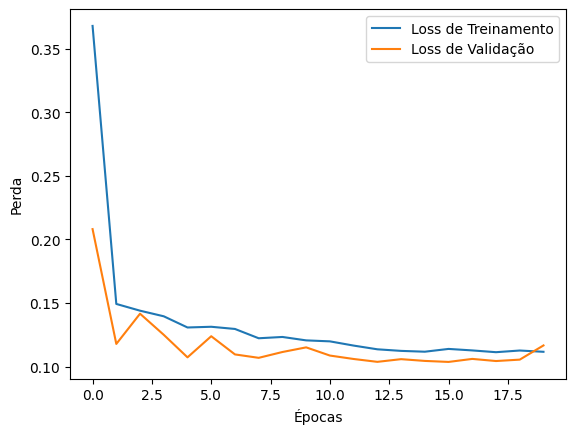

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1162
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


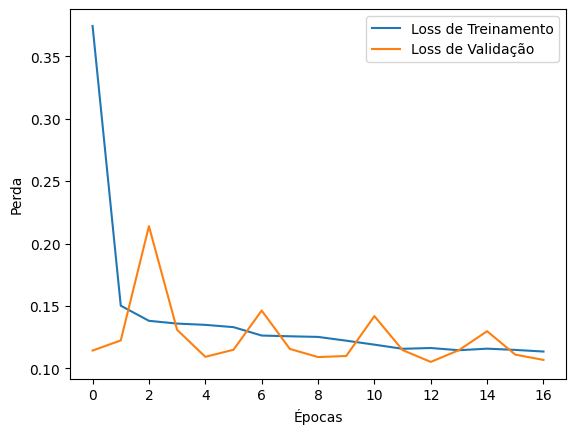

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1181
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


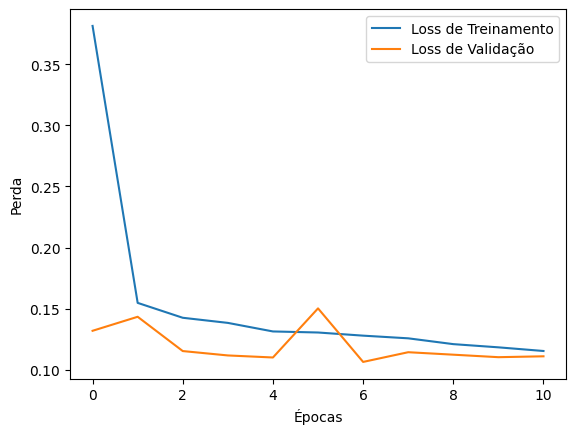

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1105
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


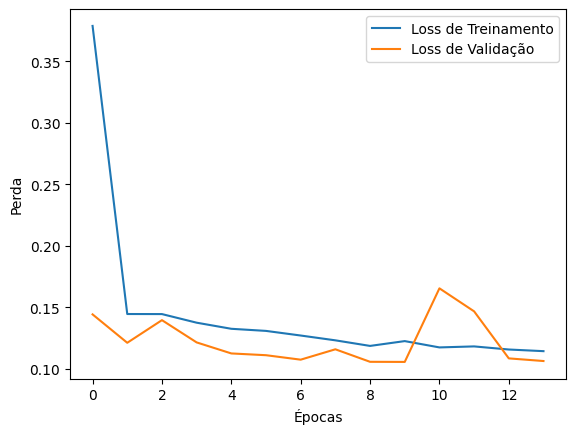

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1091
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


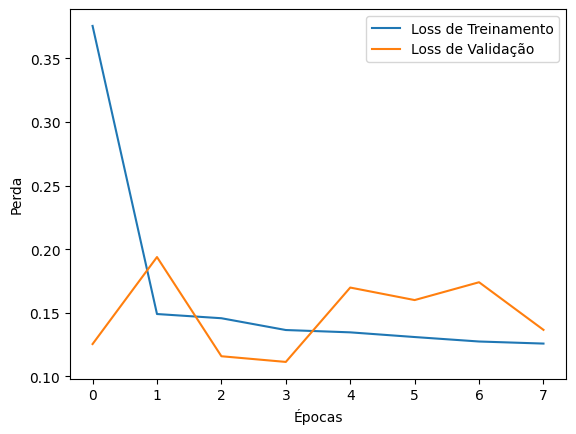

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1213
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


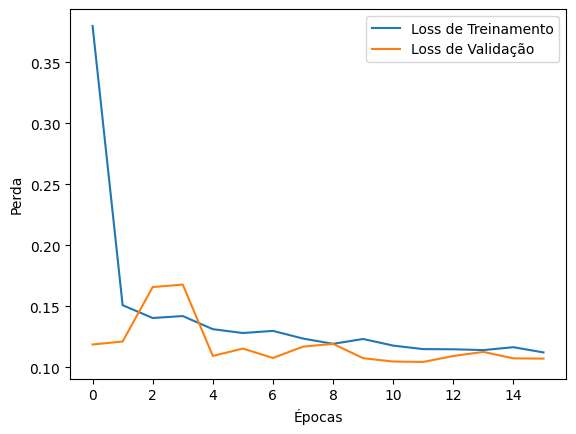

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1112
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


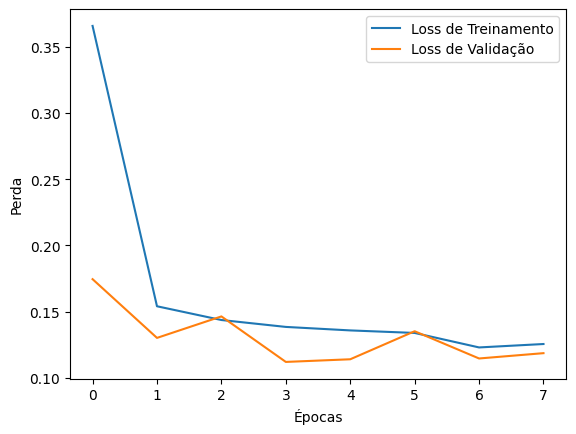

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0794
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


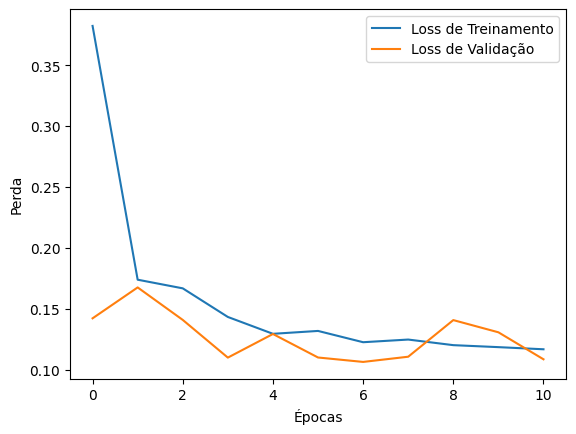

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0992
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


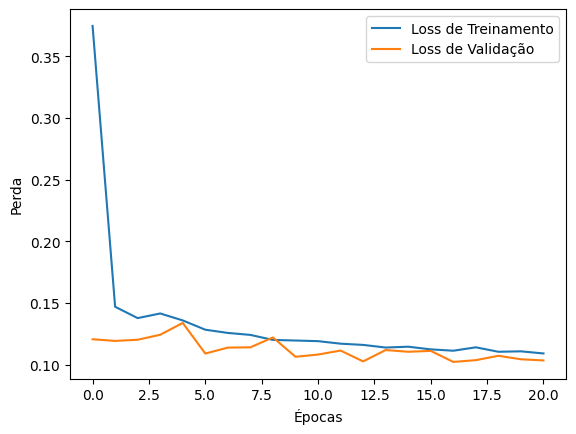

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0952
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


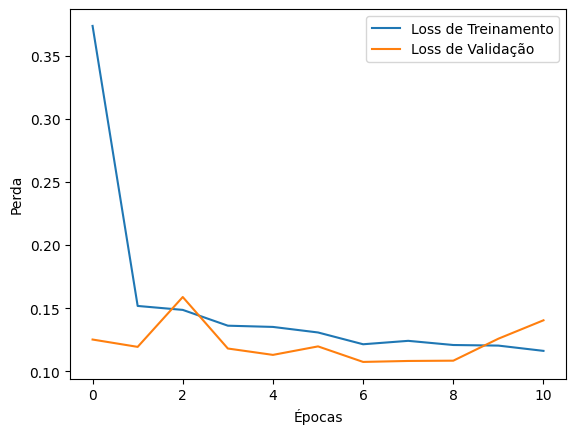

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0816
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


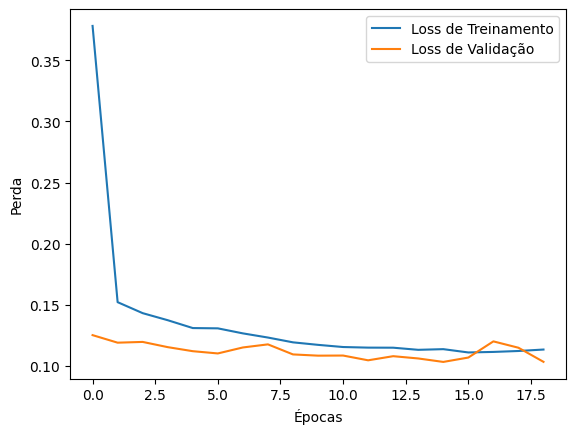

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


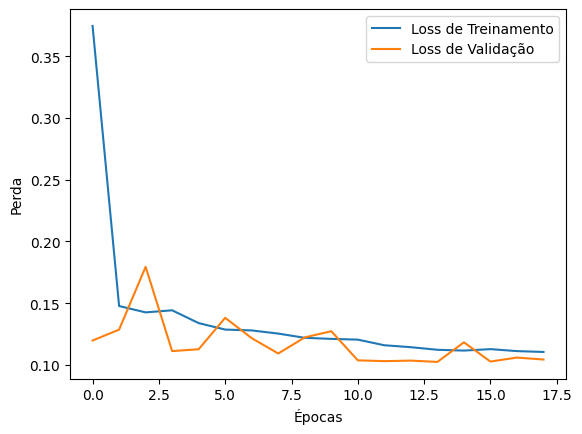

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0917
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


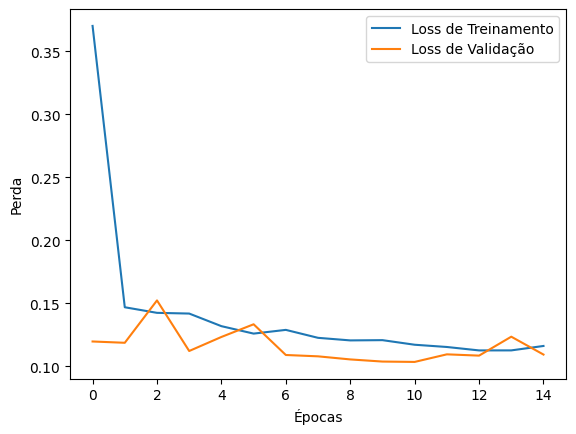

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1015
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer adam


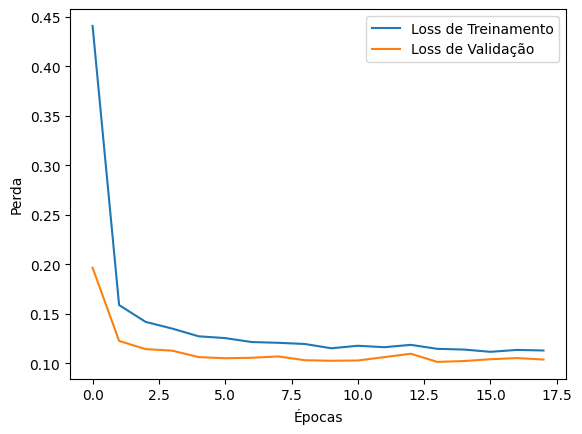

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1028
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


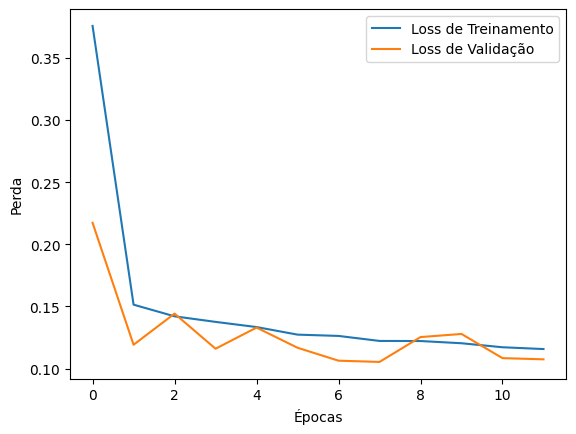

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1091
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


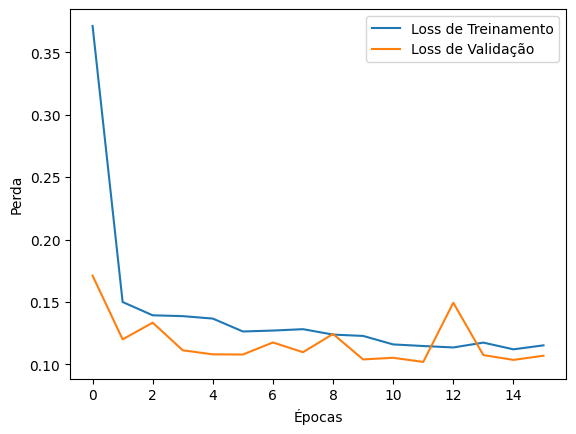

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0894
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


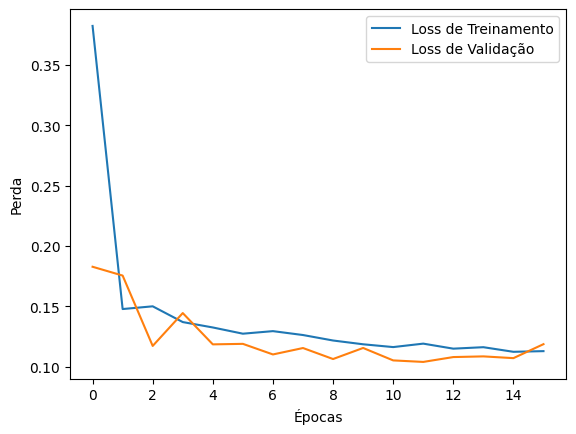

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1071
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


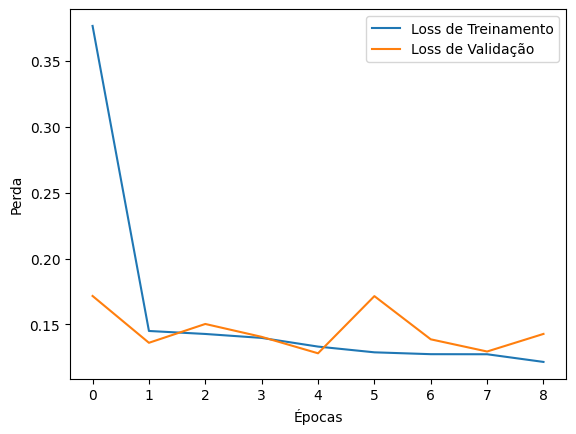

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1629
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


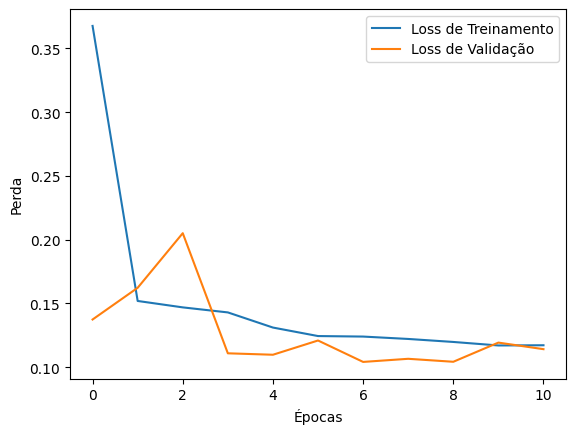

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0984
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


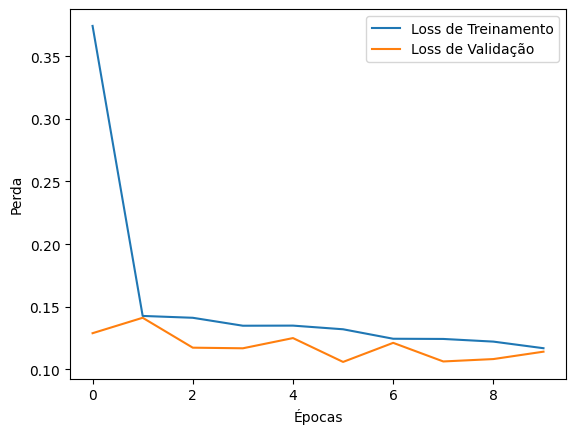

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0890
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


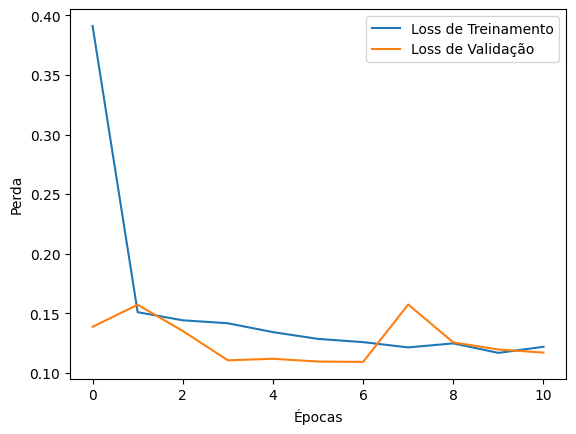

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1170
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


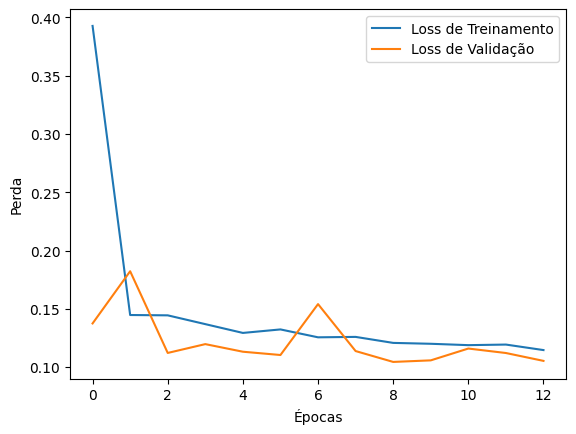

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0892
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


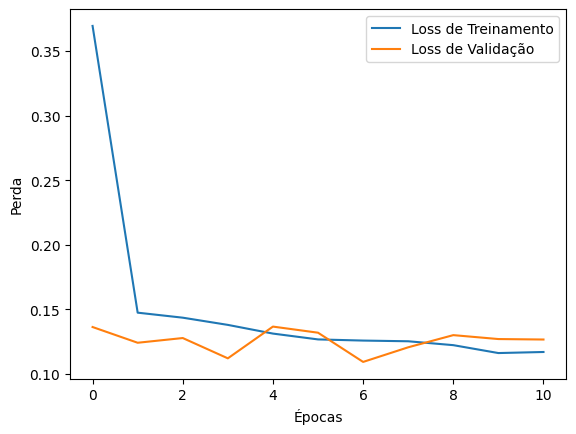

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0915
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


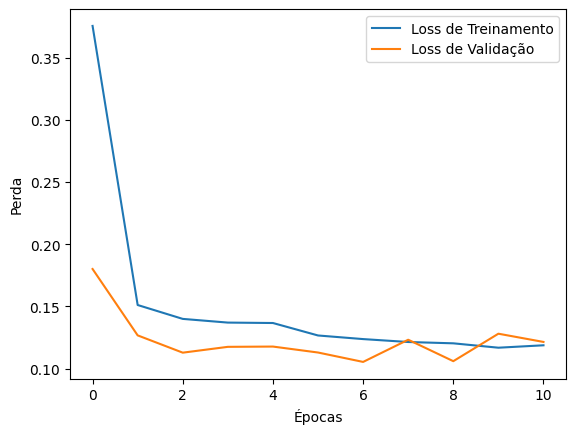

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1129
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


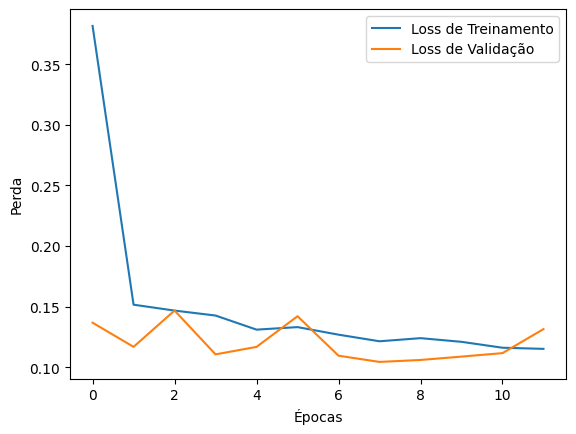

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0978
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


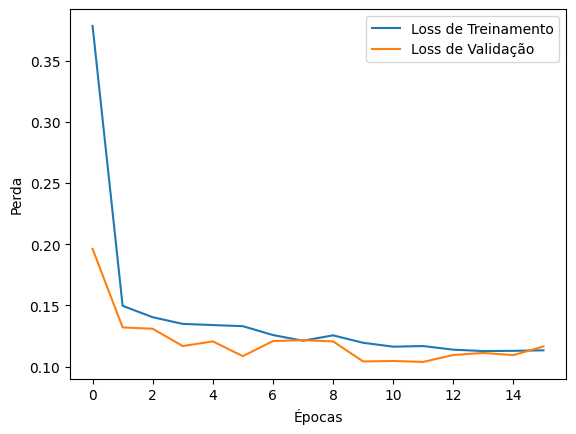

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1096
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


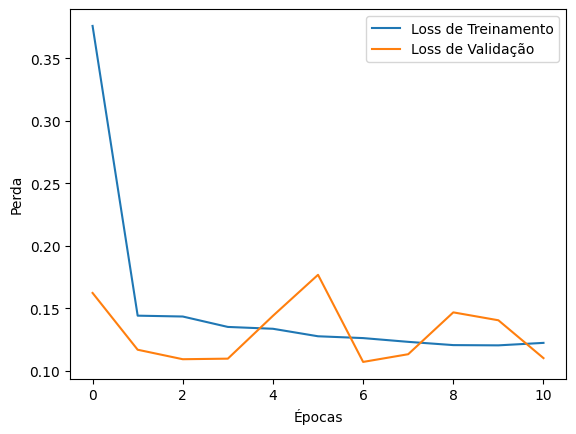

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0814
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


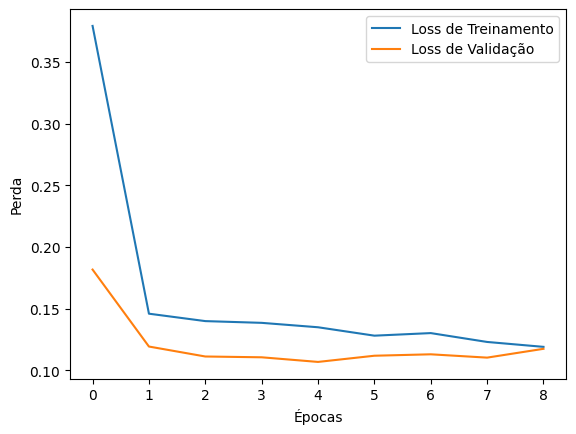

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1154
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


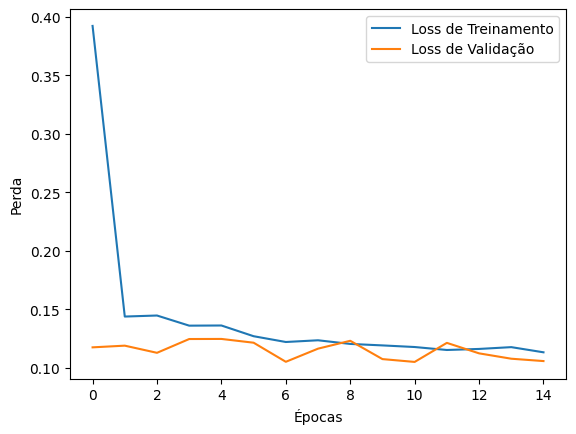

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0784
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


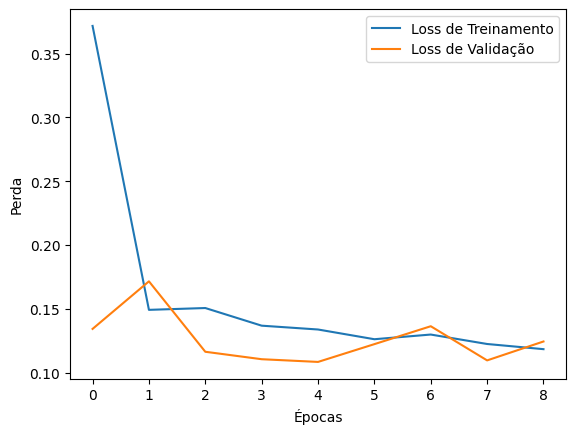

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1052
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


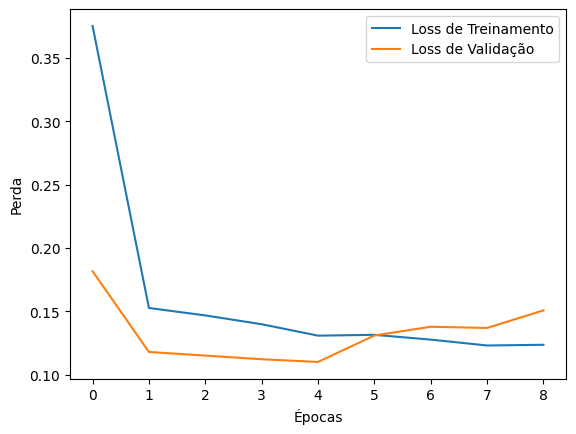

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0952
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


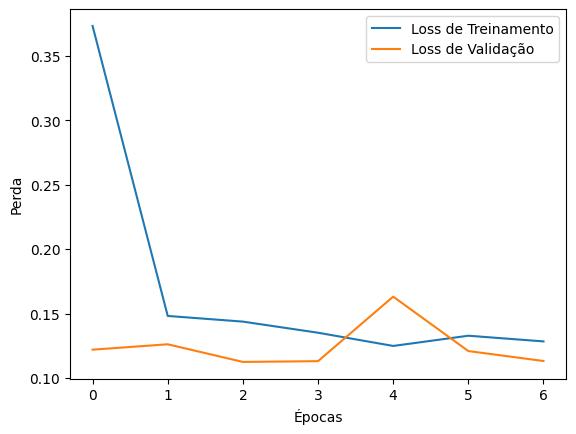

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1257
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


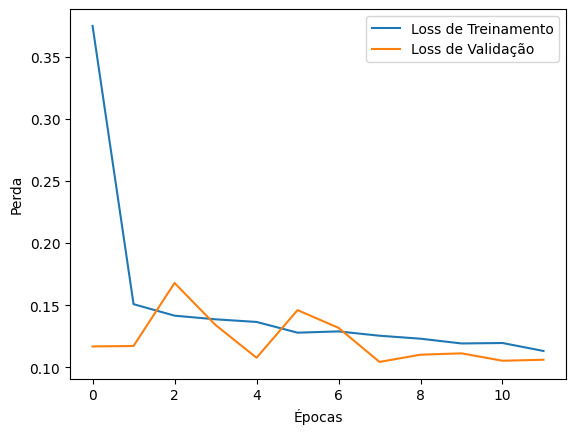

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0976
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


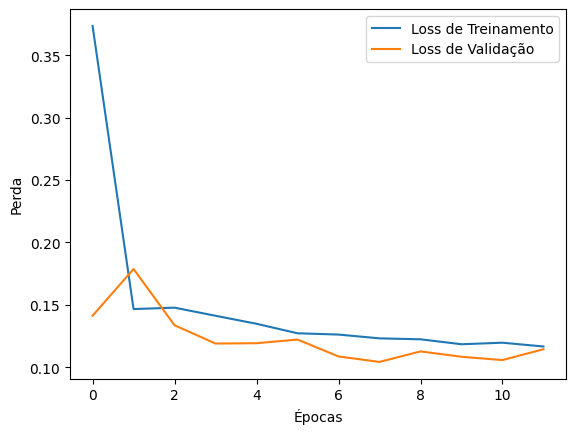

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1015
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


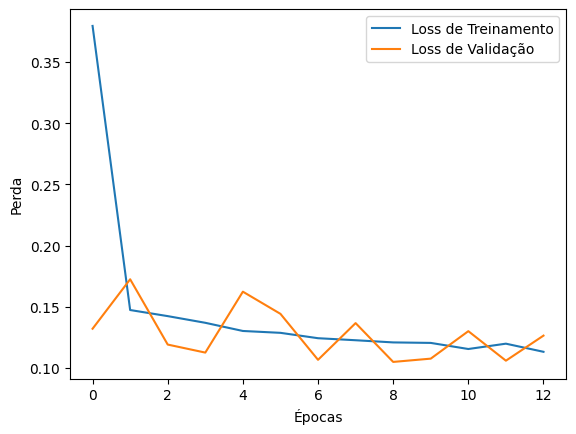

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1172
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


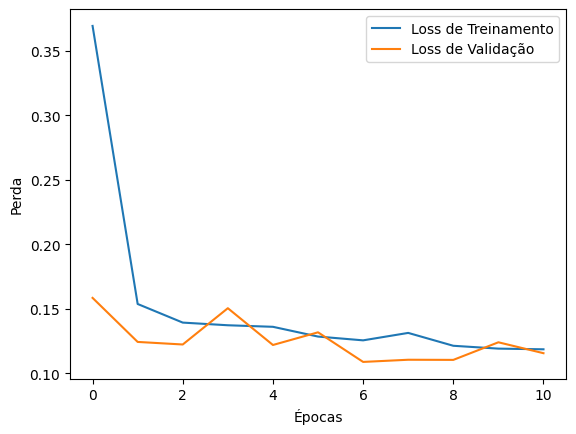

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1195
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


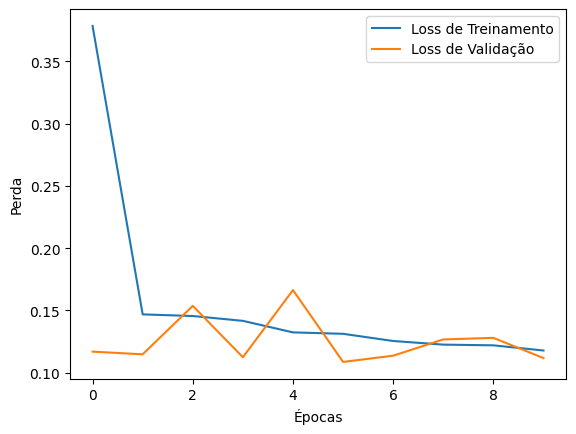

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0870
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


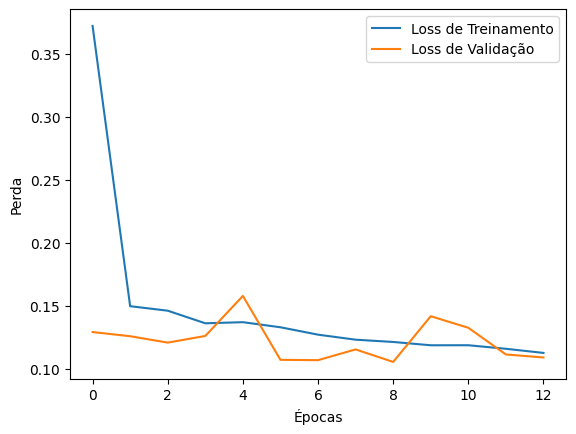

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0796
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


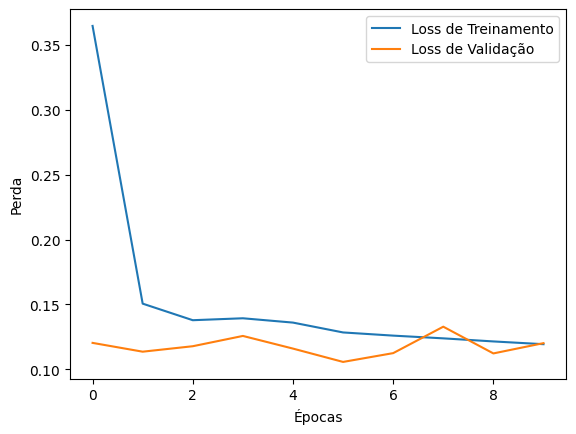

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1051
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


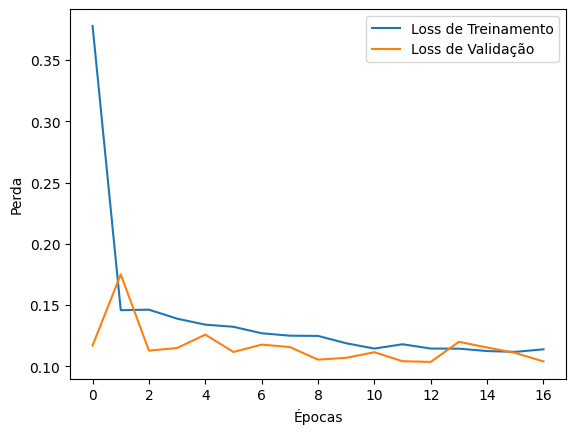

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1122
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


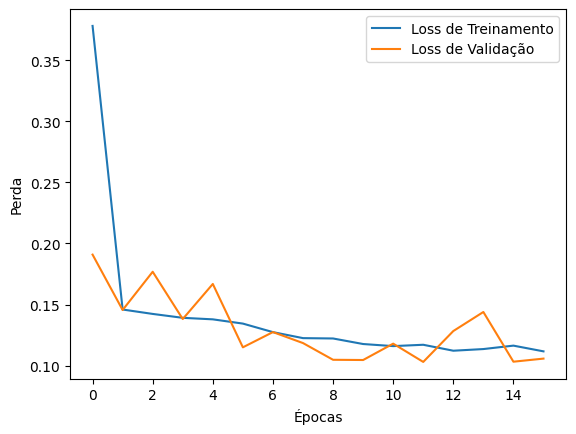

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1004
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


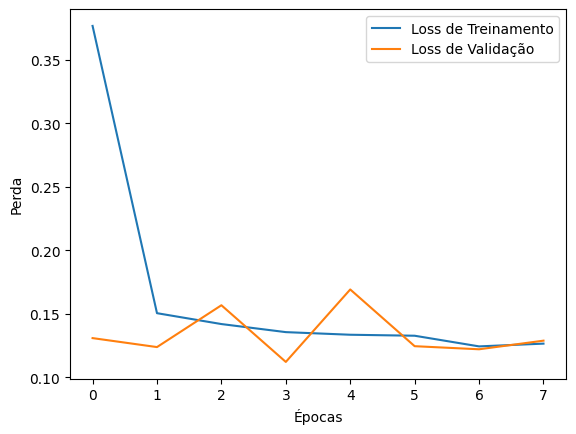

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.1300
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


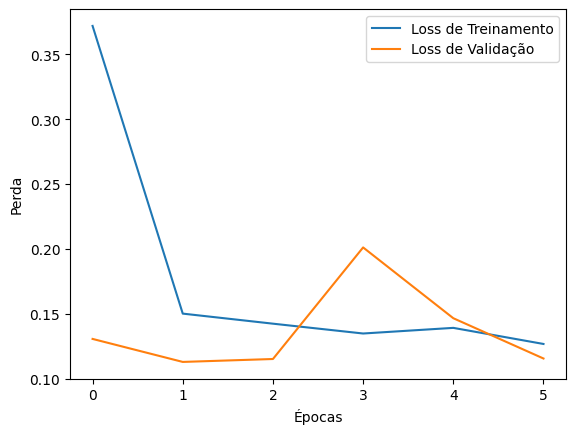

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1090
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


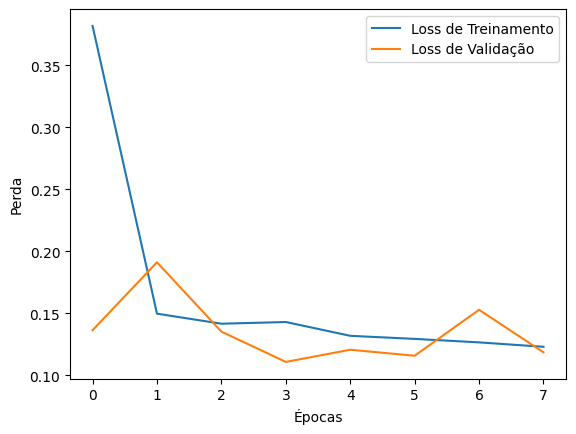

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1167
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


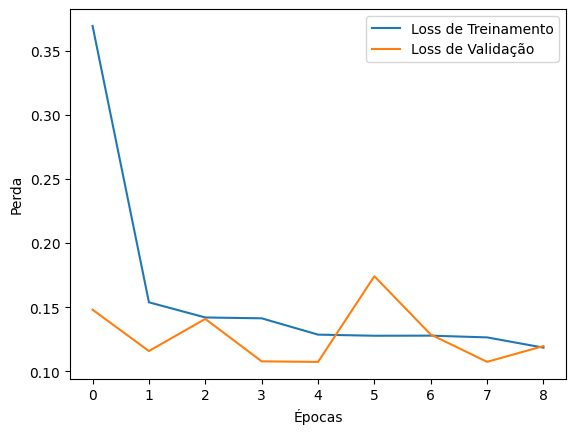

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1124
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


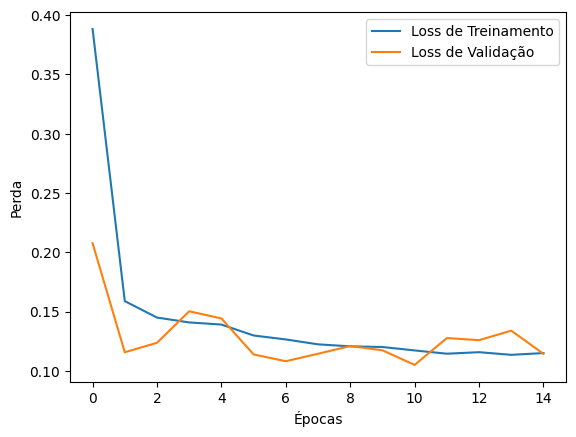

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1077
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


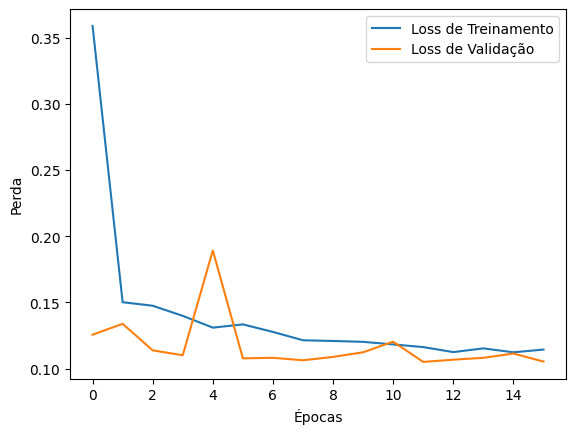

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0822
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


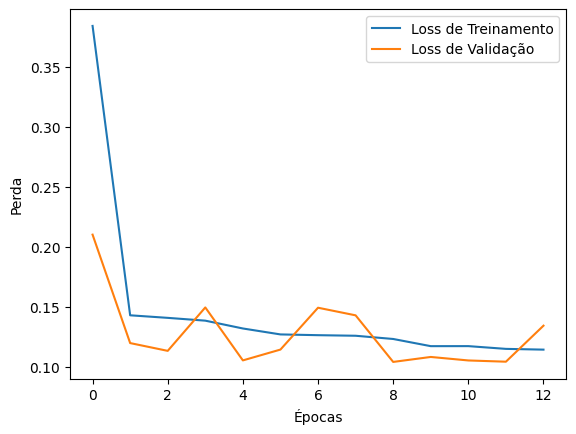

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0913
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


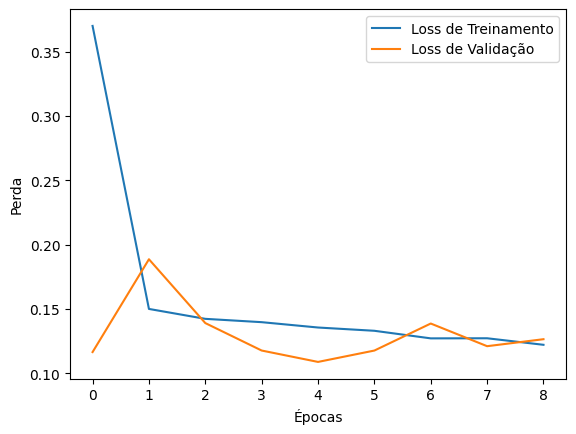

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1147
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


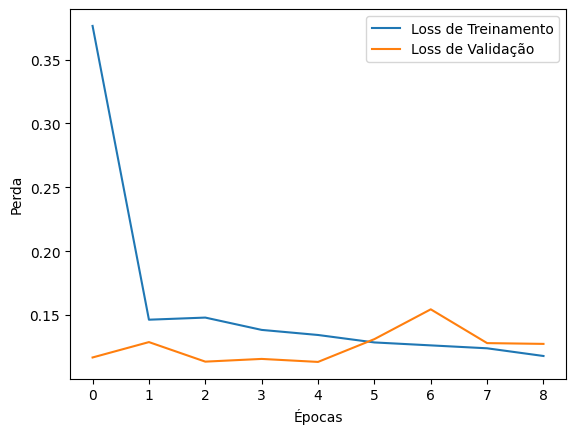

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1248
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


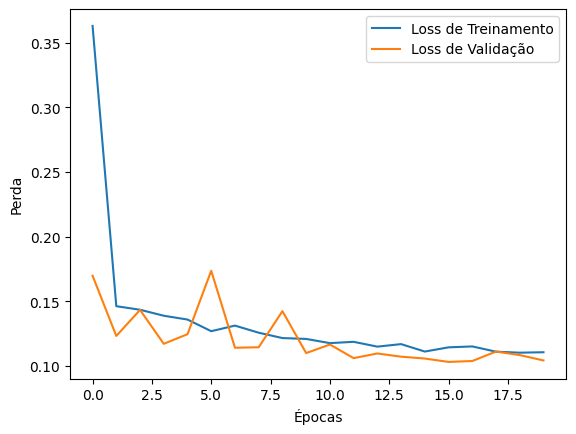

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0925
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


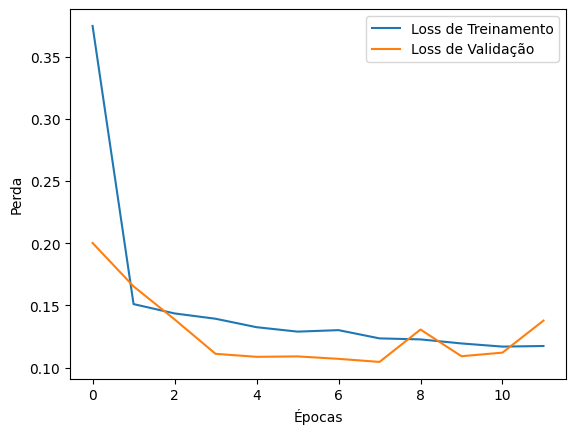

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0955
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


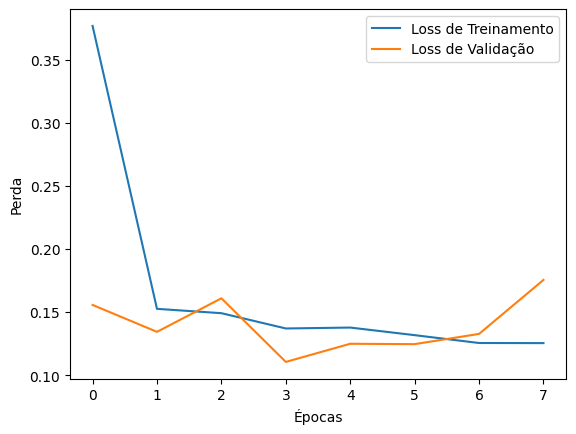

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0912
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


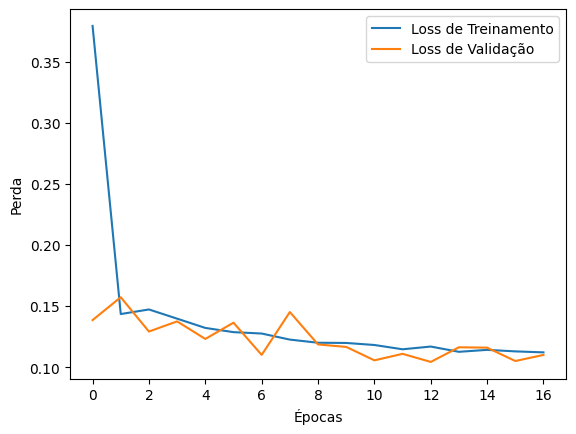

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1078
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


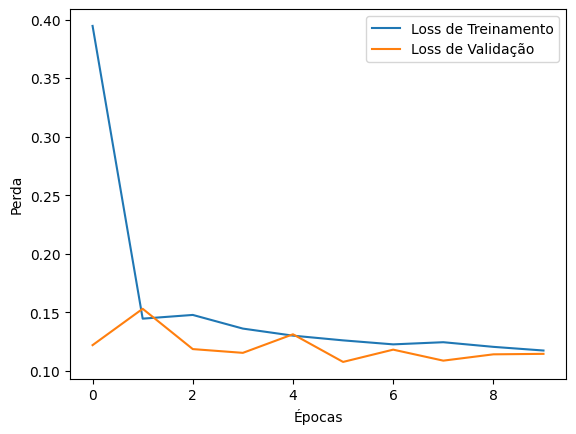

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1208
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


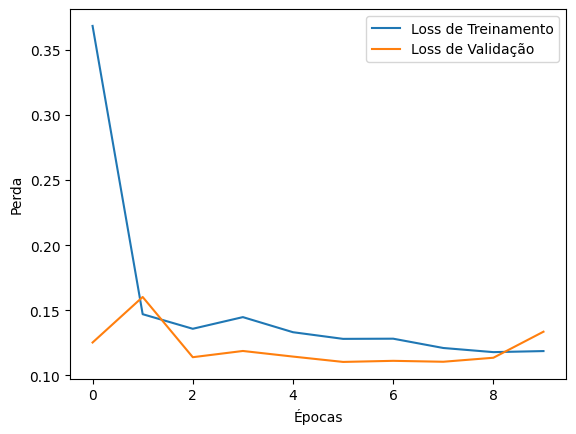

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1366
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


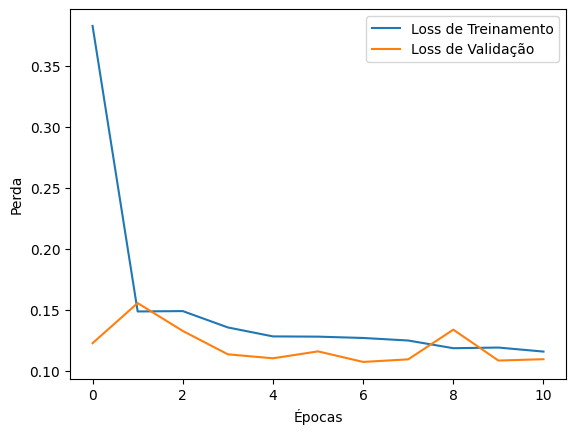

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0921
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


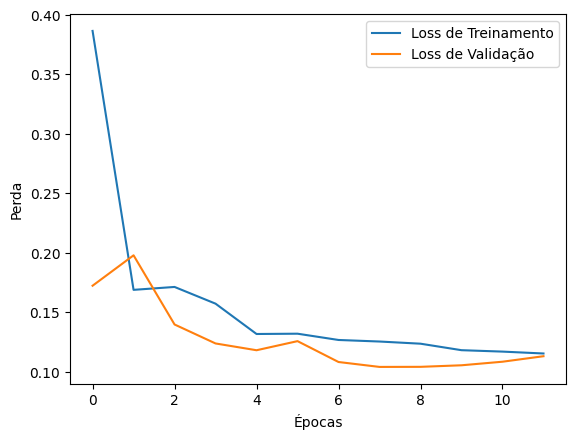

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1069
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


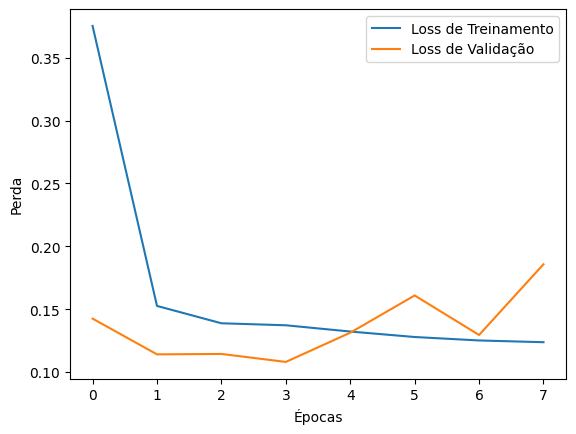

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0971
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


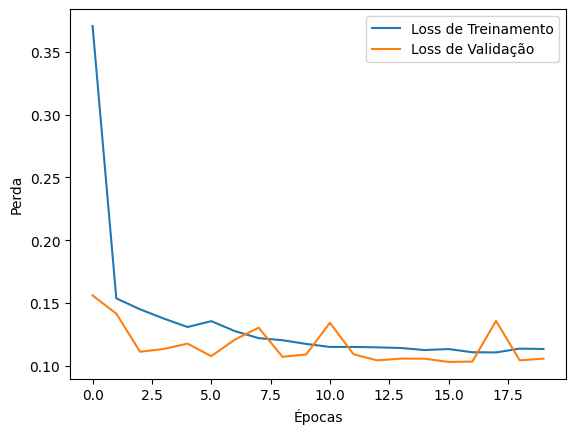

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1033
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


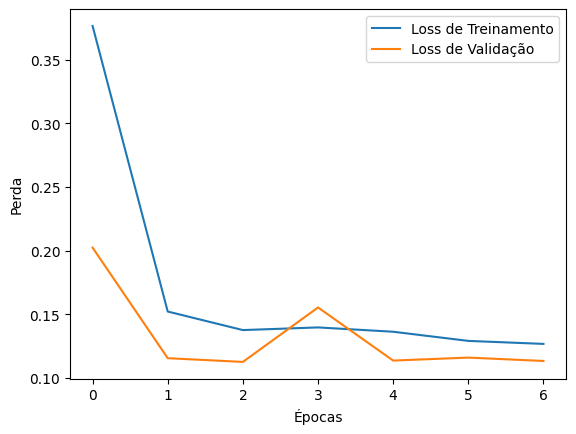

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1247
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


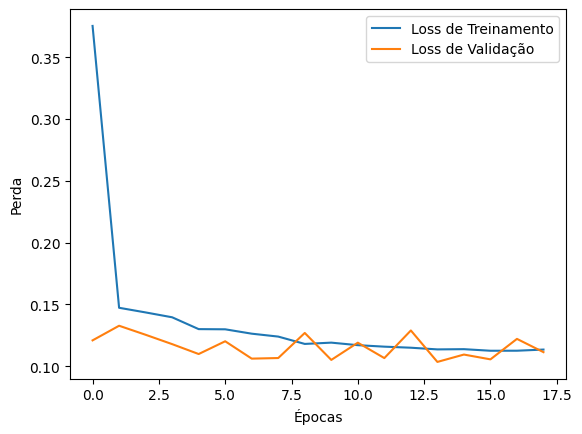

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0858
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


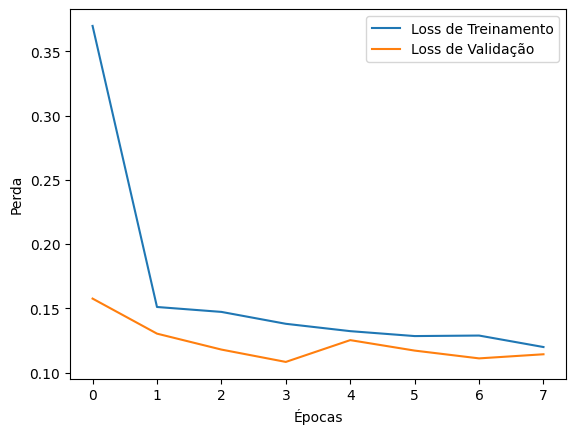

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1016
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


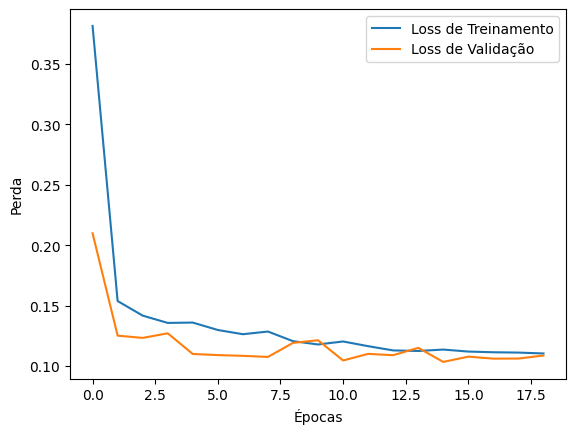

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0956
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


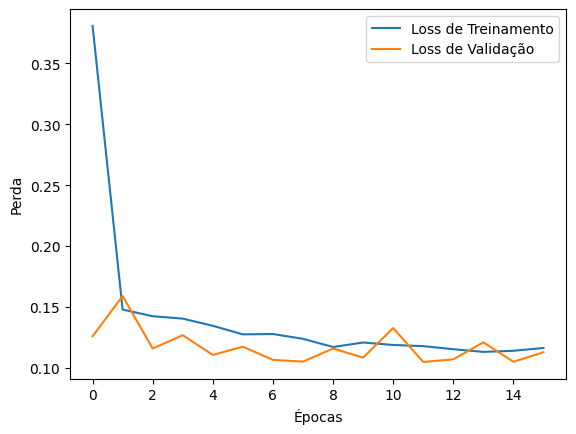

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0881
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


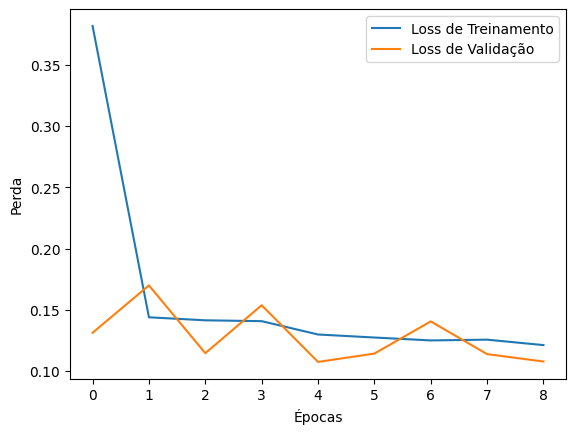

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1055
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


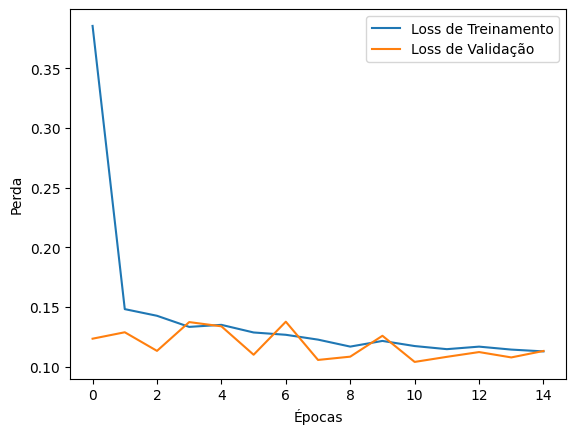

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0983
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


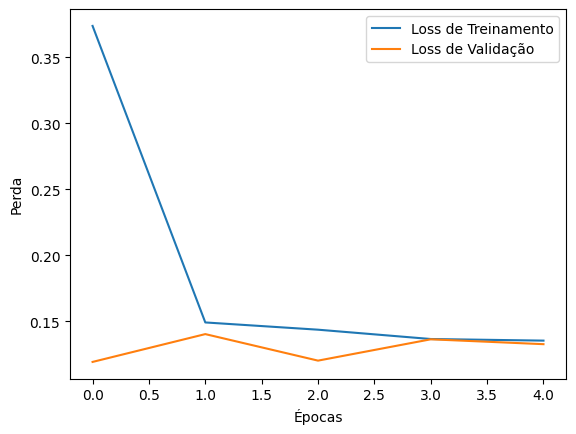

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1284
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


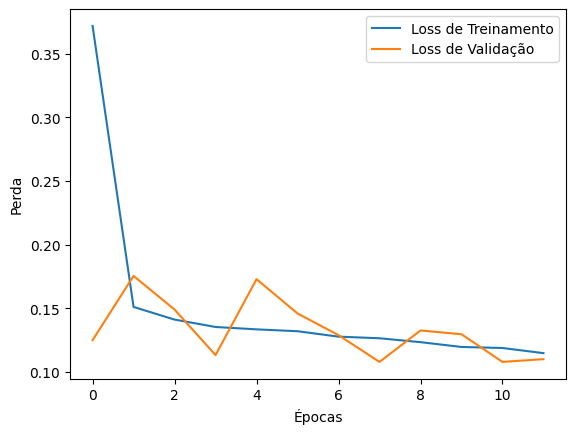

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0866
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


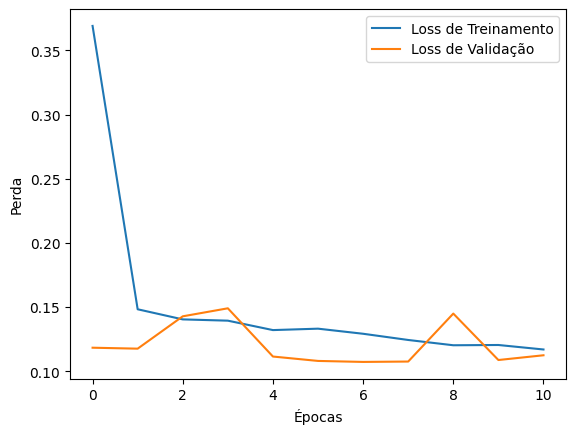

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1178
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


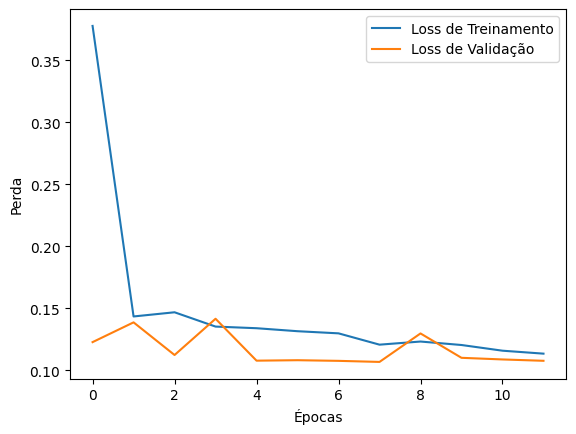

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0860
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


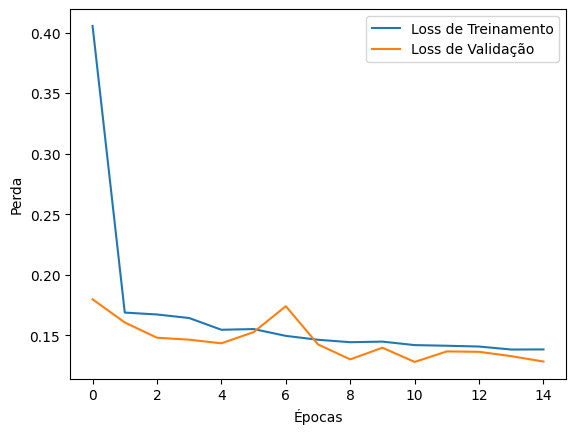

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1273
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


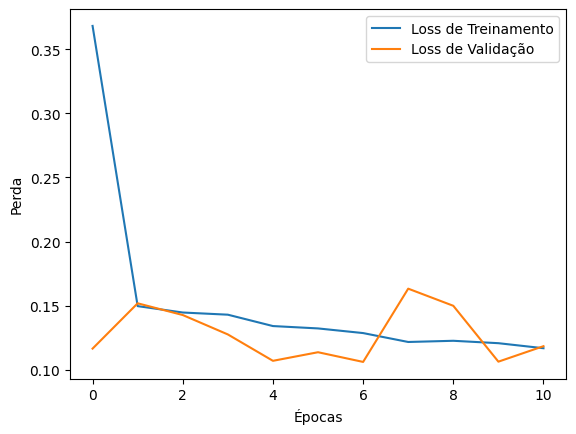

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1132
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


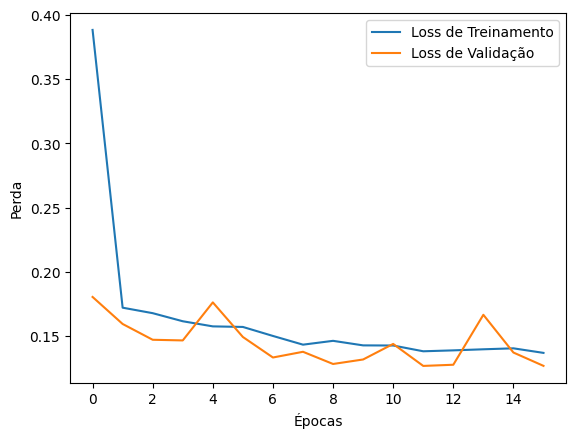

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1225
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


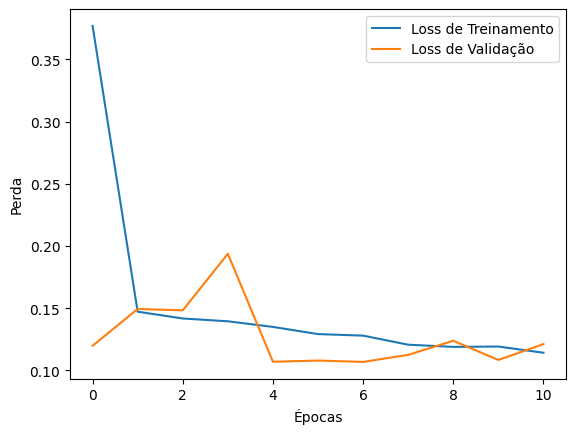

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1064
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


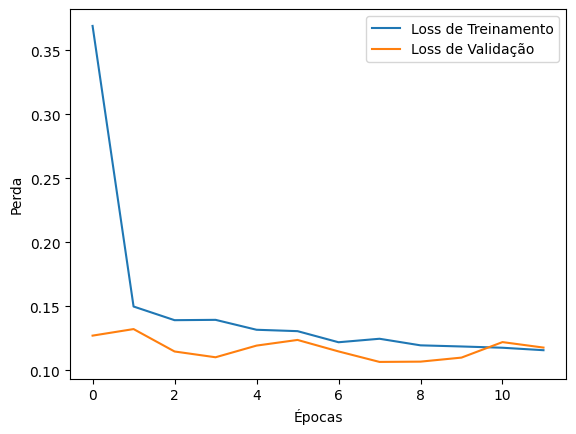

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0857
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


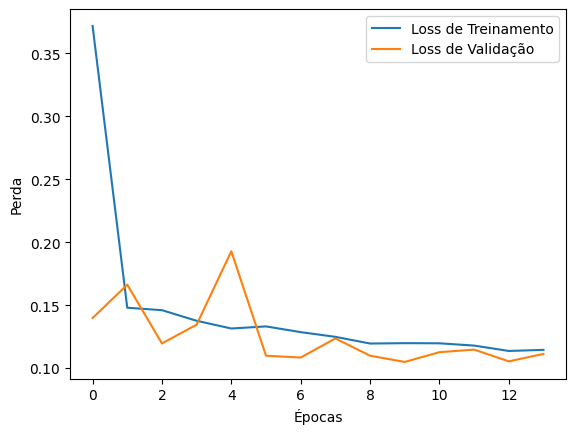

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0994
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


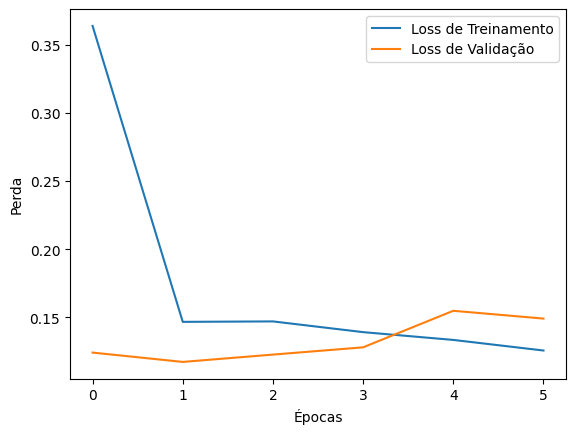

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1136
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


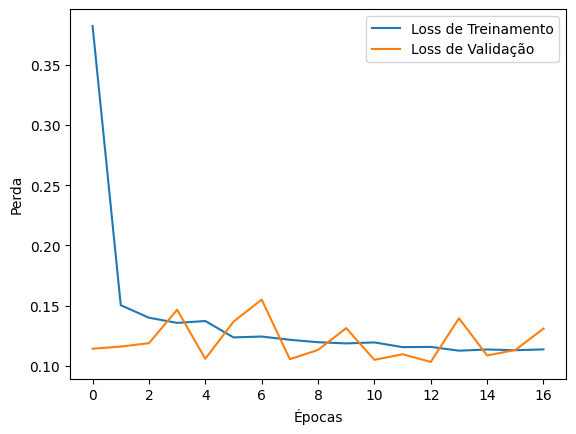

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1054
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


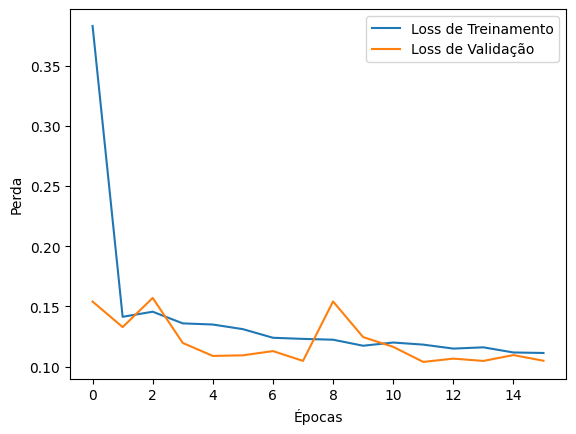

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0854
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


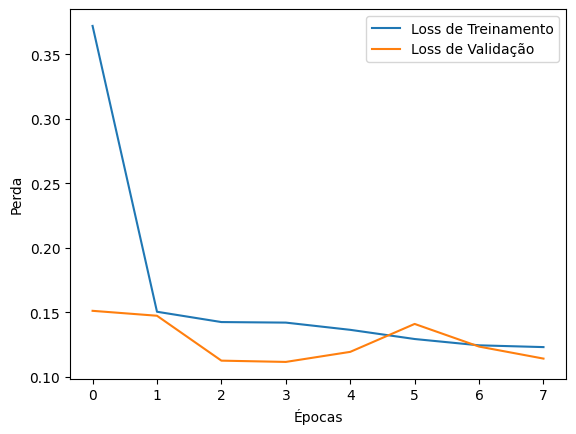

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0841
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


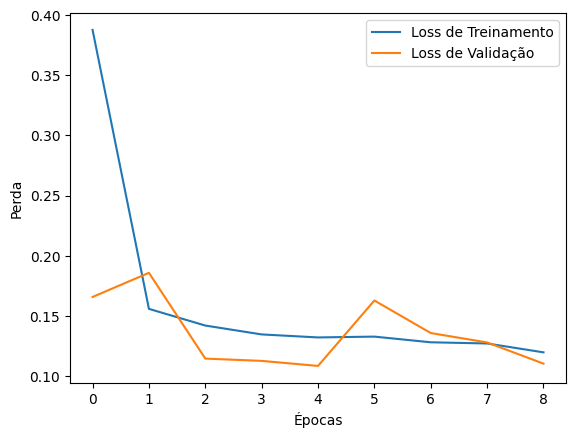

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0954
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


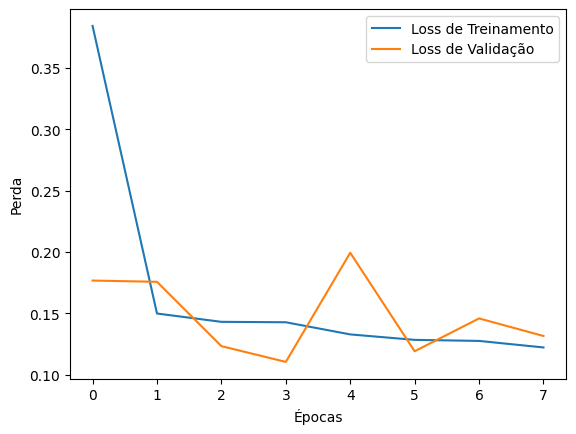

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1067
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


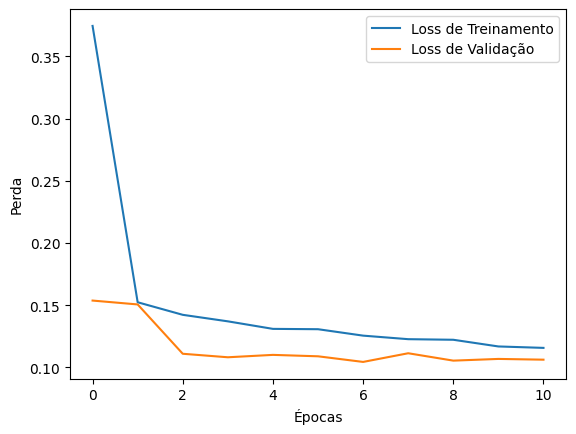

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1059
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


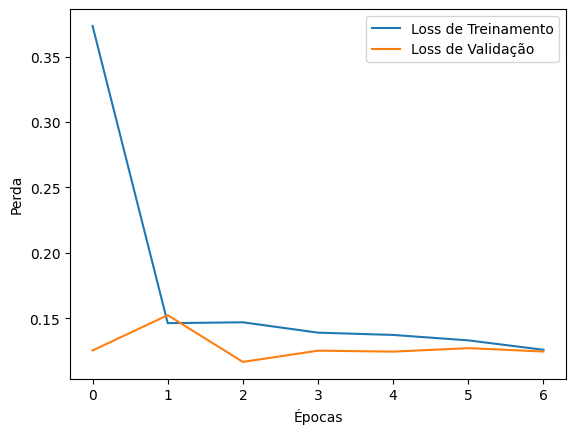

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1269
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


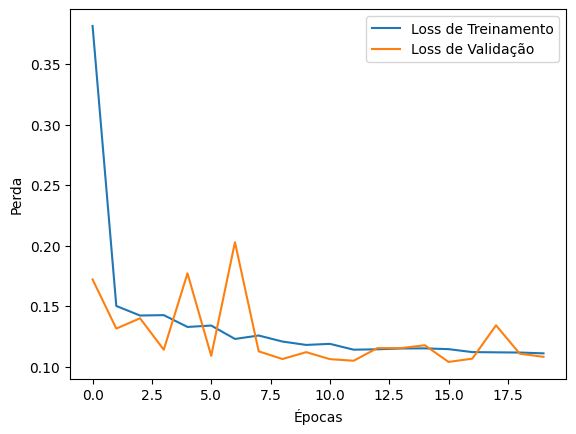

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0917
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


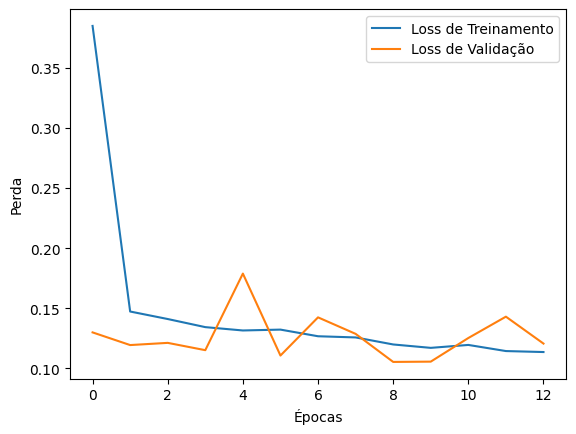

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1079
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


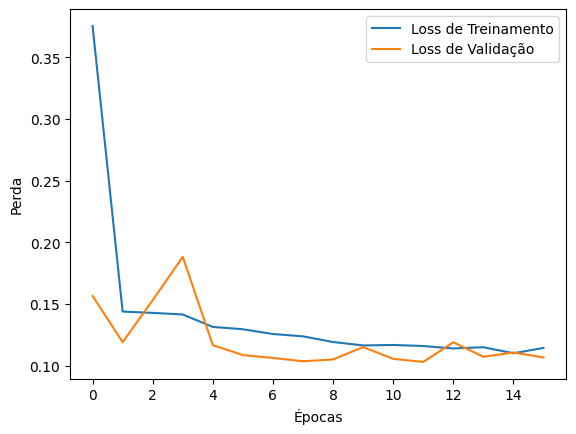

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1044
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


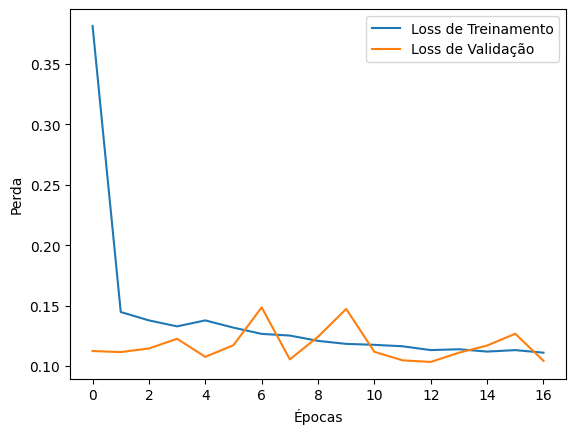

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0895
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


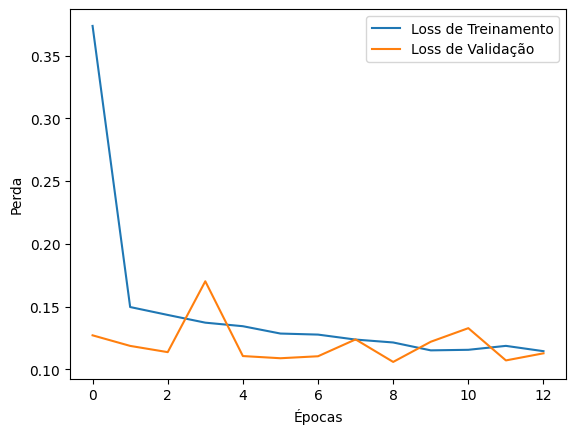

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0990
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


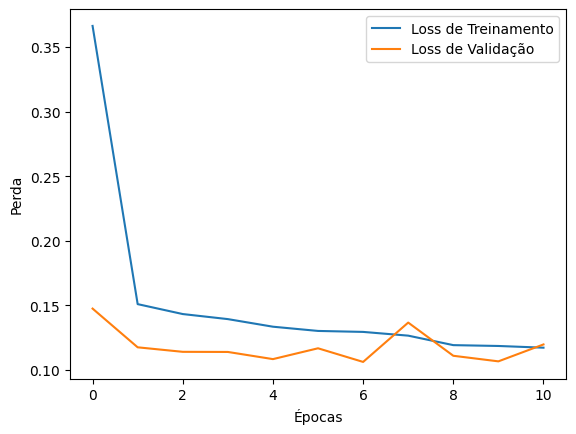

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1171
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


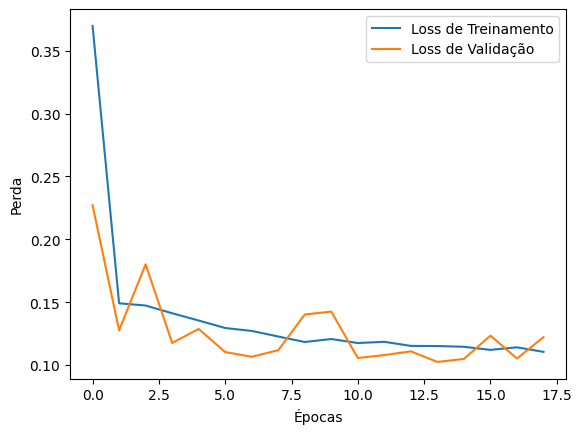

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0967
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


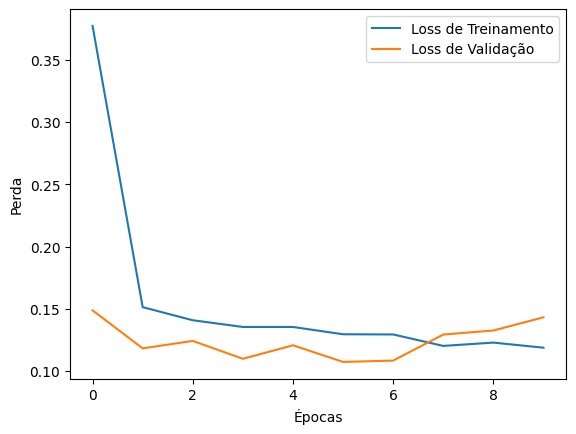

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0843
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


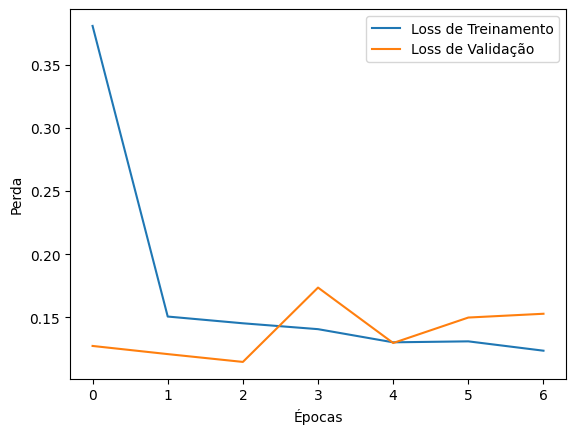

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1326
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


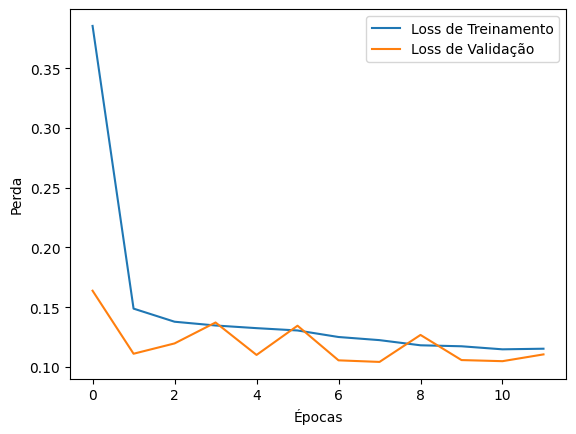

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0944
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


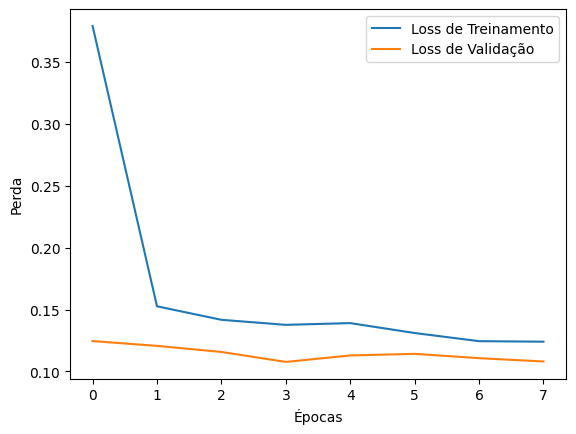

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1009
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


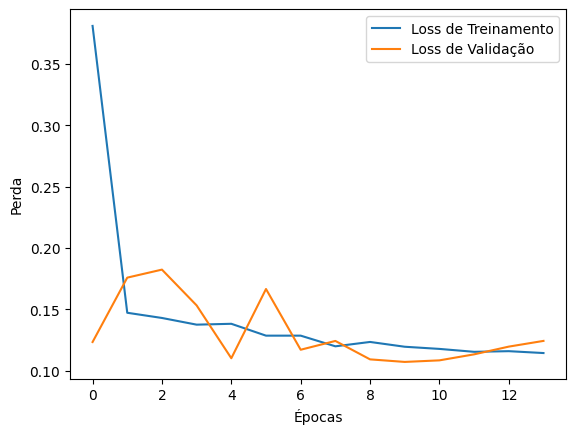

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1122
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


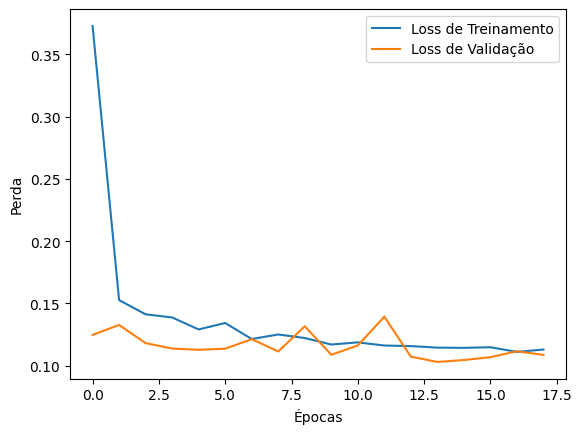

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1043
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


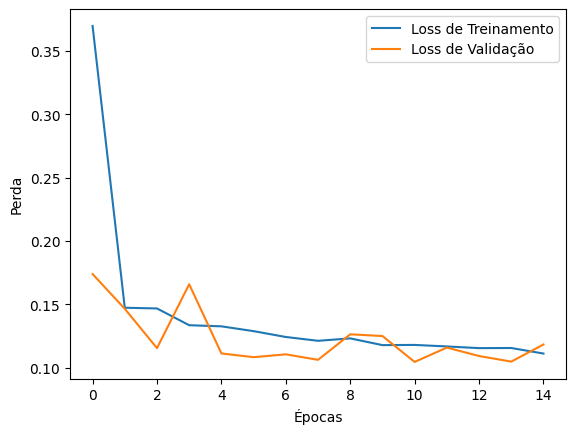

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1093
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


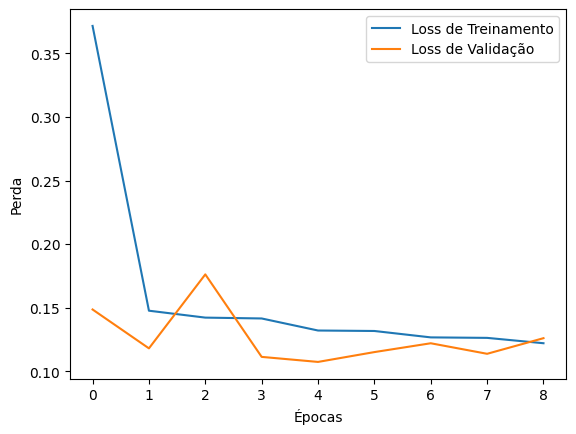

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0888
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


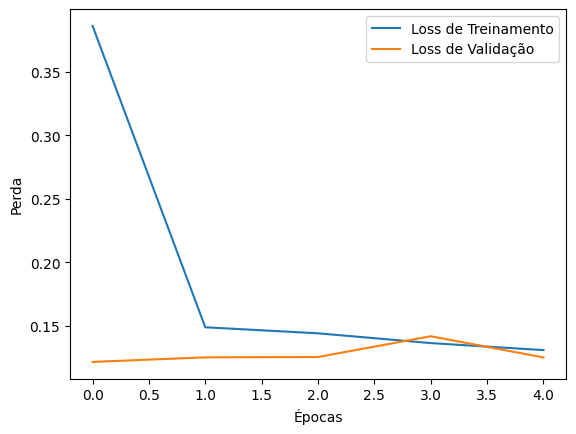

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0753
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


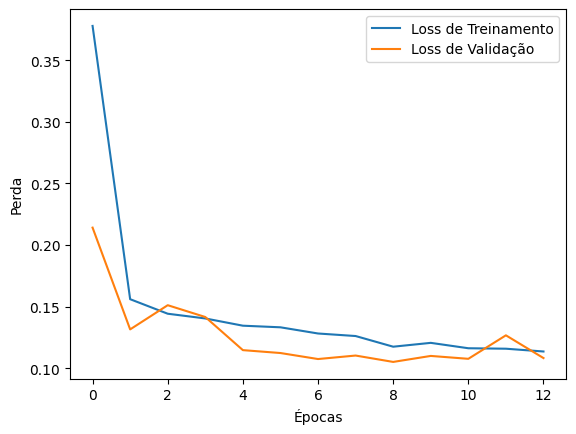

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0930
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


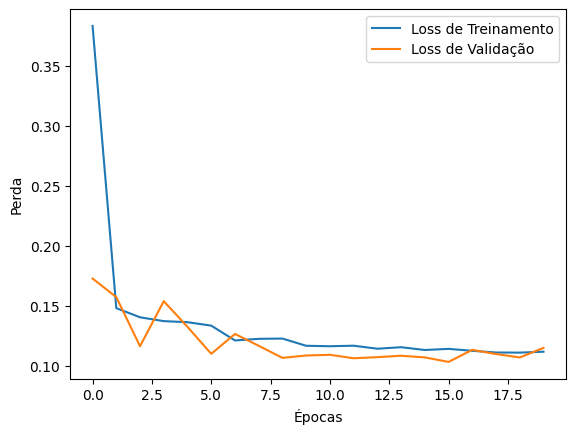

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0902
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


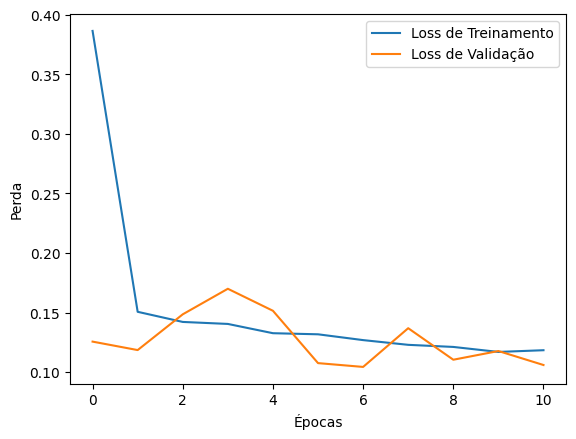

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1097
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


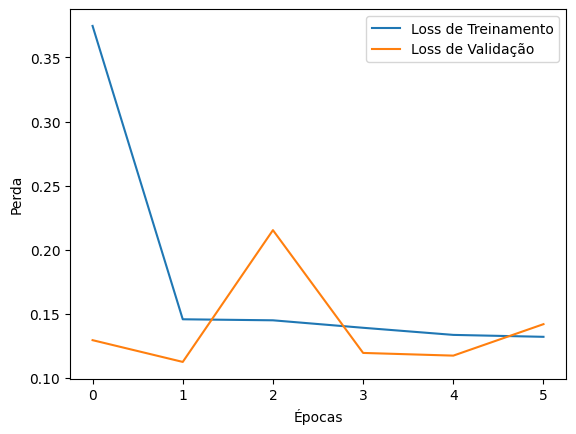

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1161
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


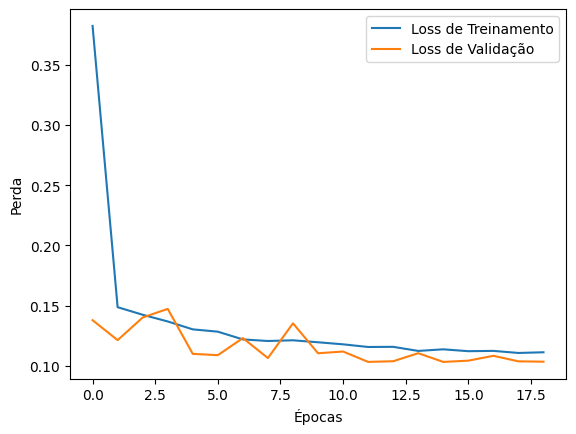

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1026
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


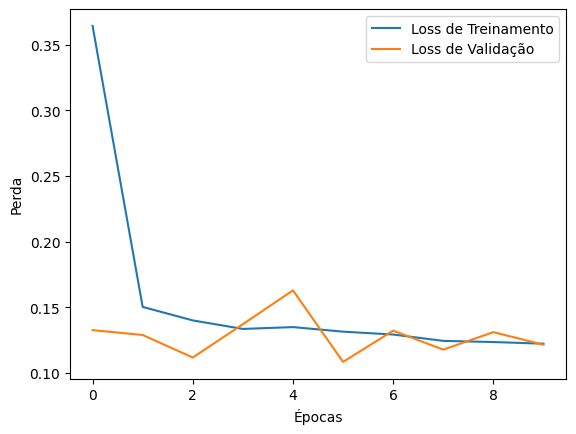

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0907
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


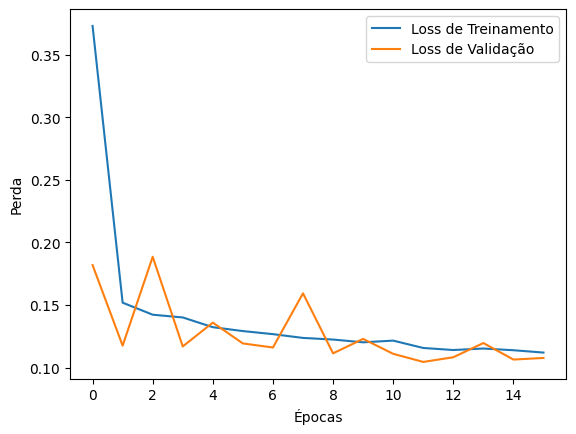

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0940
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


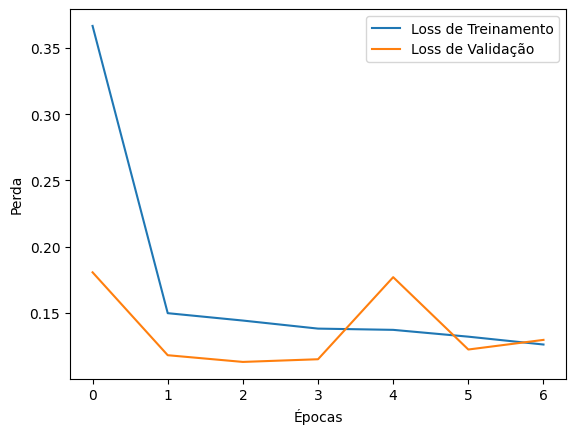

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1235
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


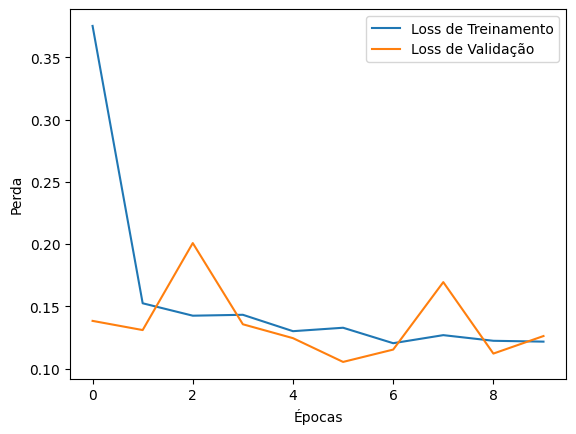

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1123
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


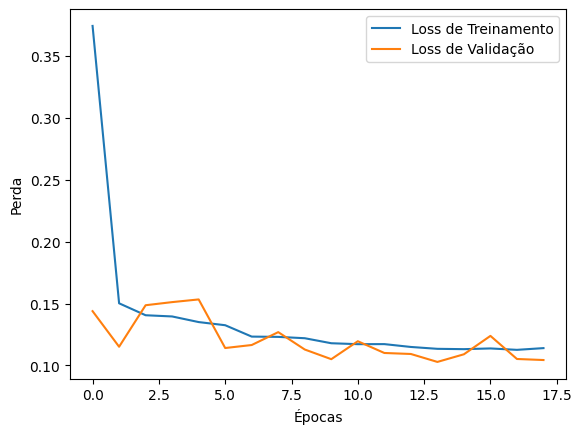

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1016
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


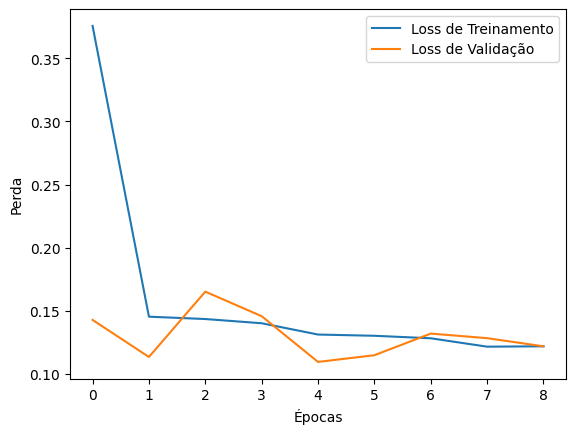

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0943
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


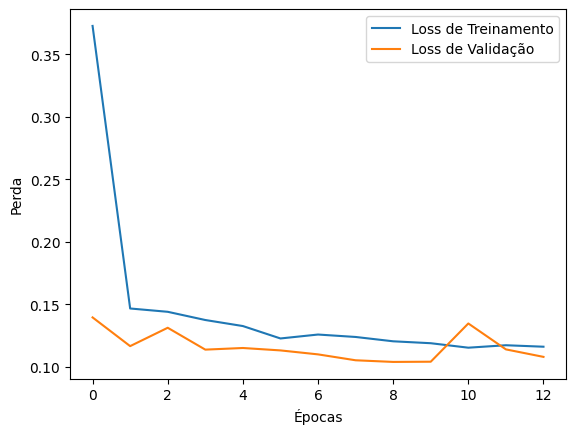

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1116
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


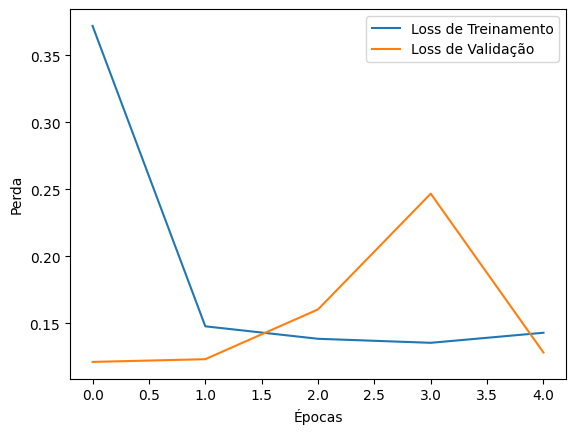

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1089
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


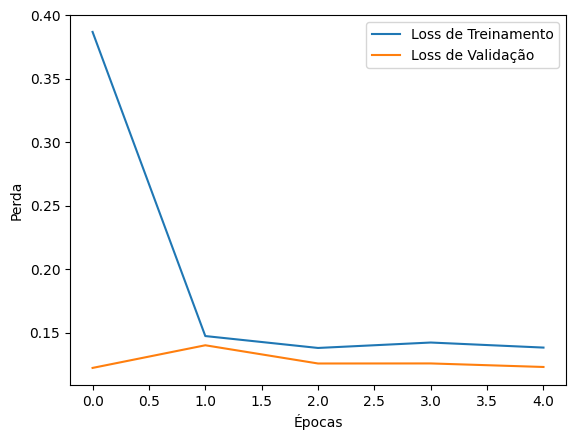

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0913
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


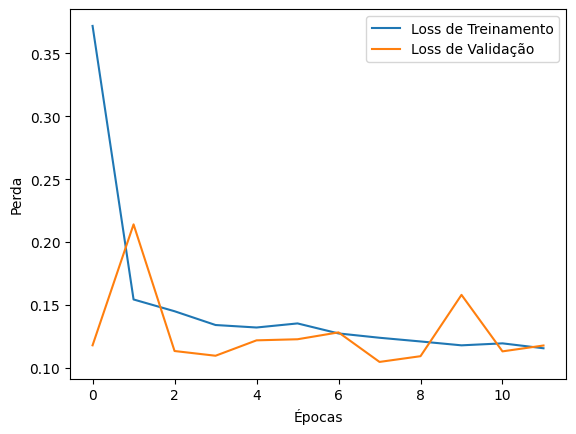

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1045
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


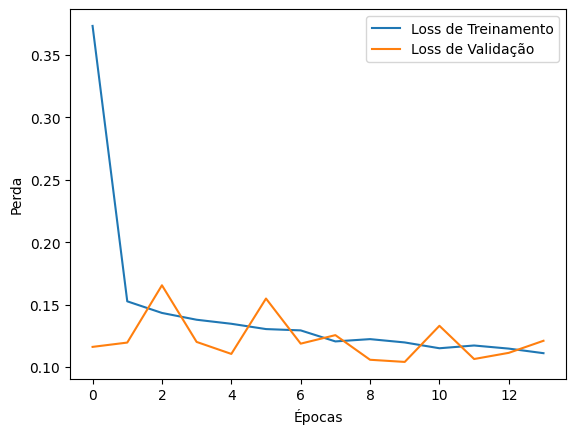

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1023
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


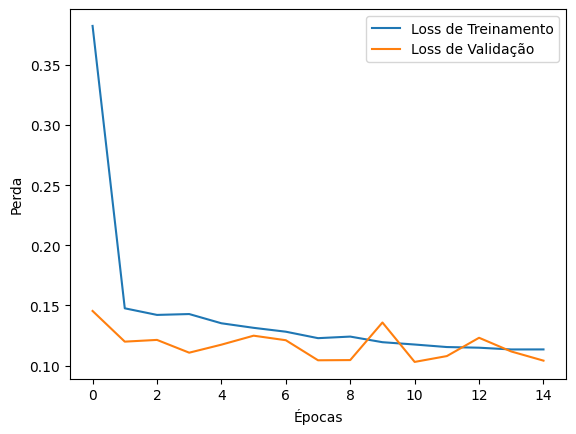

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0901
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


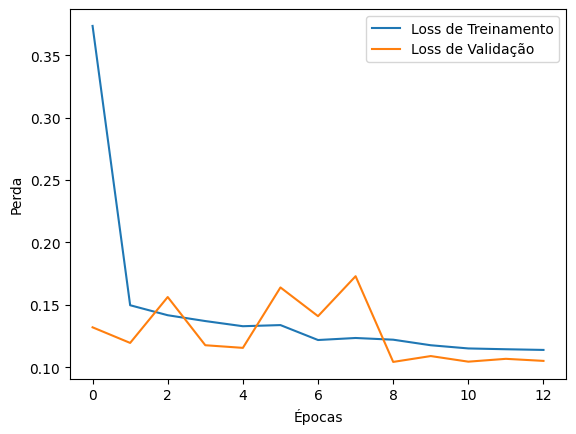

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1002
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


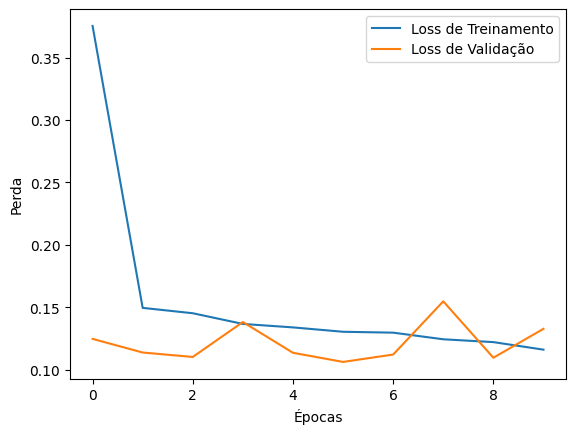

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1000
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


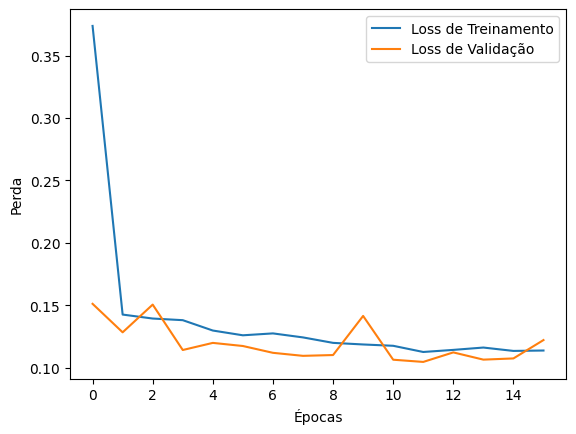

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0975
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


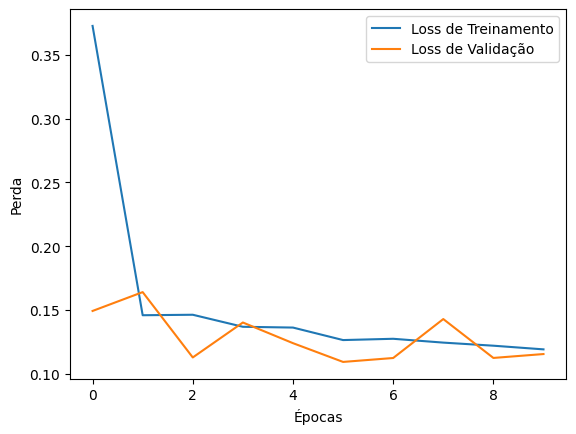

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1238
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


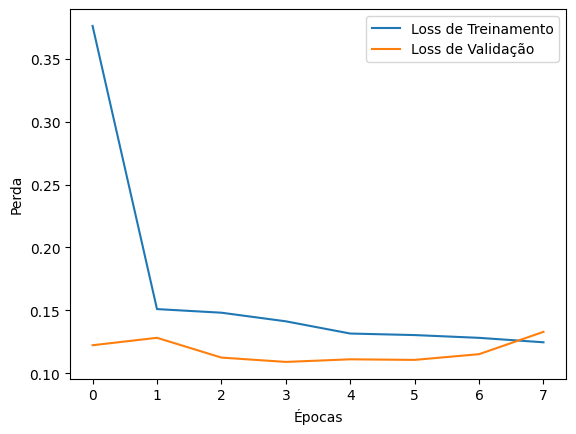

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0922
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


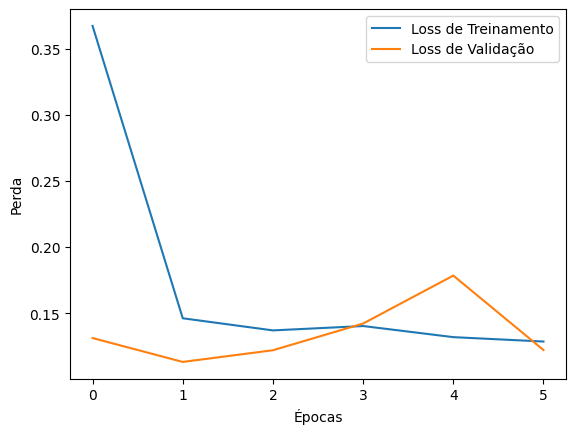

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1015
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


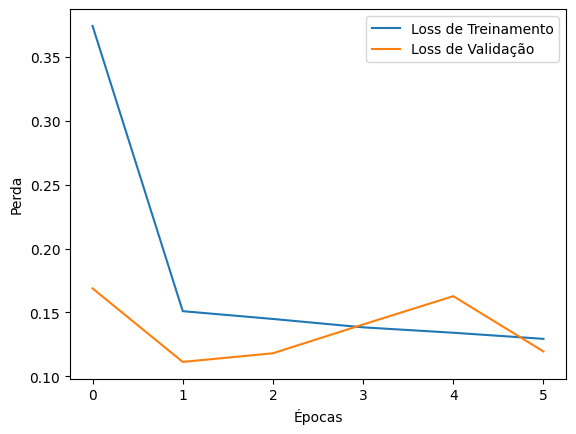

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0989
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


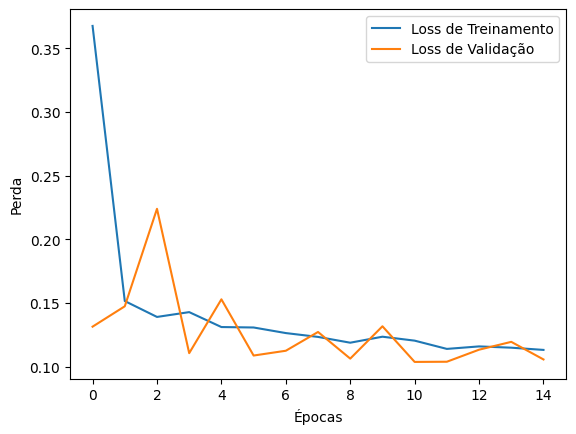

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1141
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


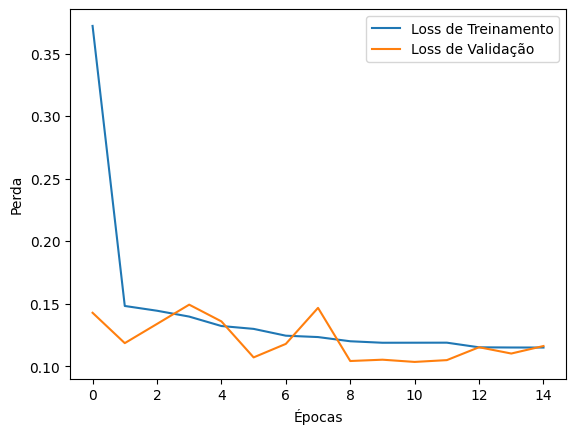

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1094
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


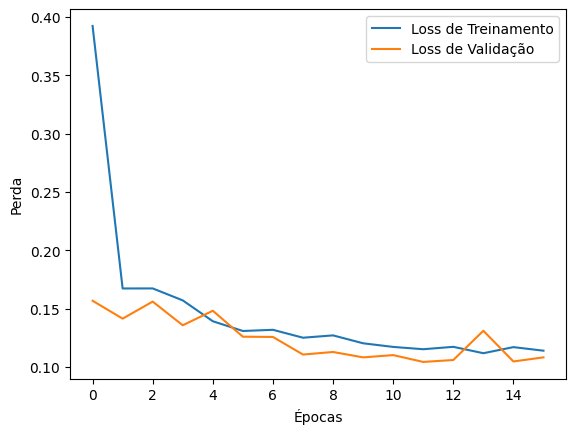

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1038
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


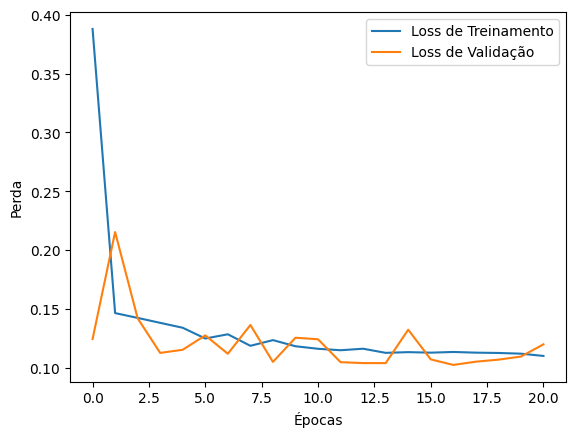

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0979
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


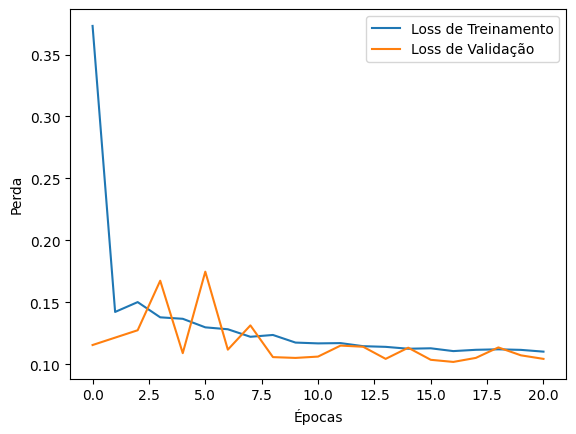

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0974
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


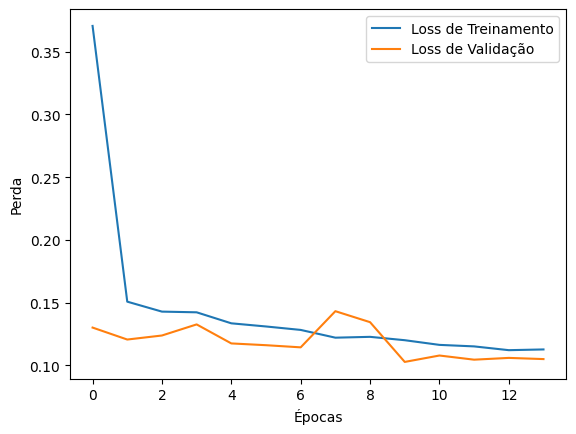

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0927
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


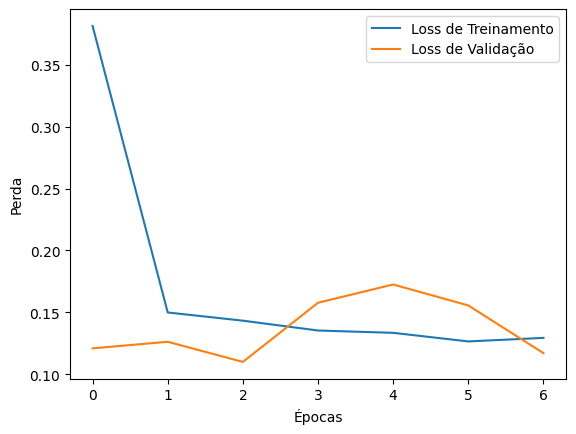

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.1118
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


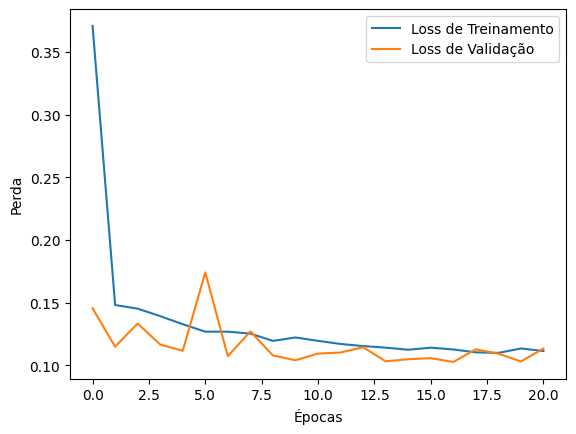

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0899
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


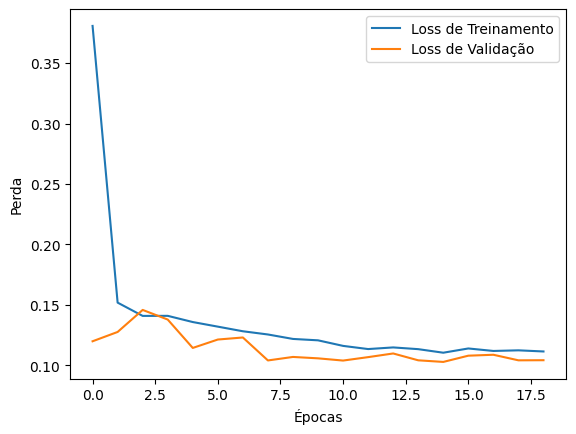

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1012
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


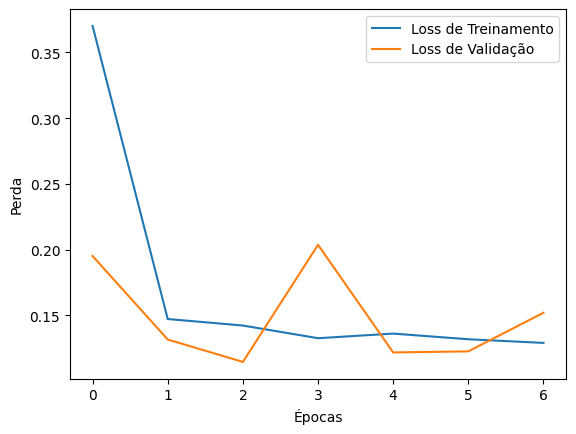

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1244
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


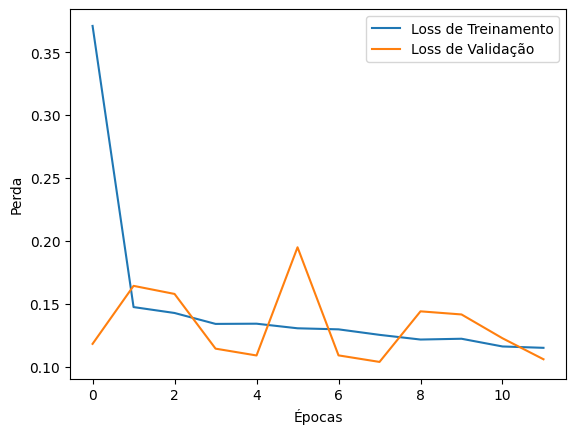

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.1081
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


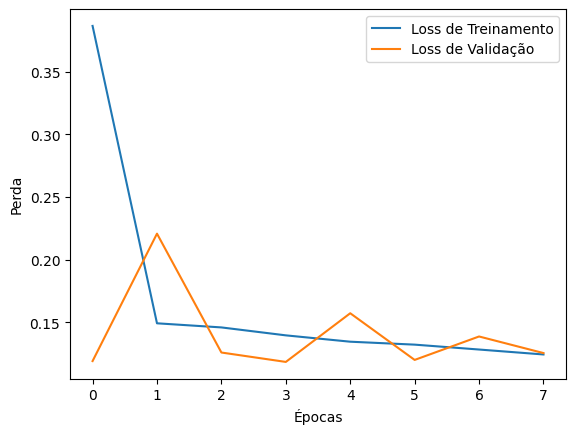

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0555
best_score_until_now 0.05549975484609604
Melhor solução encontrada até agora: [1.36658614]
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


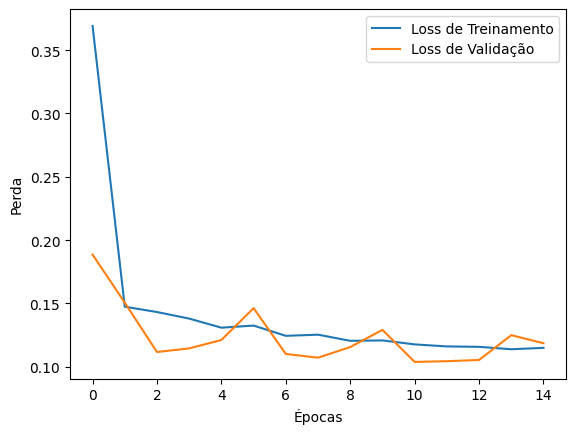

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0908
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


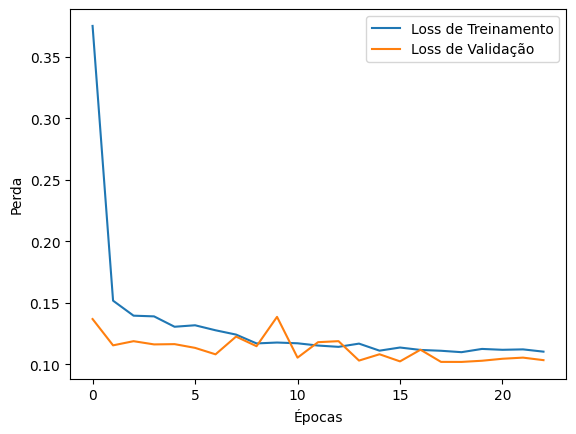

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0934
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


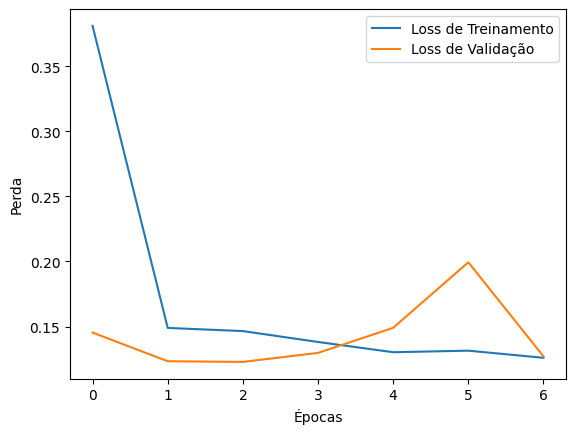

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1571
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


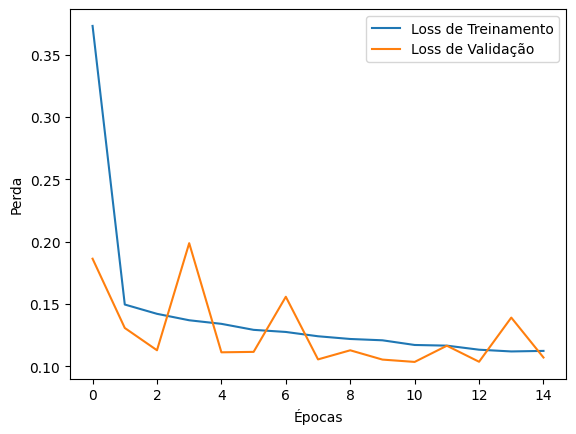

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1019
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


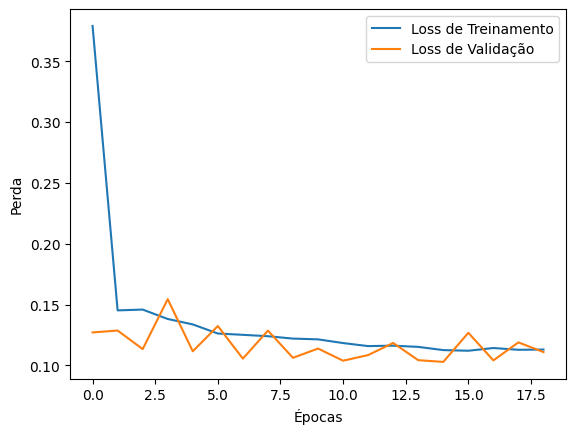

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0936
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


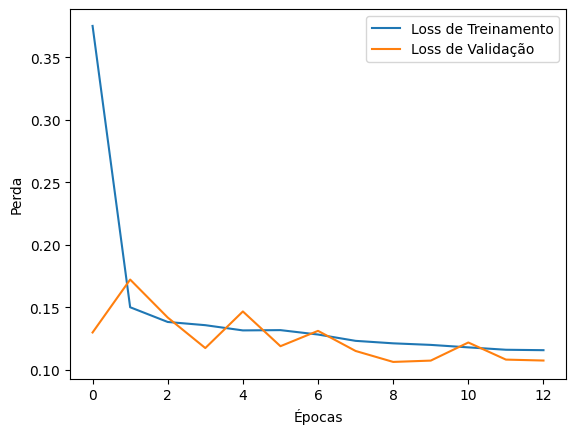

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0865
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


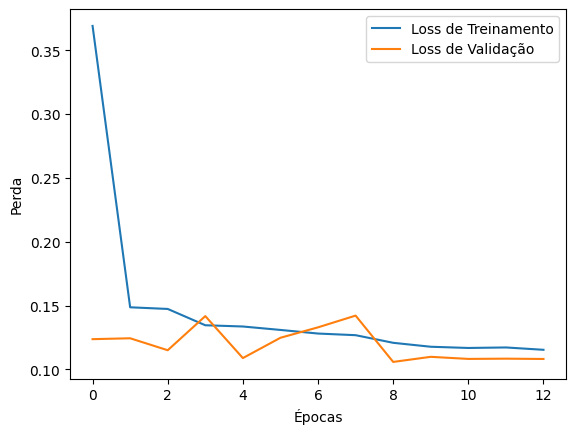

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0767
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


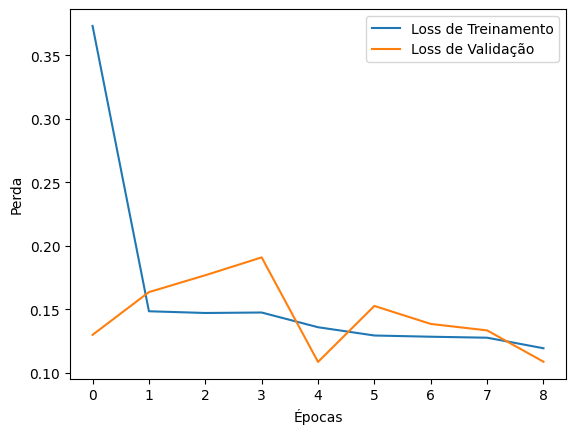

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1037
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


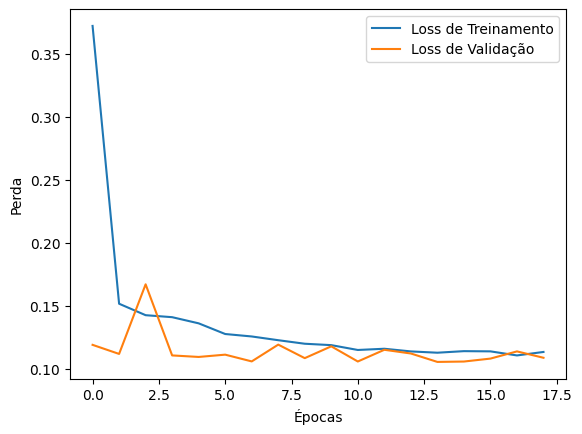

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1222
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


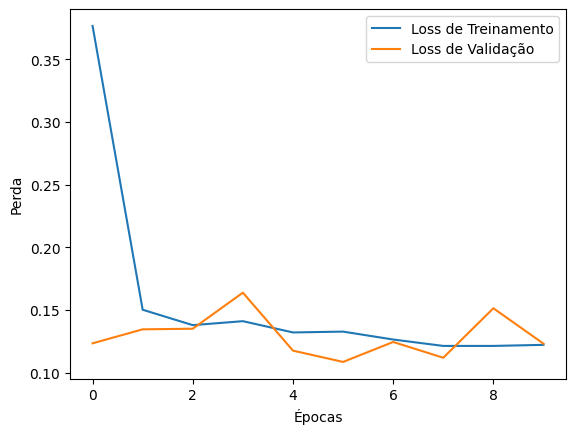

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0952
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


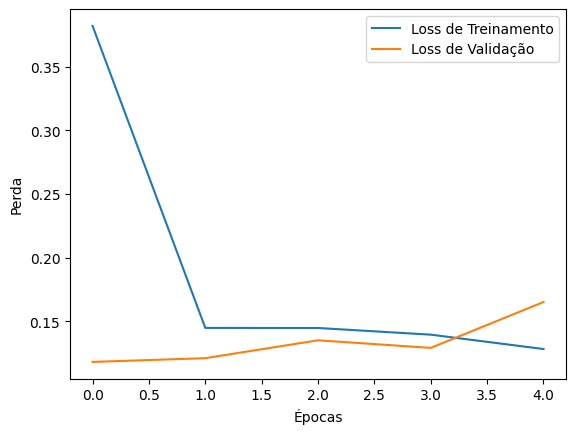

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1026
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


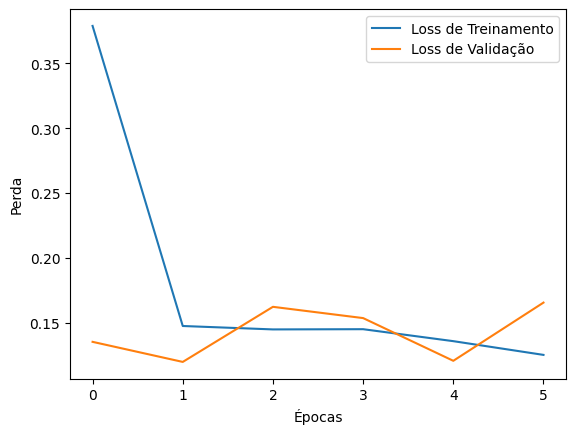

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0867
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


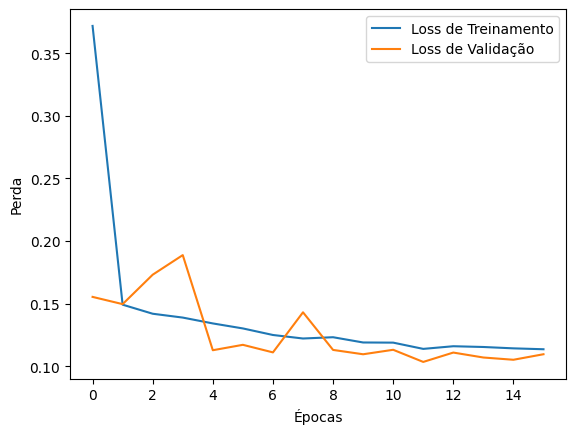

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1069
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


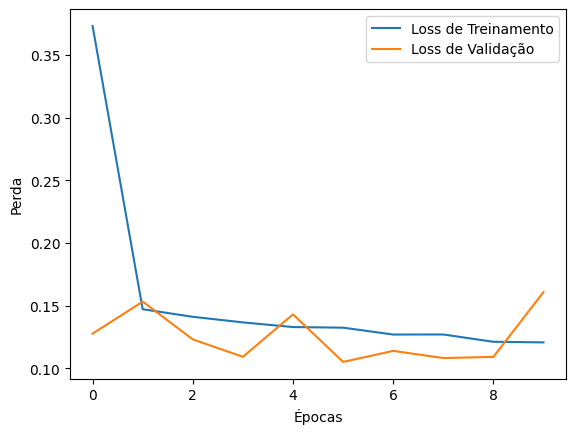

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1108
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


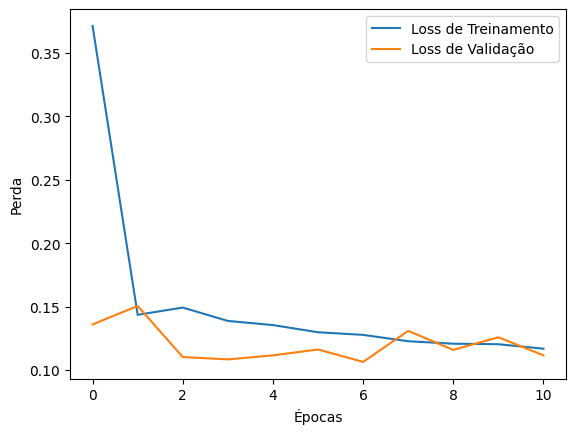

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1034
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


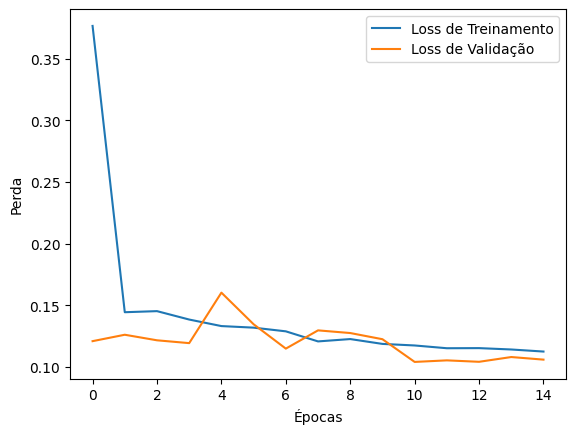

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0850
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


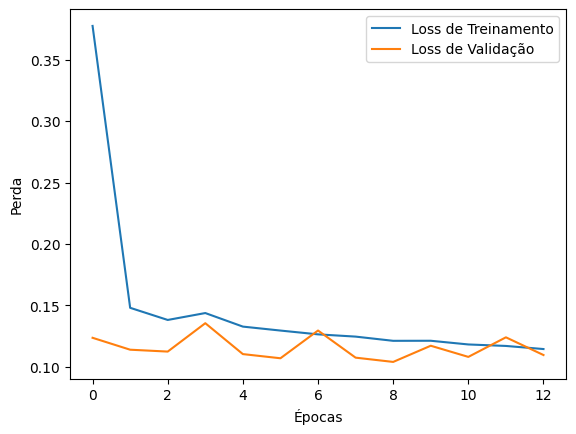

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


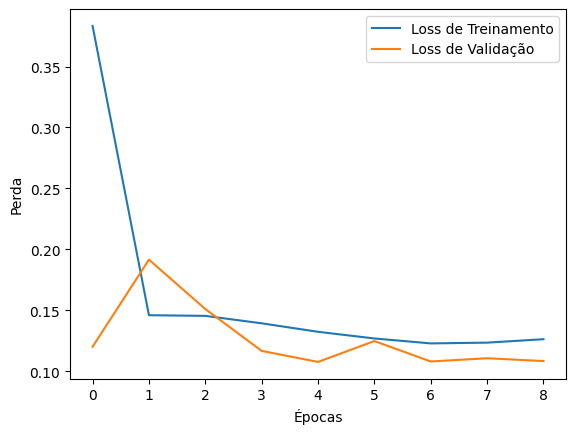

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1010
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


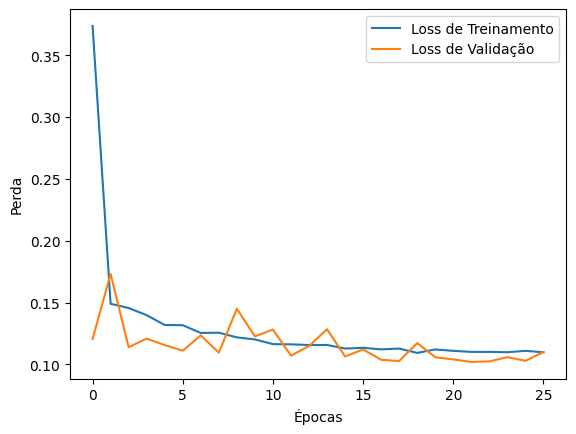

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0945
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


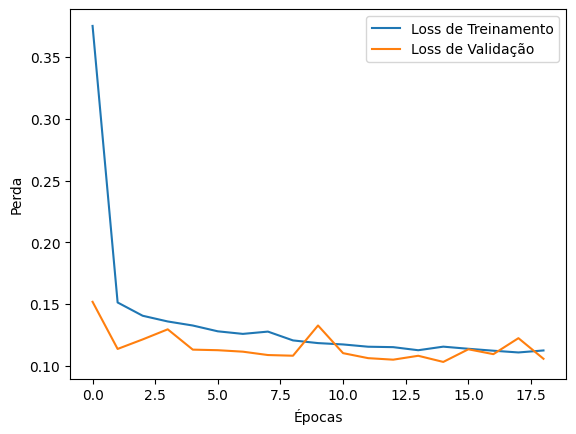

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0942
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


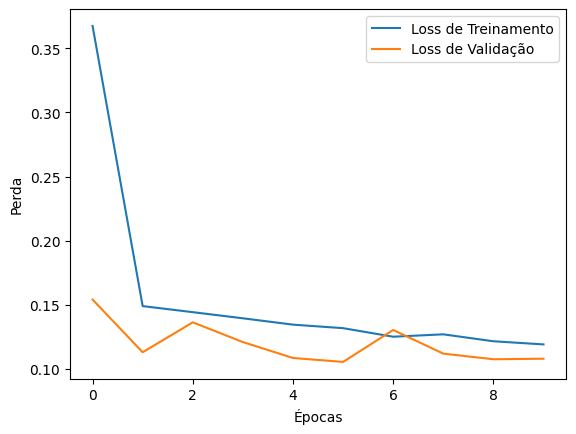

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1140
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


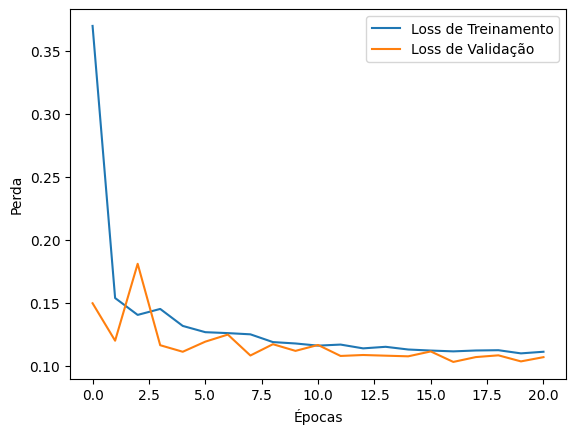

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0809
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


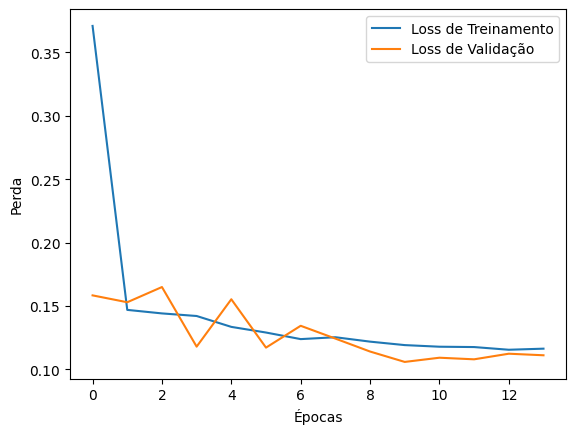

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1101
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


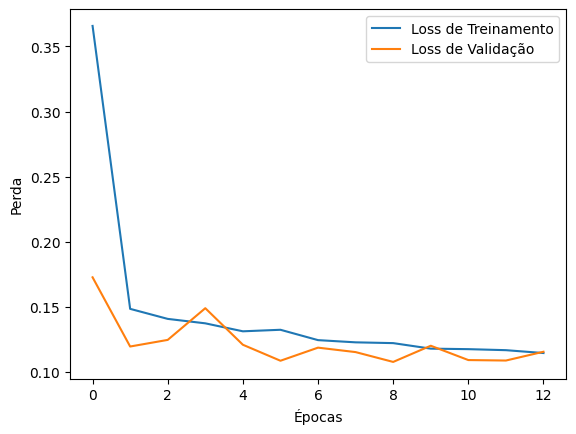

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1127
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


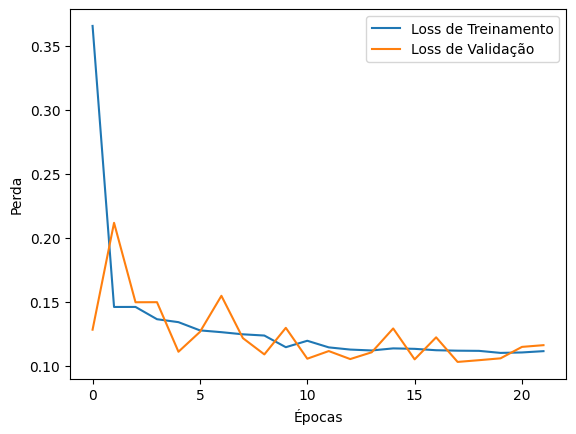

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0948
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


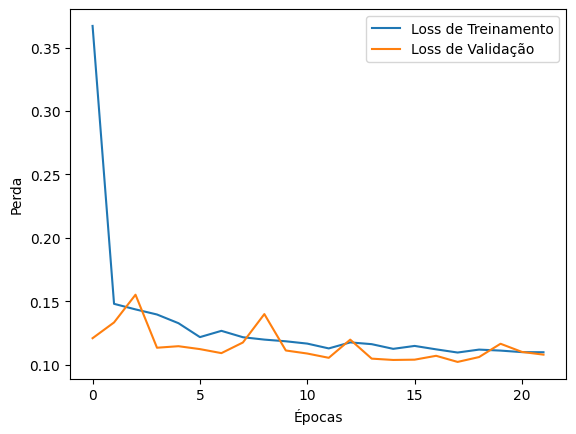

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0901
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


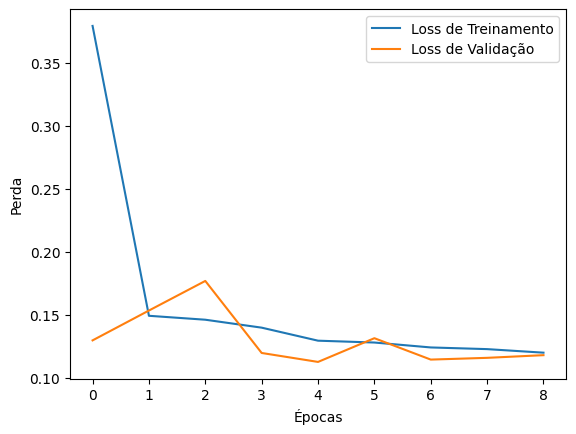

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0893
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


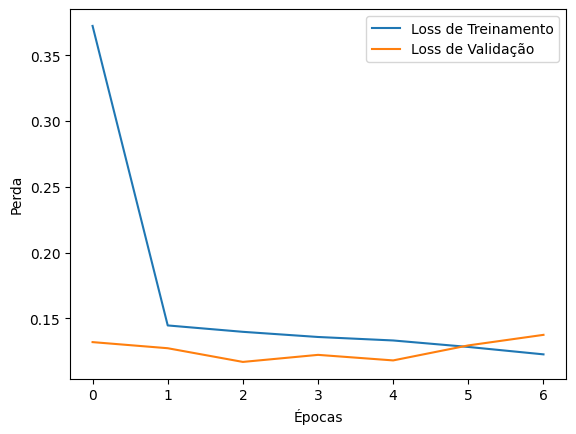

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1090
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


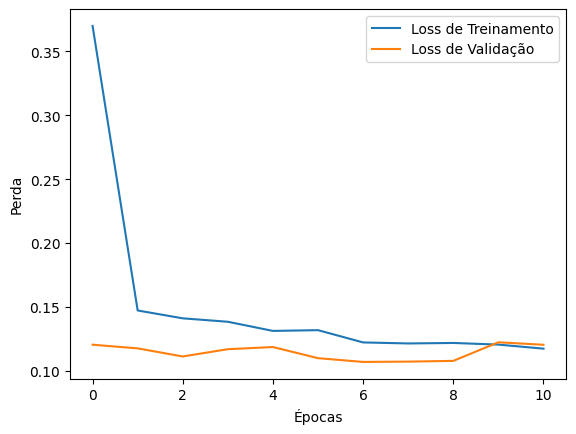

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1107
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


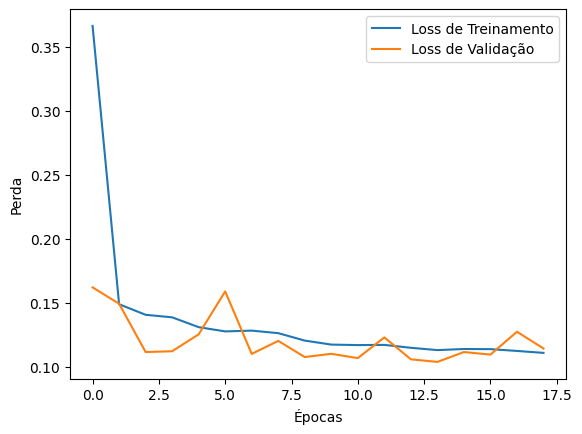

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1001
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


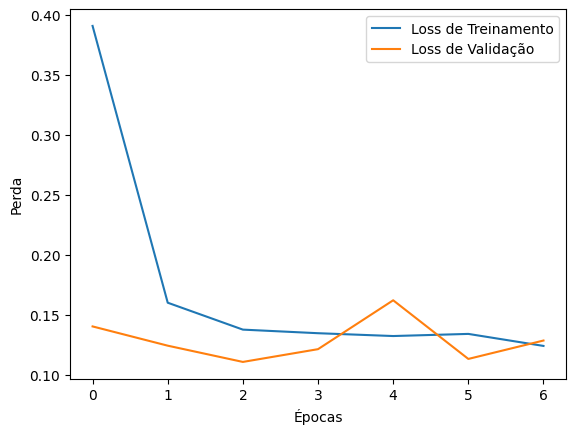

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1168
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


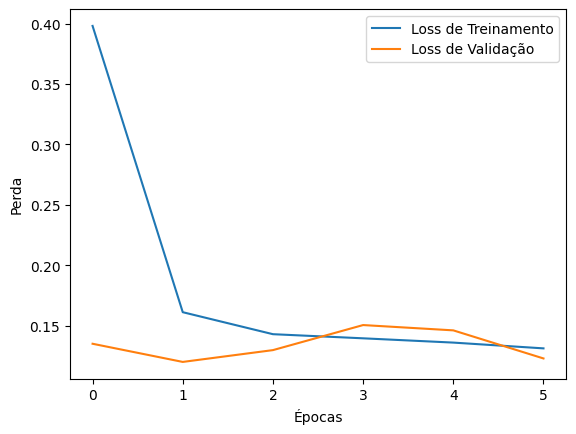

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0906
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


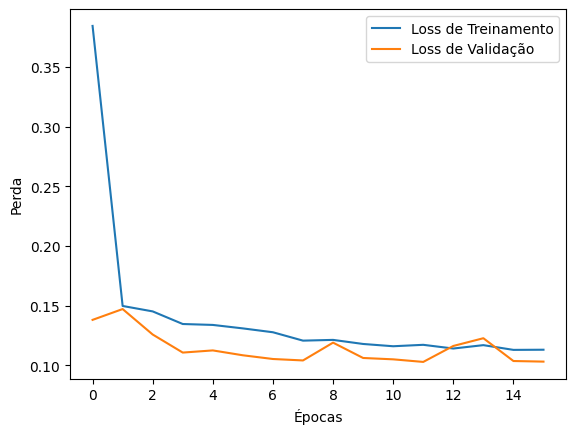

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0994
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


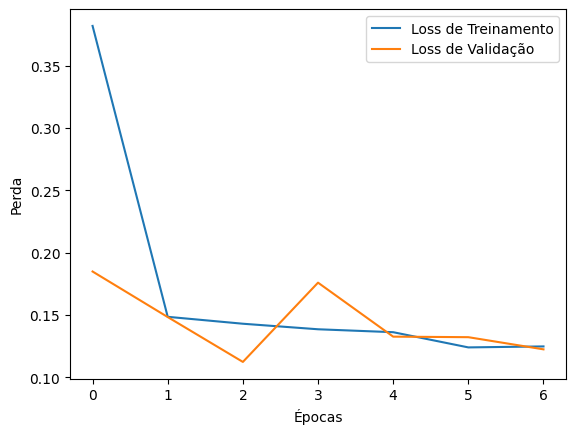

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1234
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


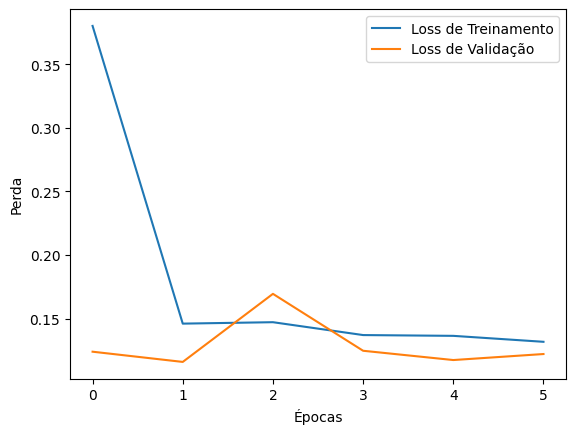

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0781
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


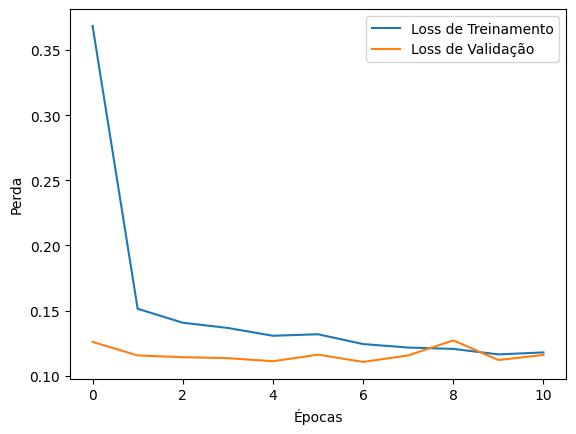

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0832
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


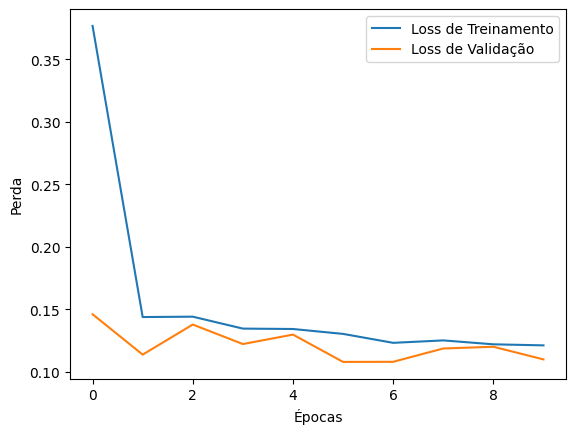

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.1008
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


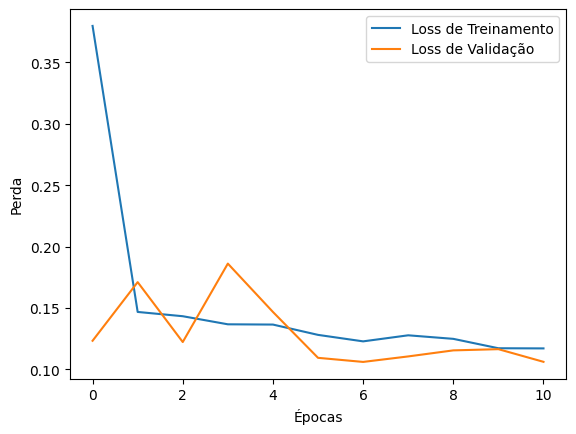

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0972
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


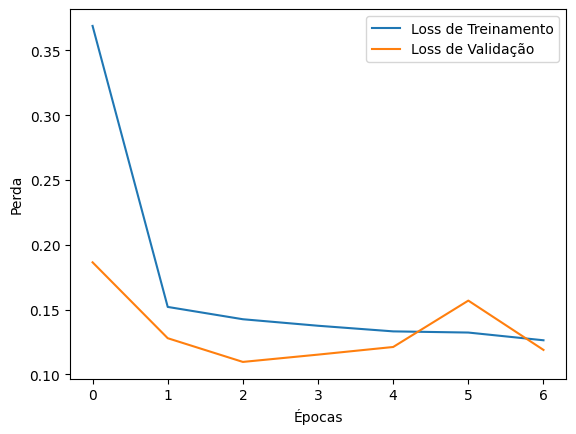

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1144
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


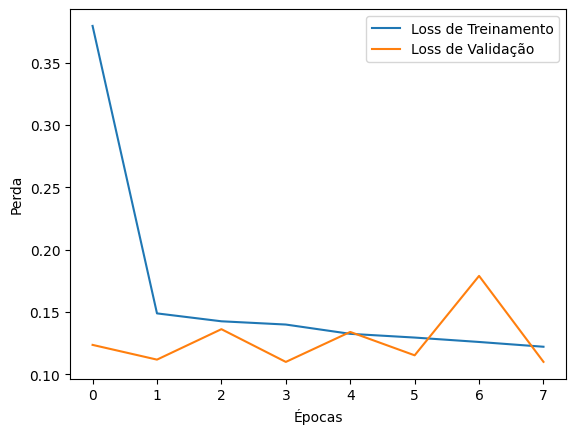

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1089
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


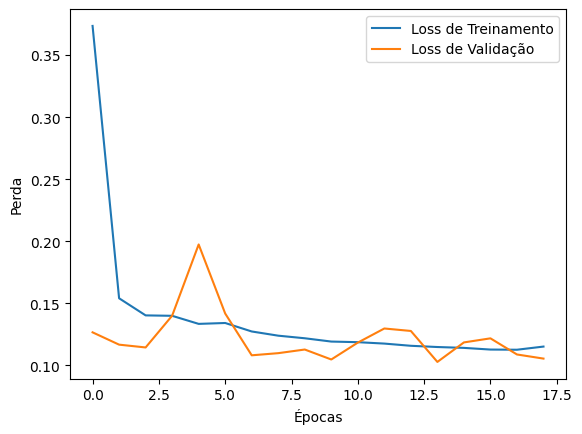

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1090
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


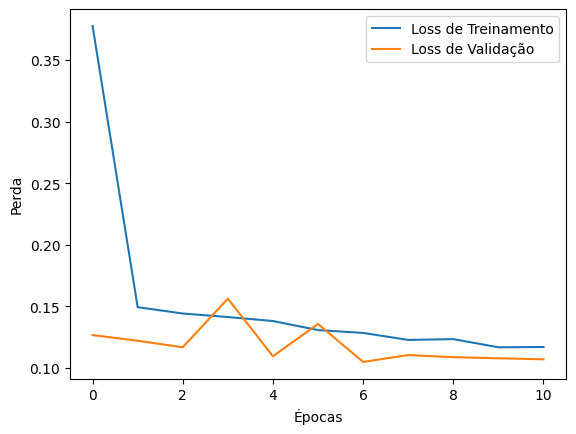

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1056
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


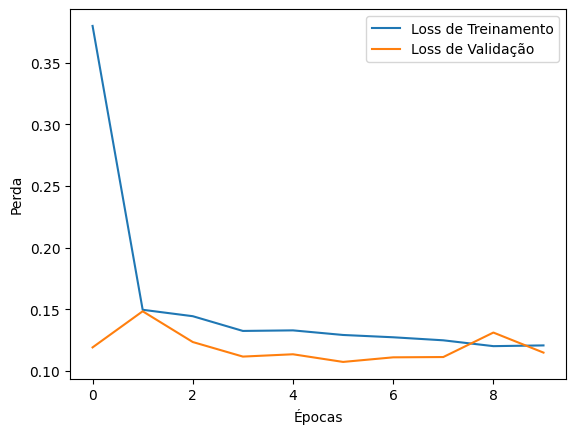

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1182
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


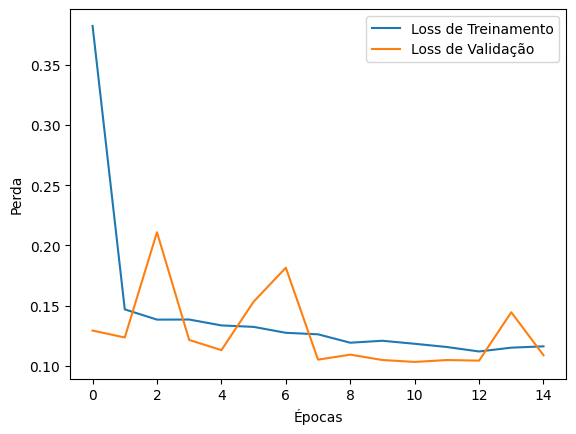

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1094
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


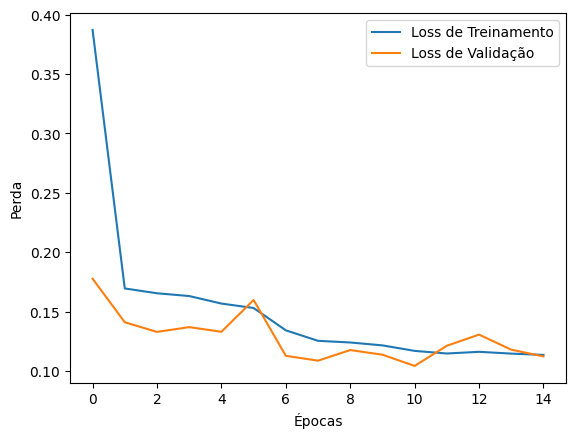

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1098
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


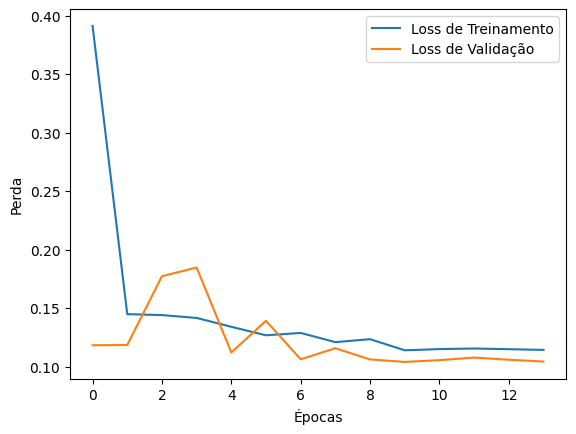

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1071
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


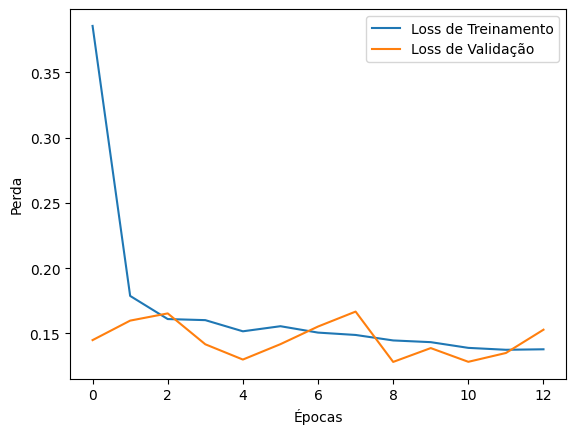

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.1209
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


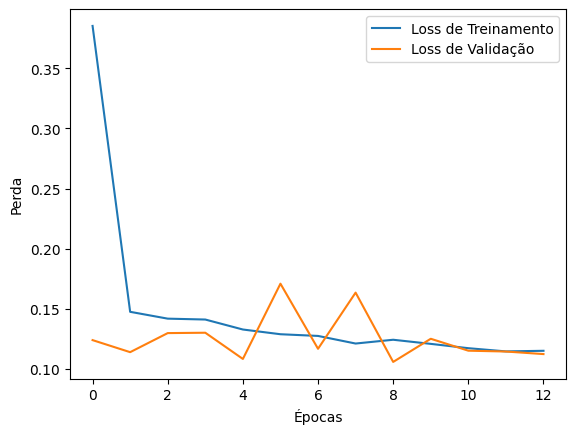

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1187
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


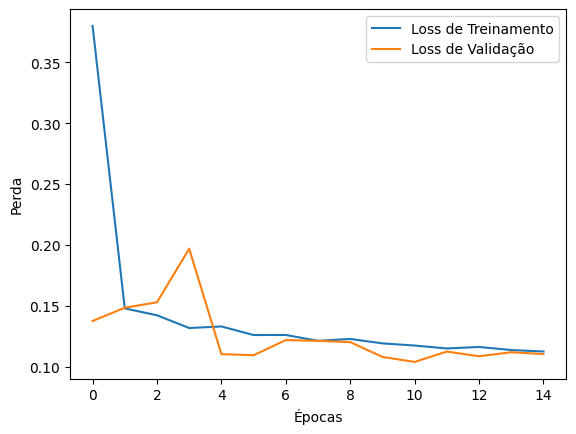

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1059
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


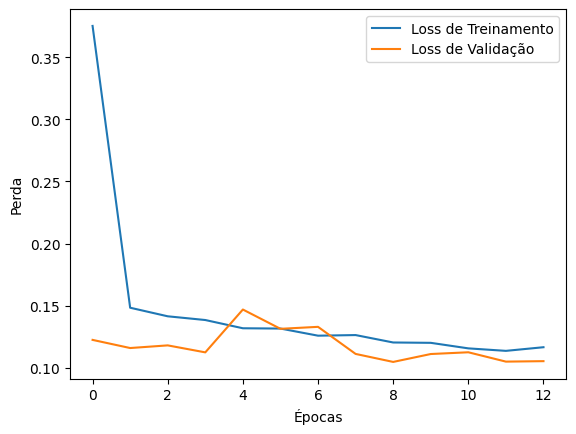

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0915
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


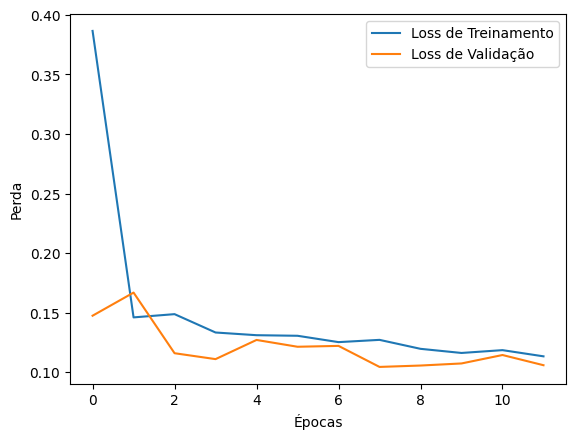

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1011
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


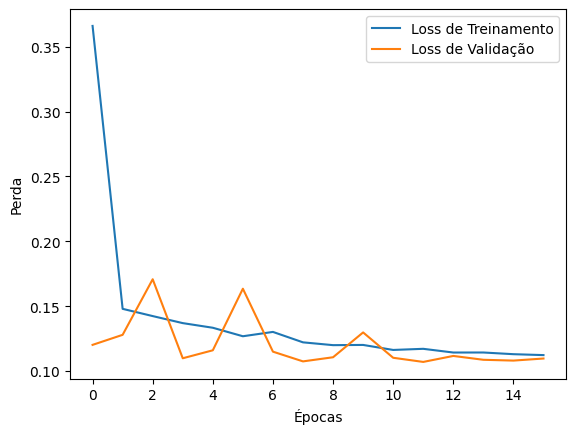

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0912
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


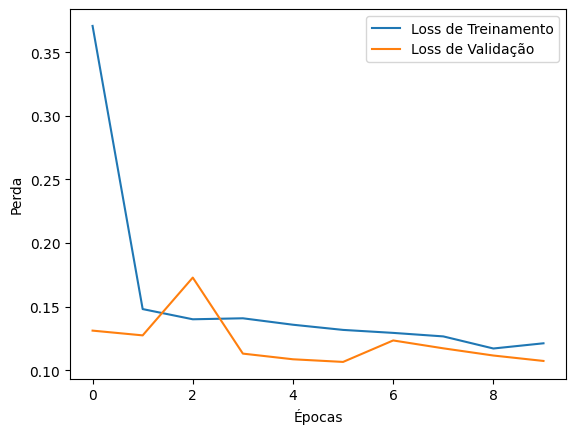

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0898
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


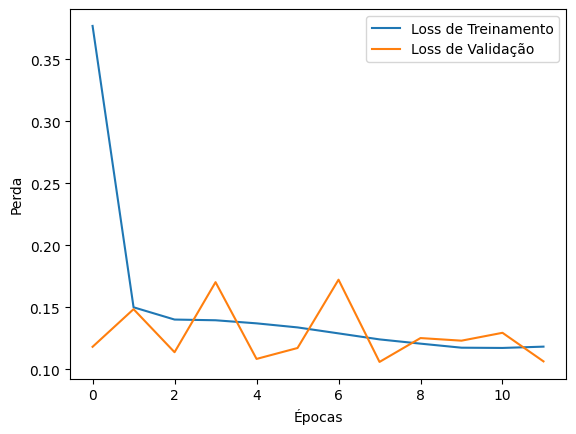

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0990
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


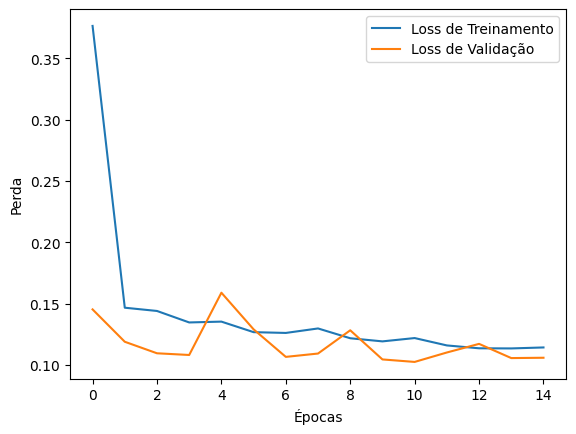

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0960
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


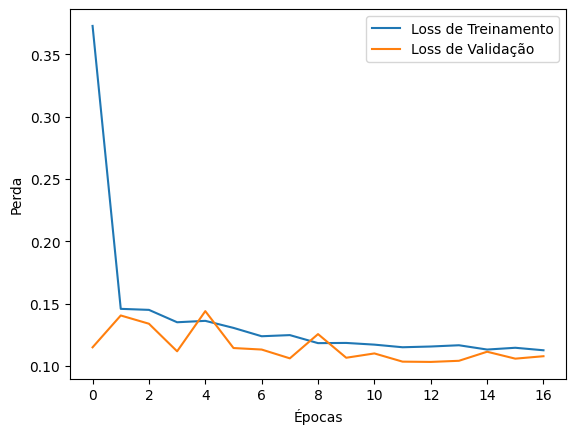

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1005
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


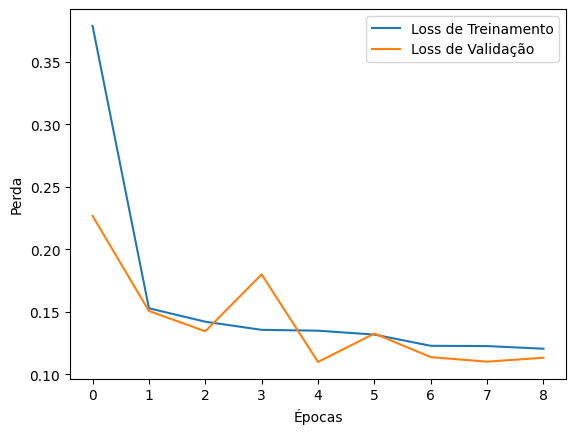

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1108
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


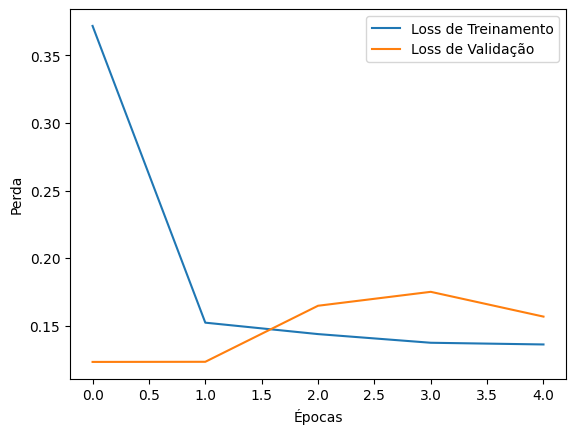

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1238
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


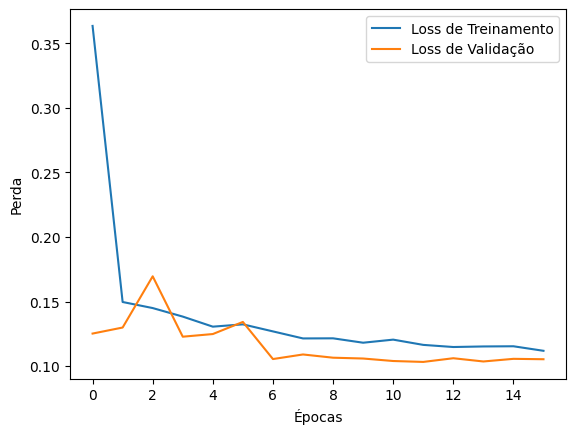

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0979
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


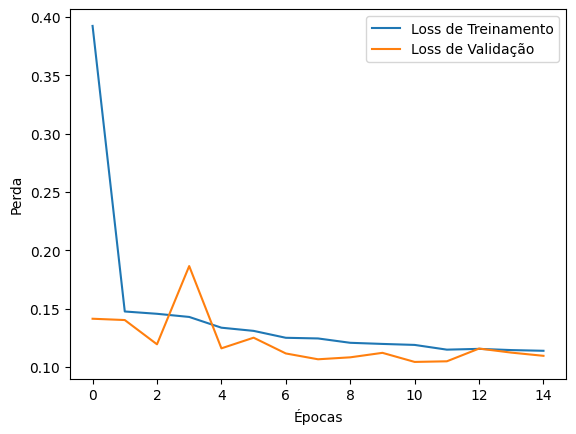

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1071
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


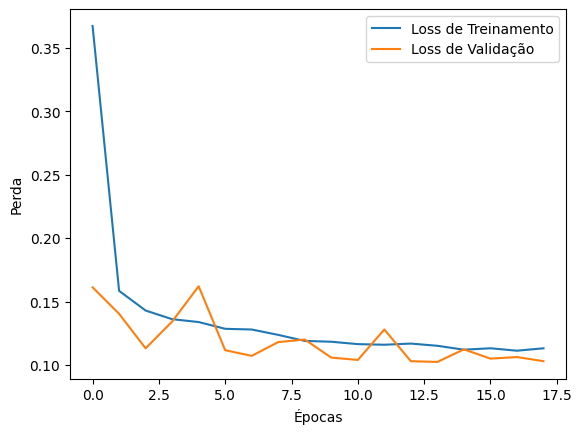

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.1032
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


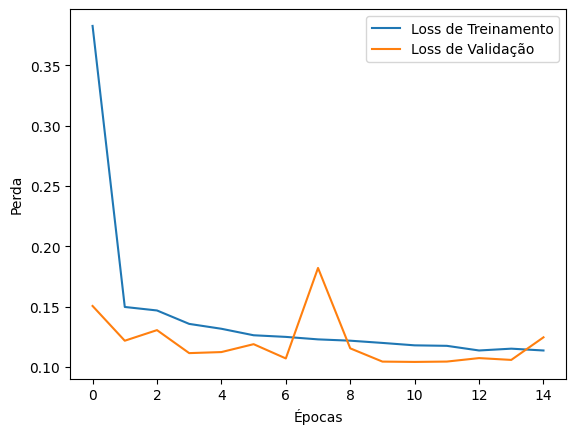

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0937
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


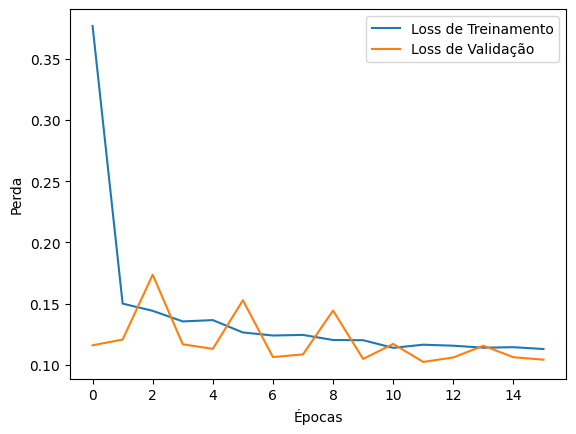

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0978
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


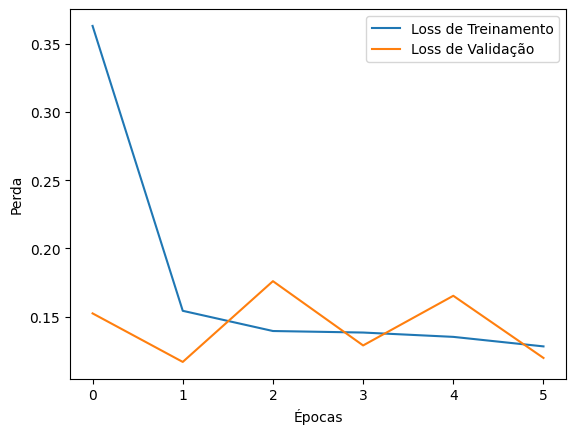

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0818
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


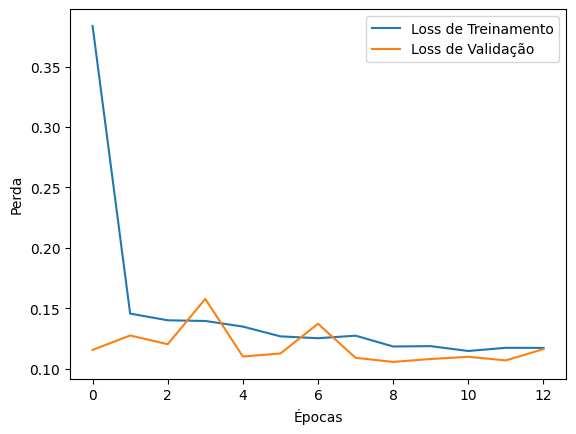

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.1139
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


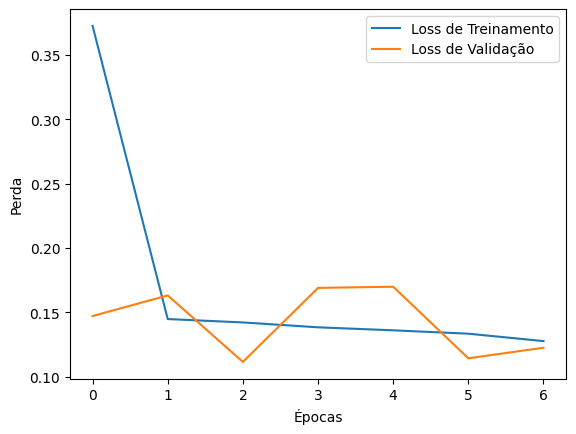

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1078
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


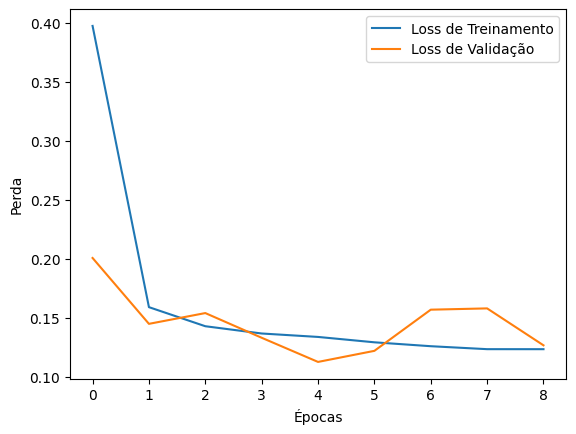

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1160
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


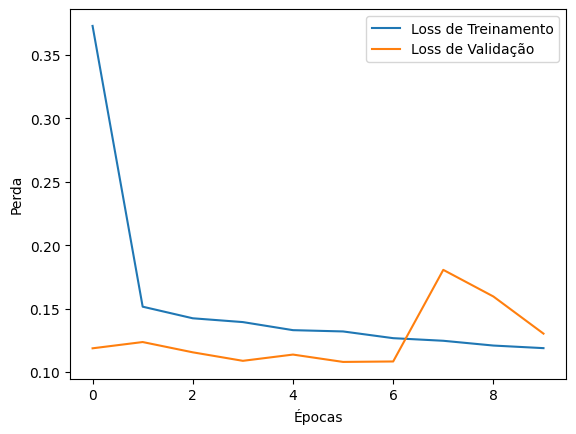

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0872
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


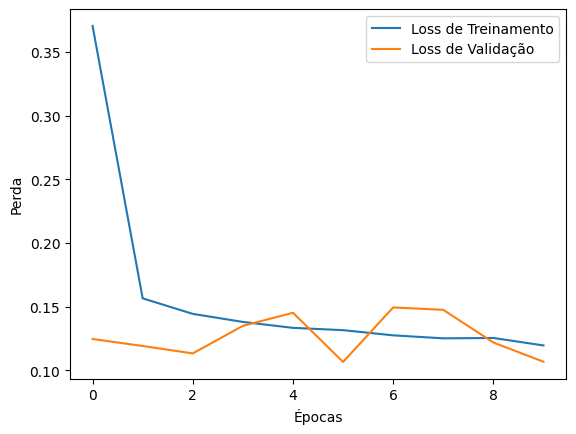

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0910
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


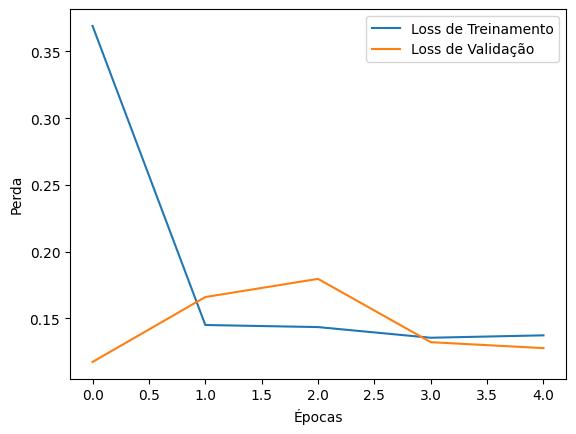

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0996
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


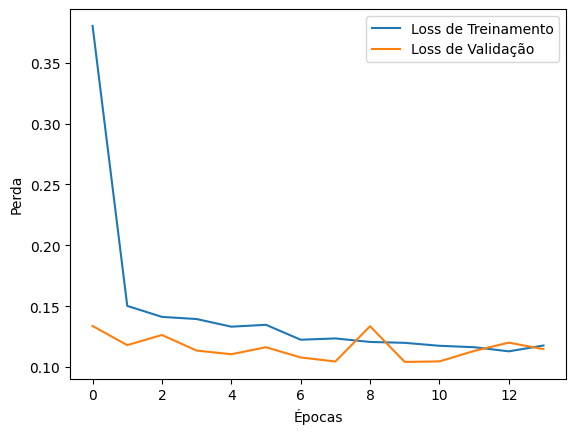

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1003
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


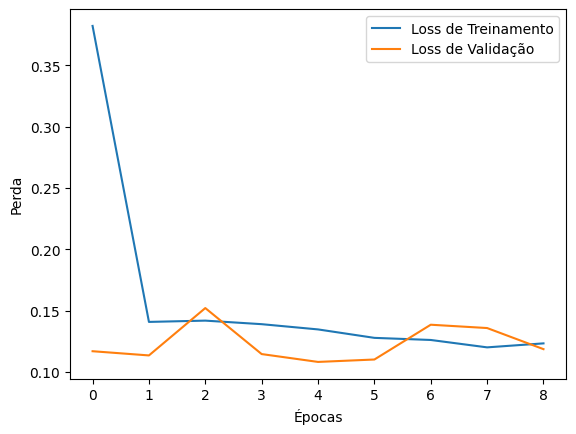

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1049
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


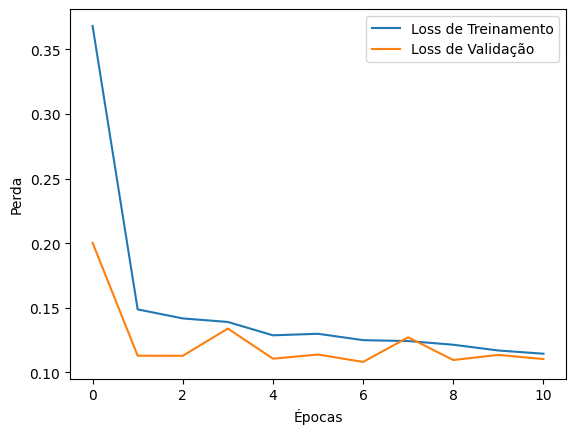

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0956
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


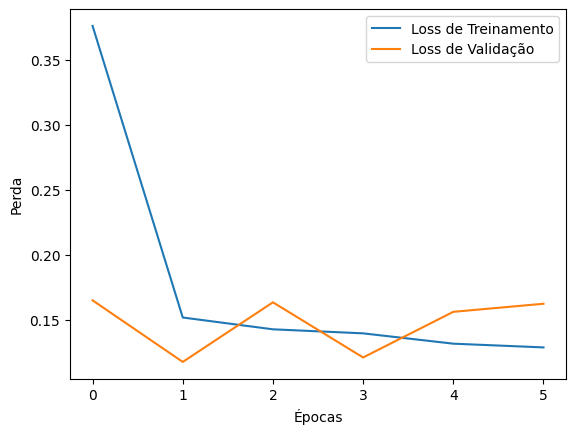

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1180
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


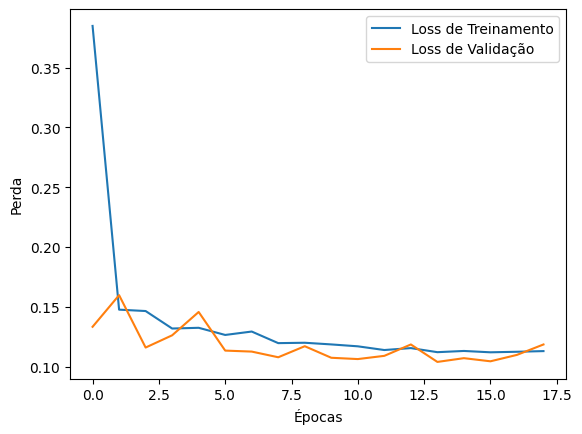

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1038
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


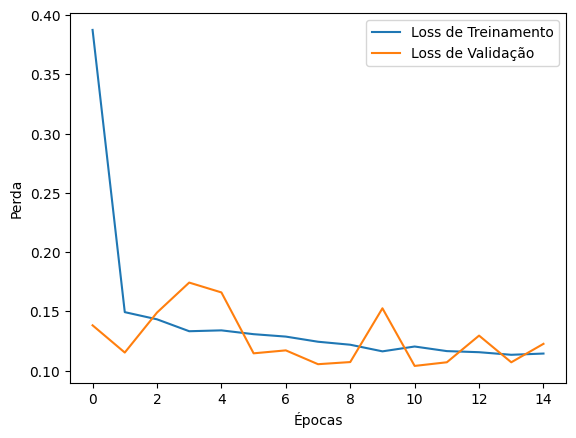

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0997
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


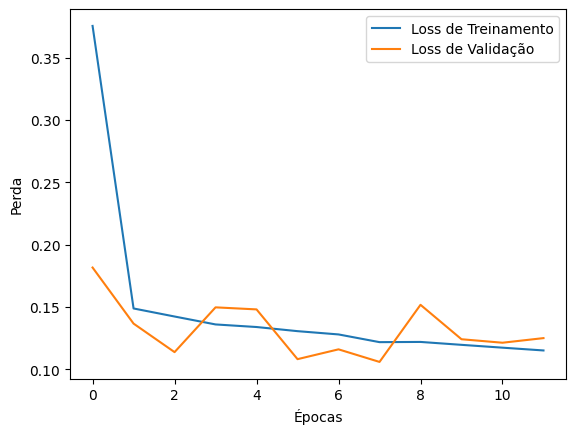

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0903
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


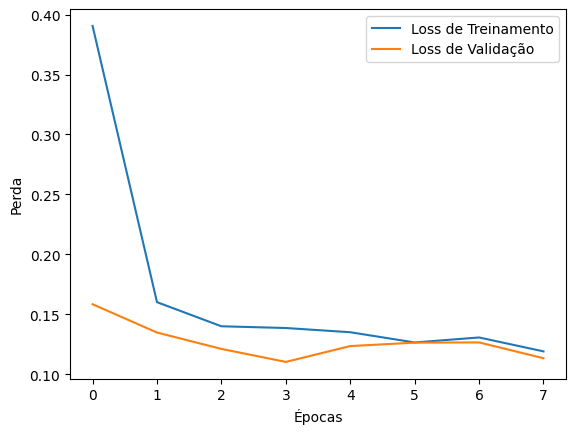

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0806
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


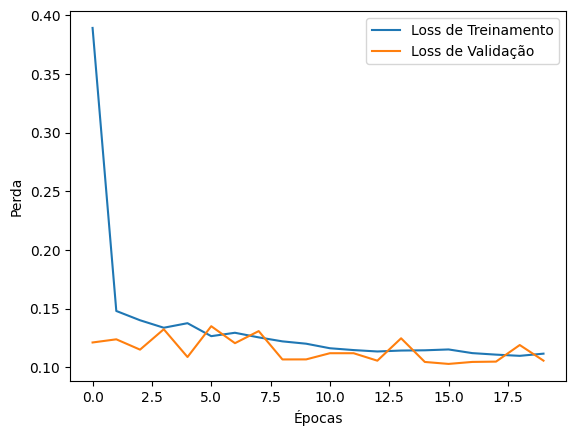

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


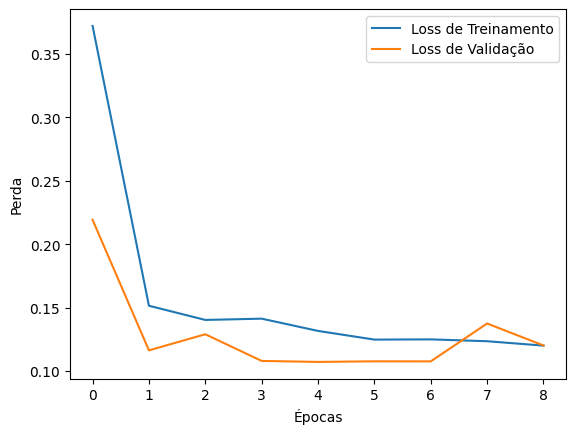

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0956
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


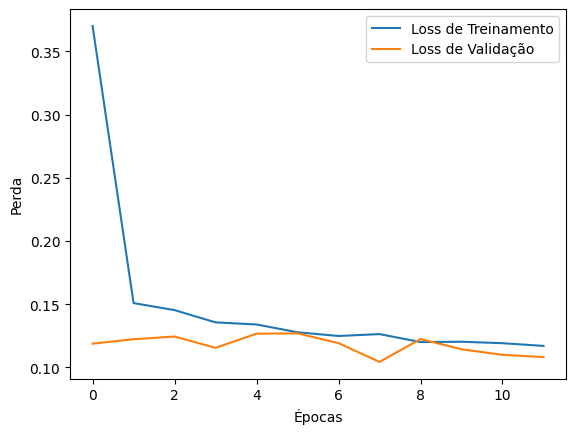

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1016
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


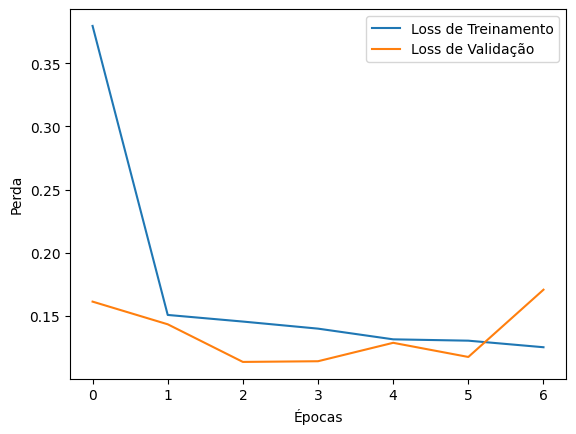

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0999
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


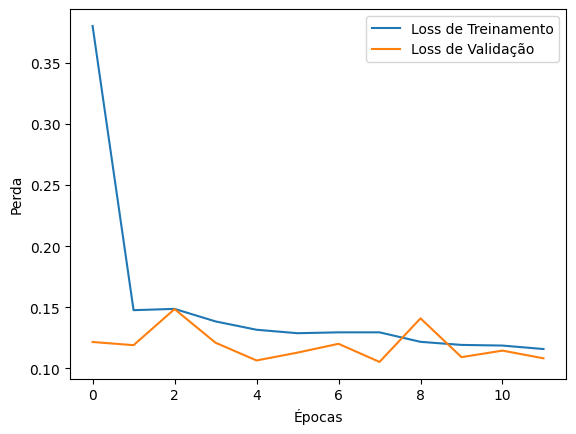

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0982
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


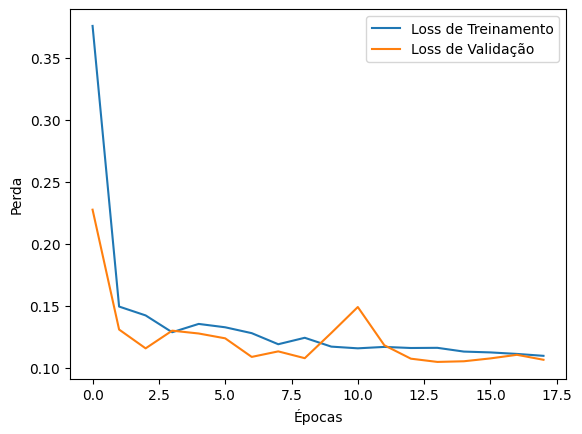

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0978
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


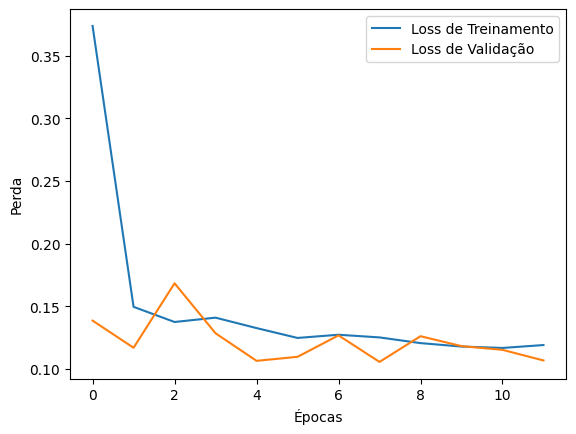

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1063
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


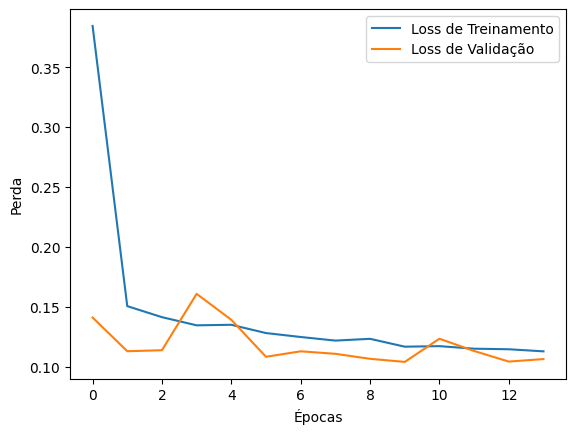

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0984
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


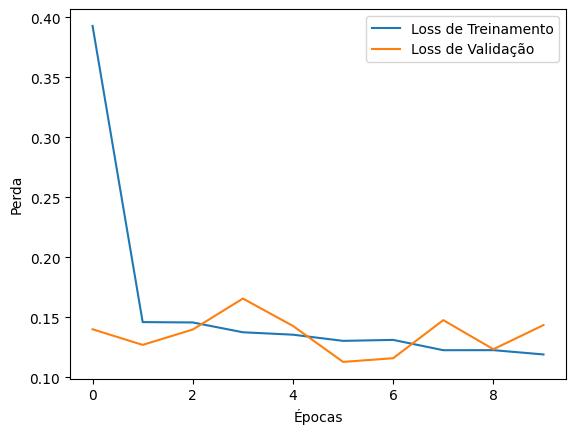

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1159
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


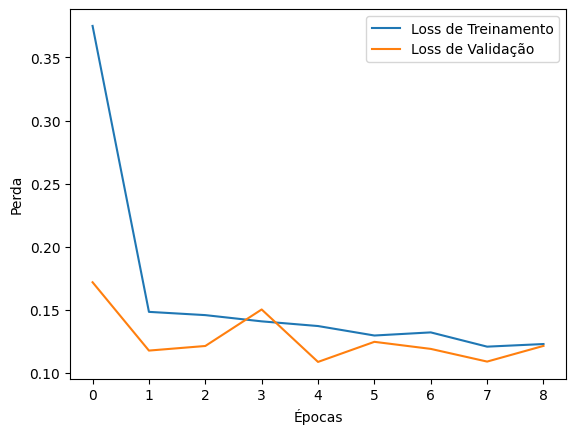

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0995
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


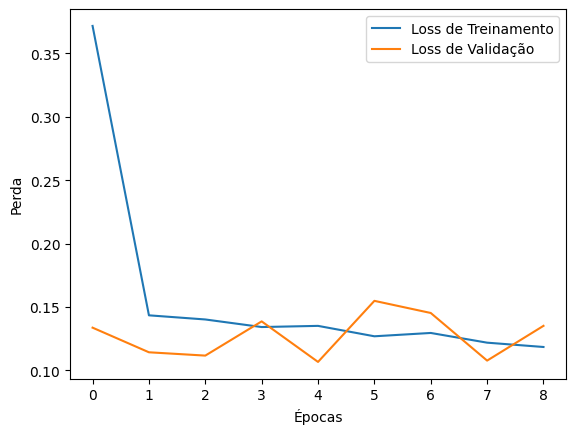

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1008
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


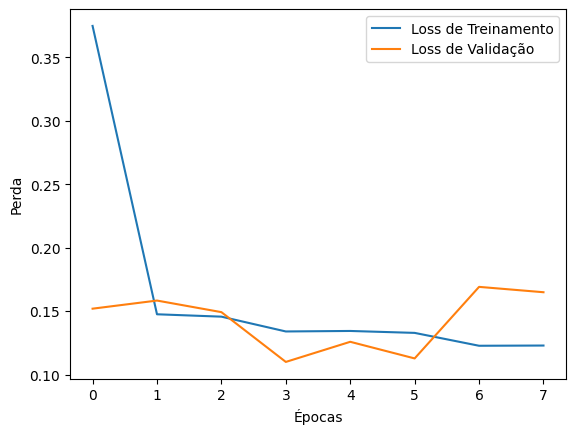

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1179
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


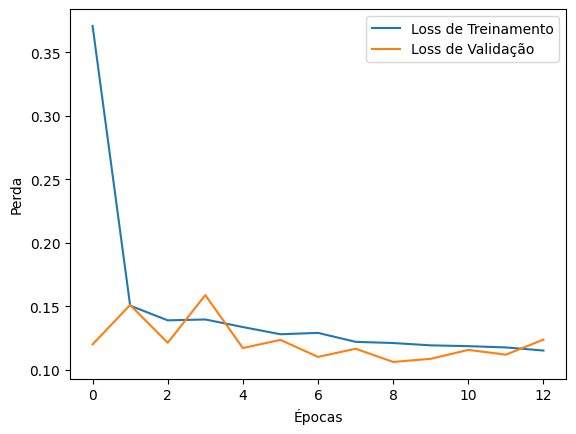

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0915
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


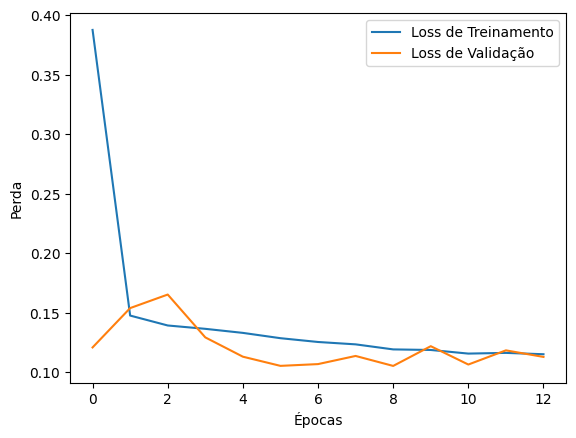

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0997
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


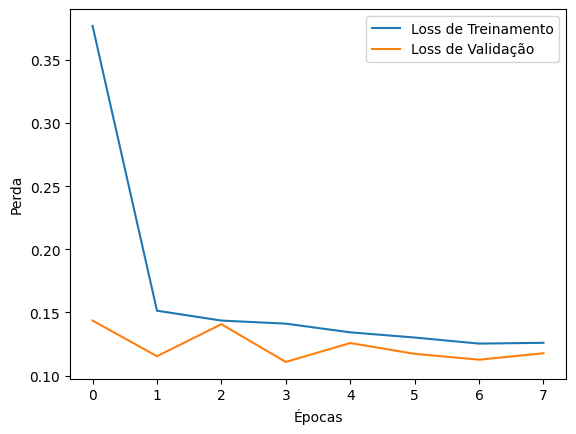

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0845
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


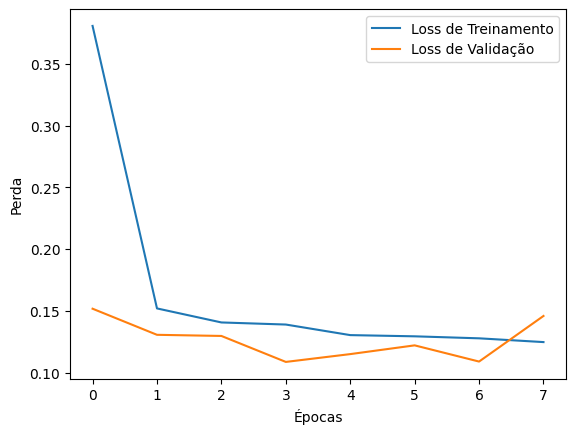

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1005
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


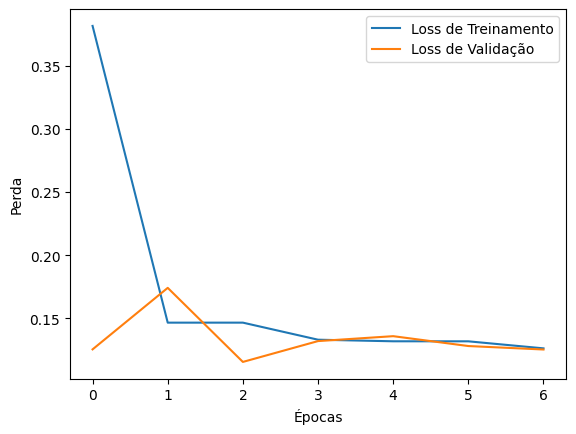

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1333
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


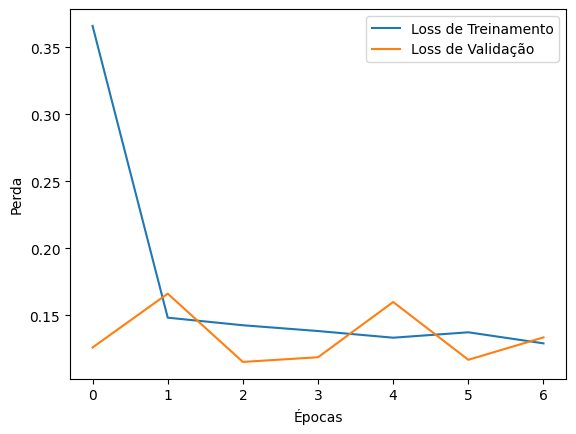

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0893
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


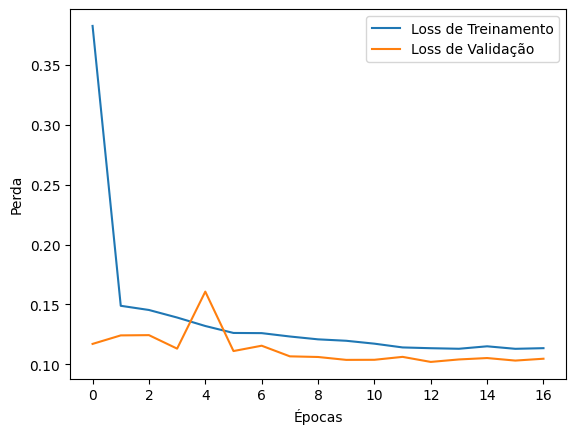

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0886
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


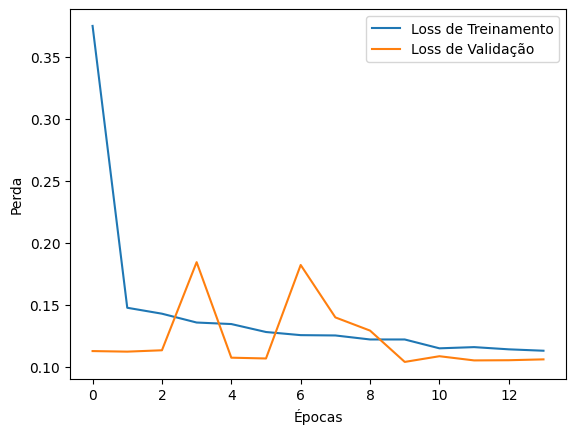

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1034
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


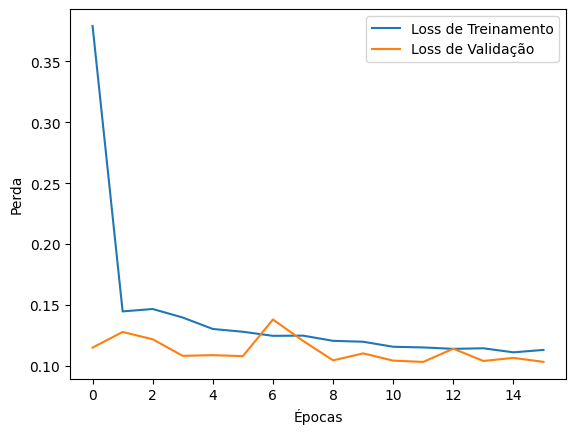

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0983
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


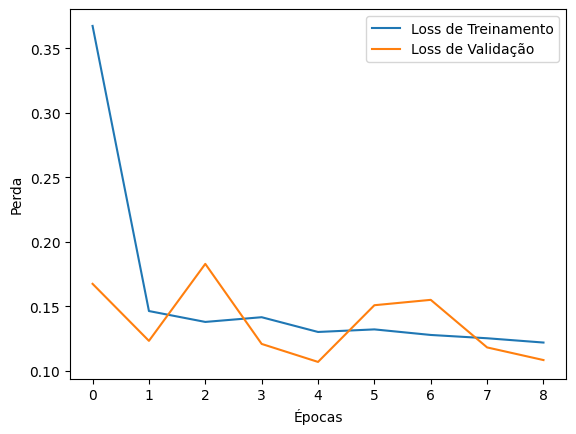

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0987
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


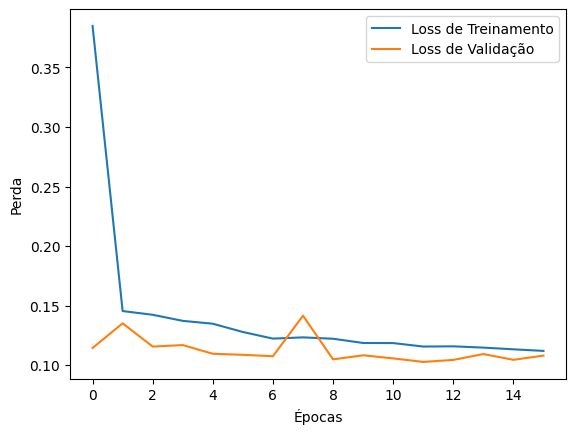

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1085
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


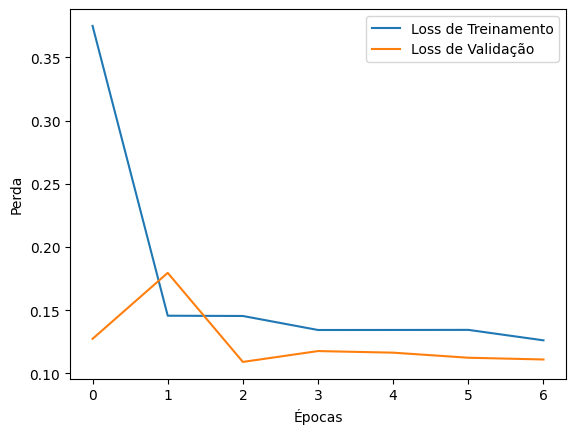

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1028
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


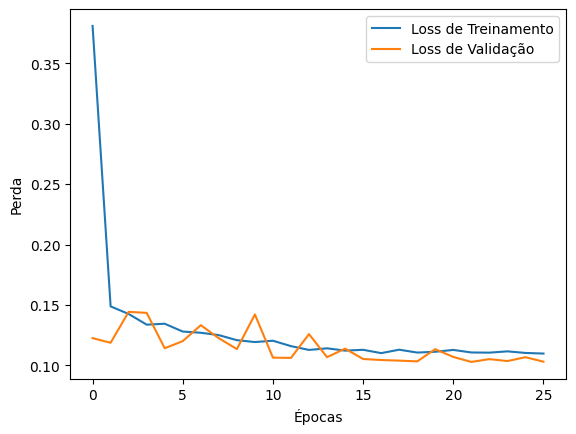

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0987
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


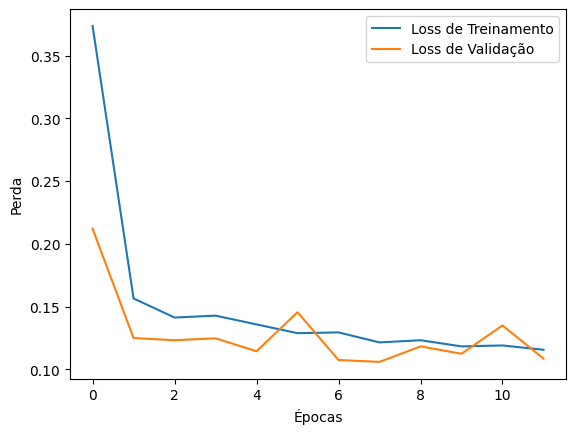

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1015
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


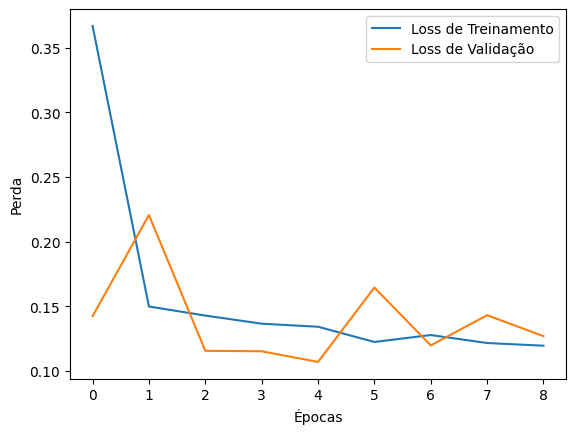

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1061
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


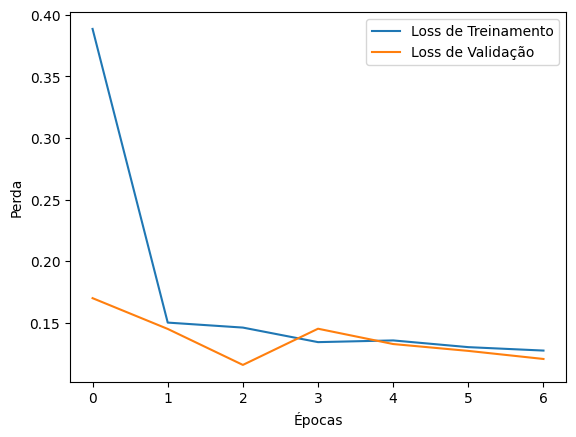

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0864
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


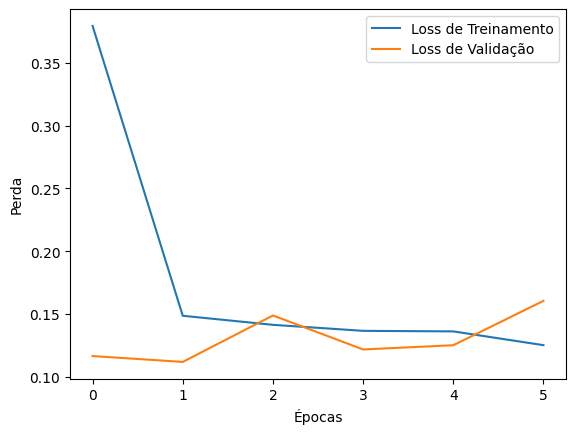

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1070
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


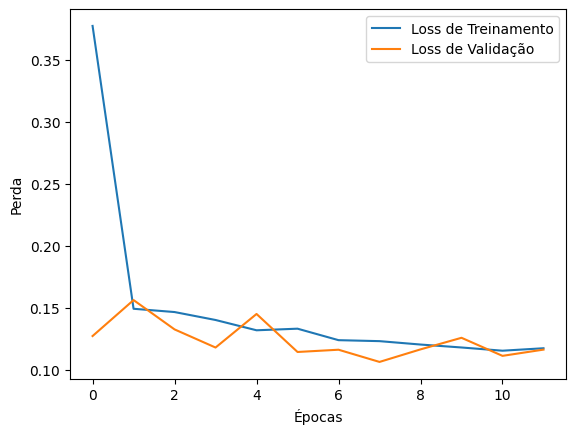

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0892
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


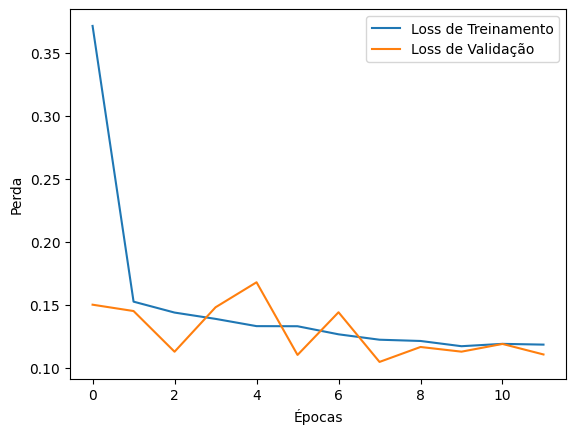

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1049
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


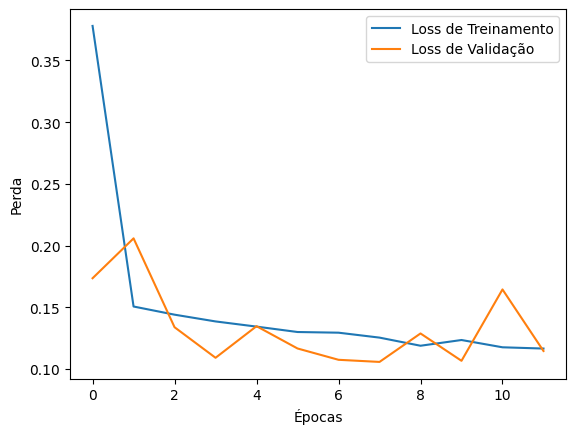

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0961
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


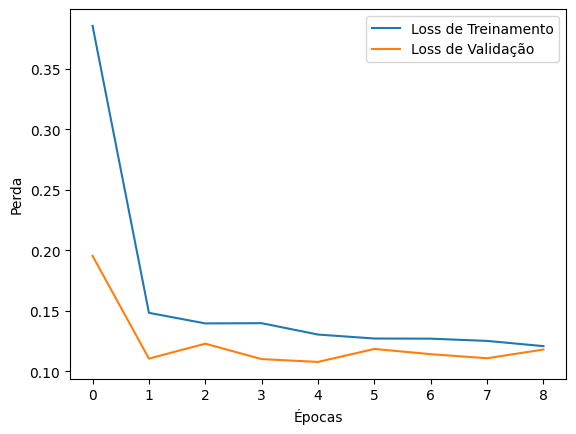

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0886
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


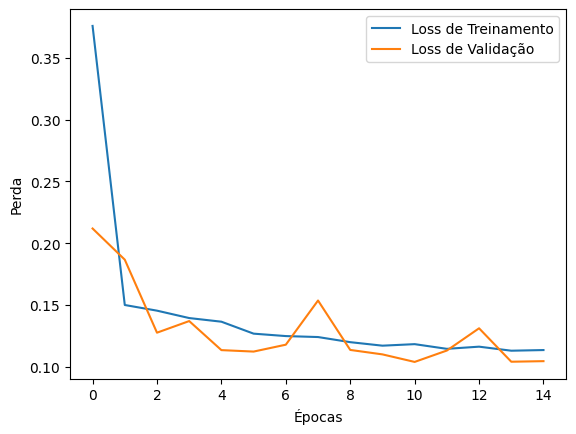

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0880
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


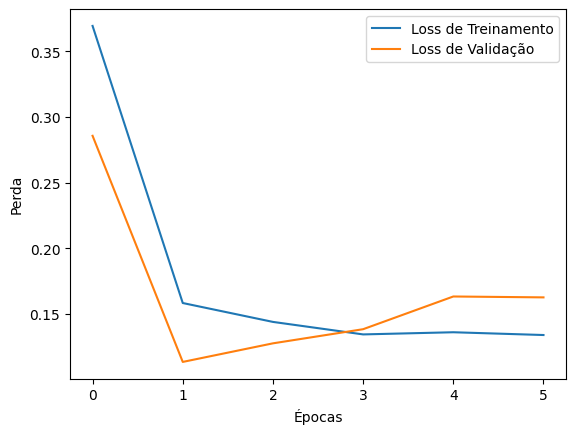

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1122
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


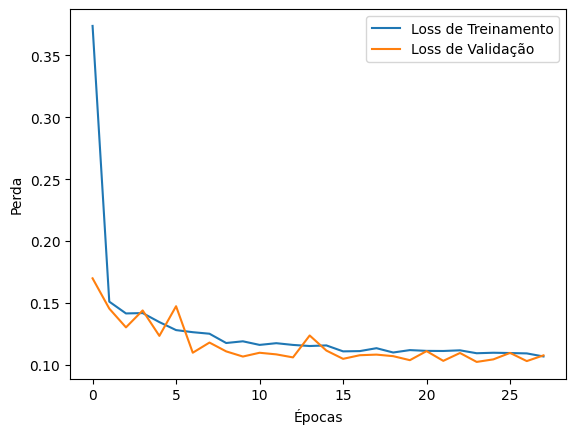

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0936
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


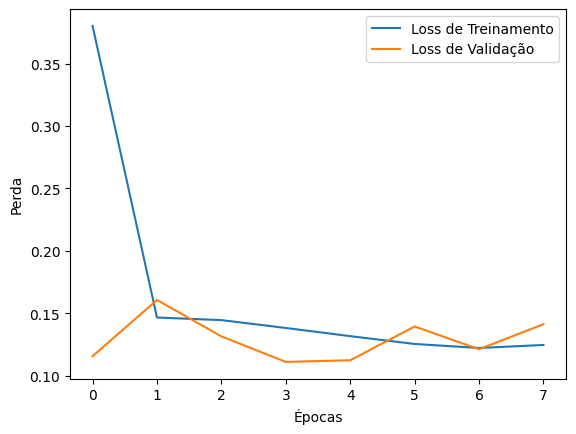

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0837
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


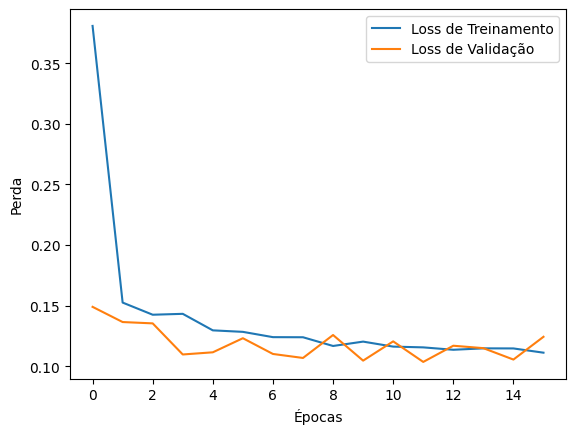

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


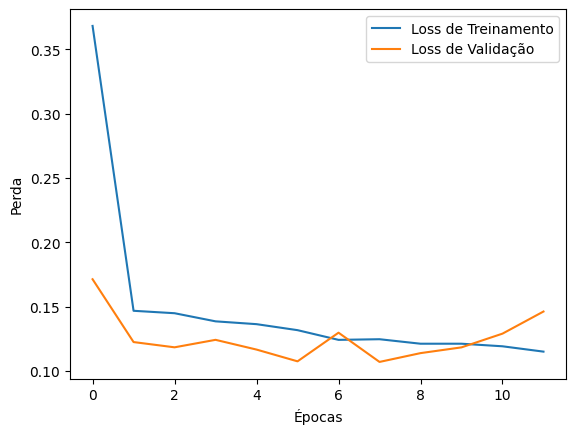

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0825
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


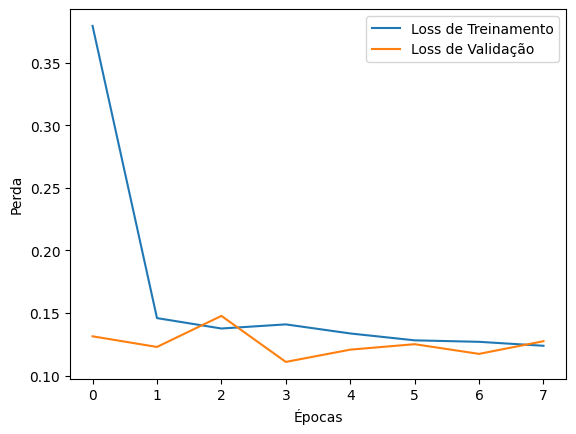

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1266
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


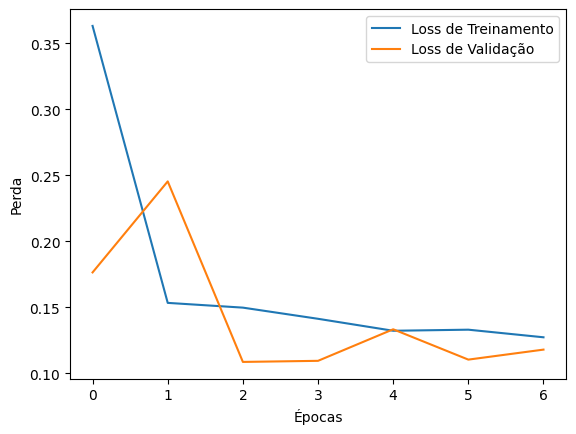

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1053
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


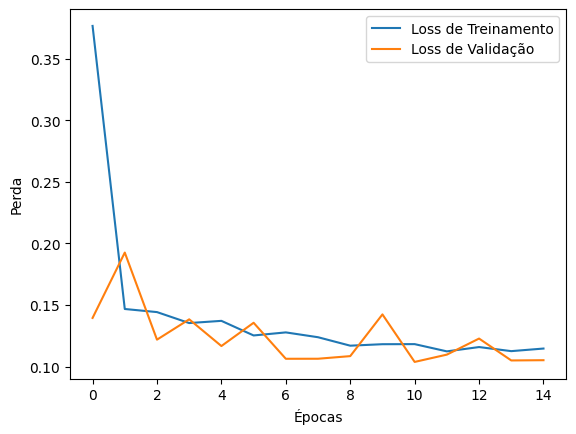

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0927
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


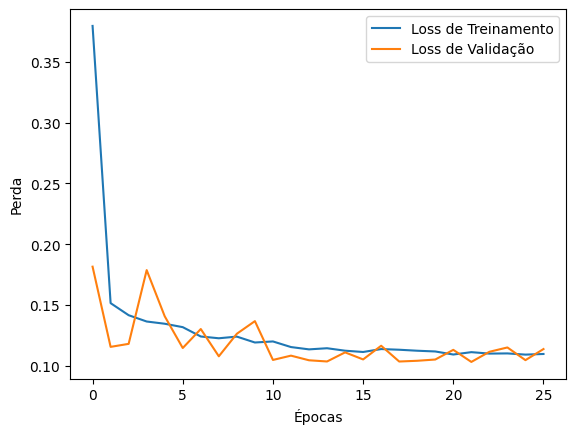

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0994
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


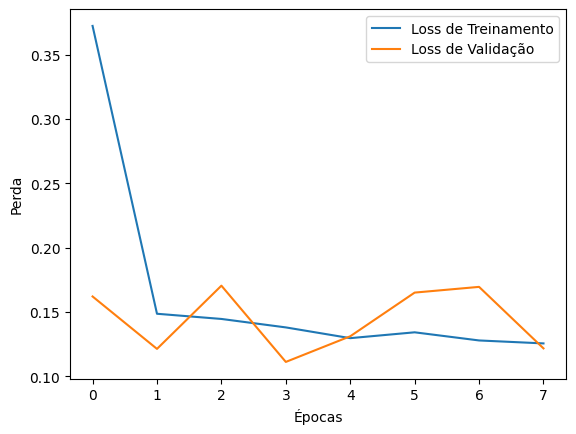

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0831
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


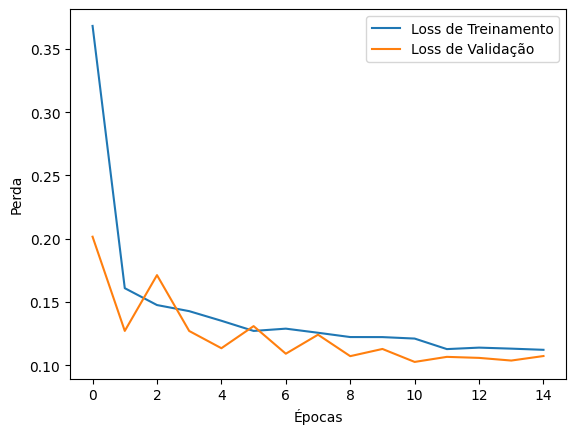

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.1011
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


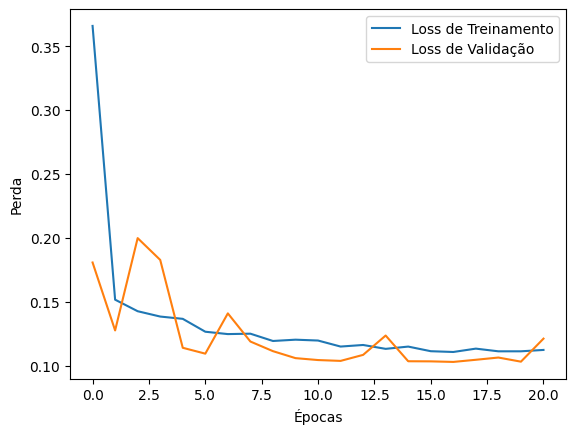

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0990
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


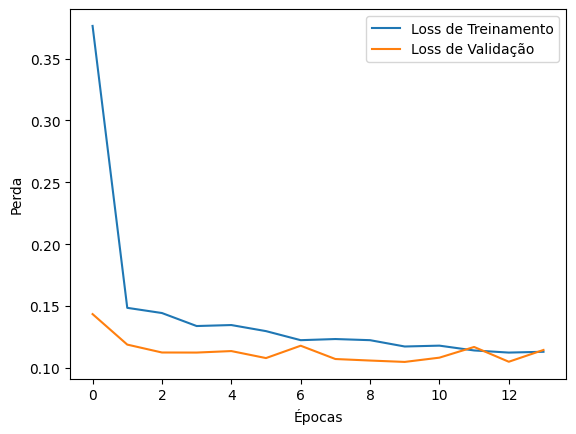

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0959
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


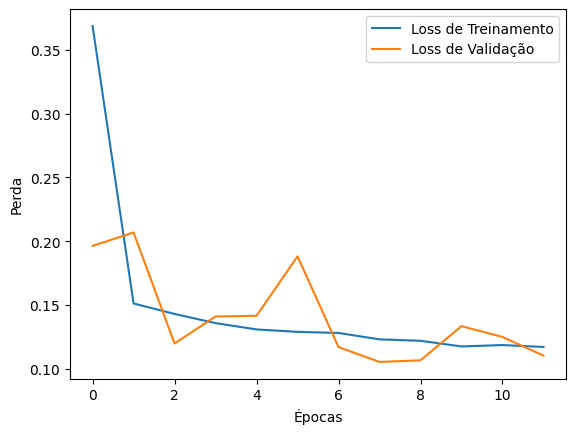

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0848
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


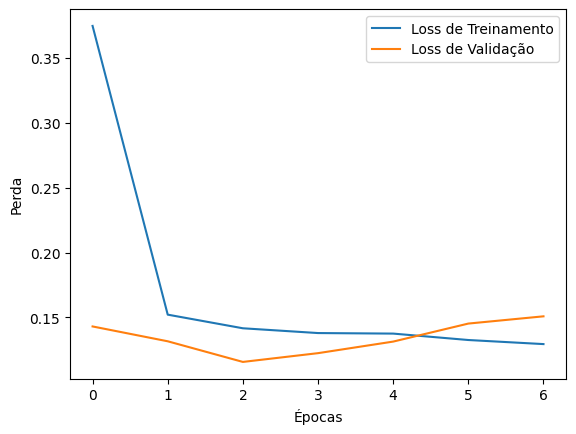

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0750
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


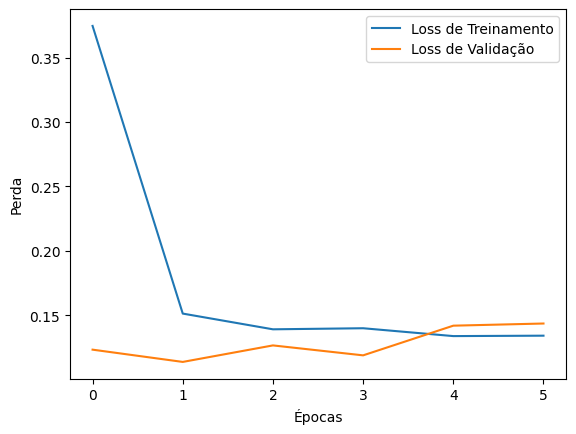

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1008
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


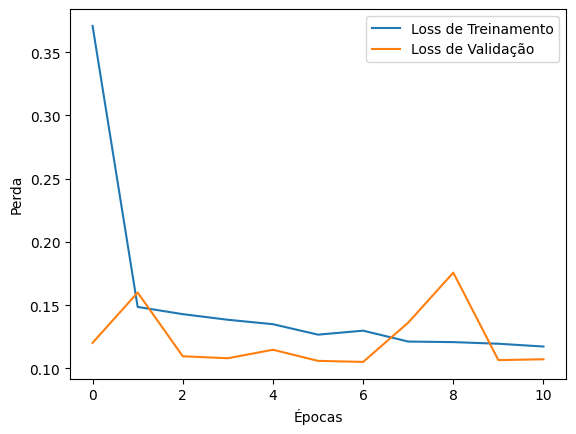

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0916
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


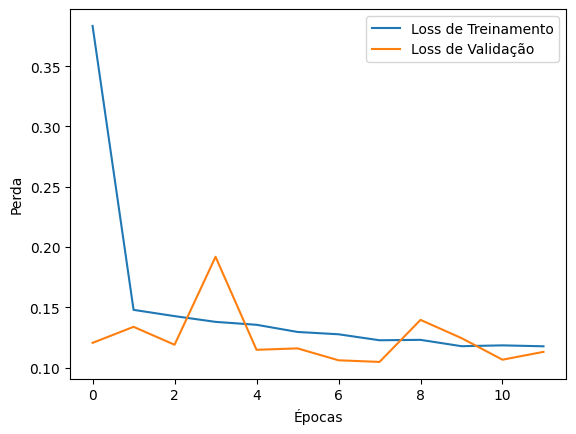

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1018
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


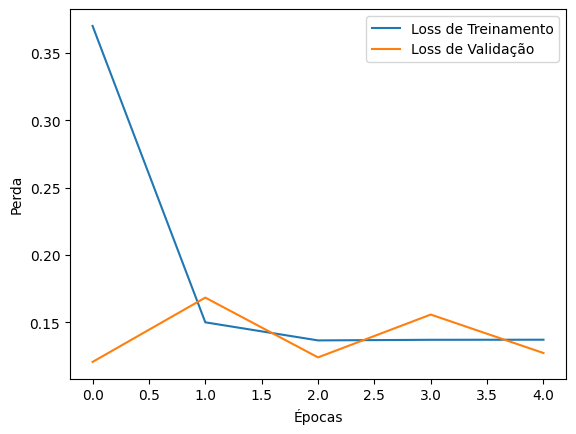

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1369
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


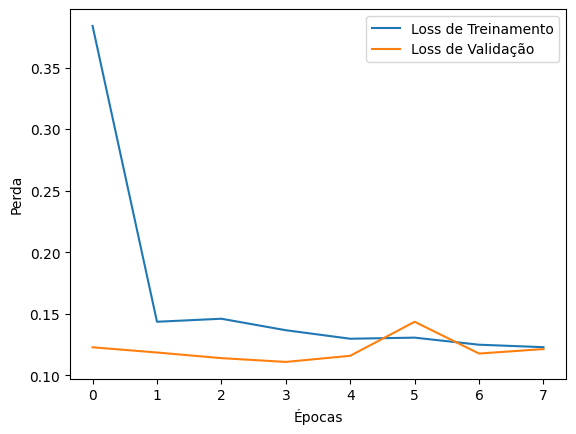

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0912
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


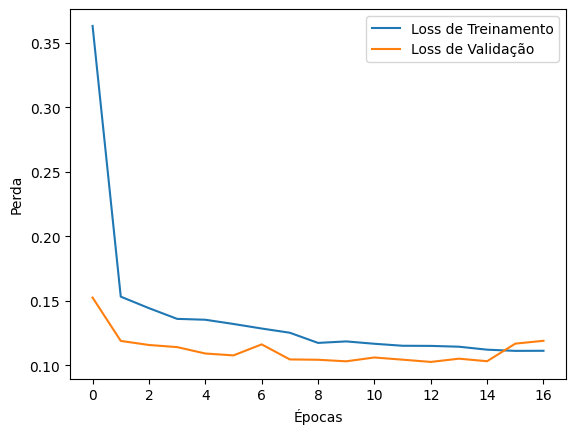

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0884
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


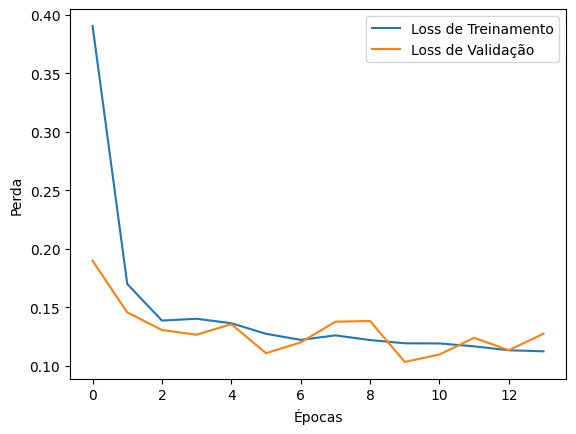

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1088
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


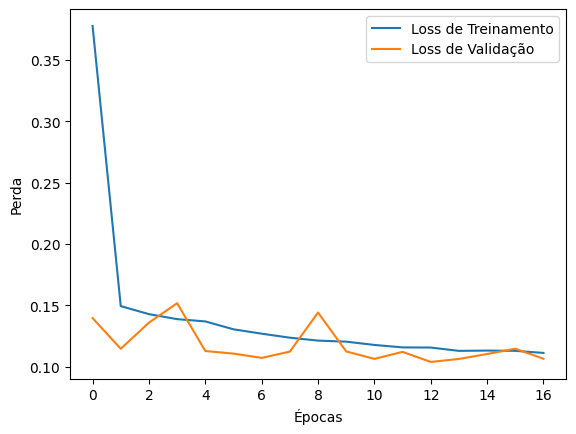

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0868
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


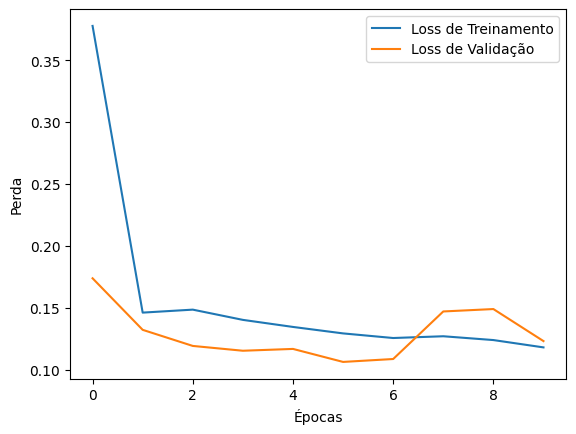

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1113
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


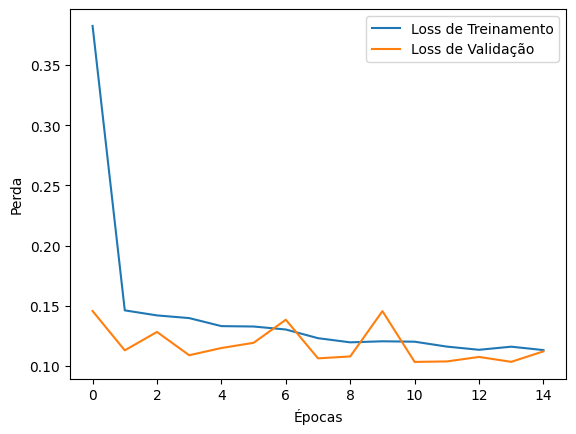

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0945
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


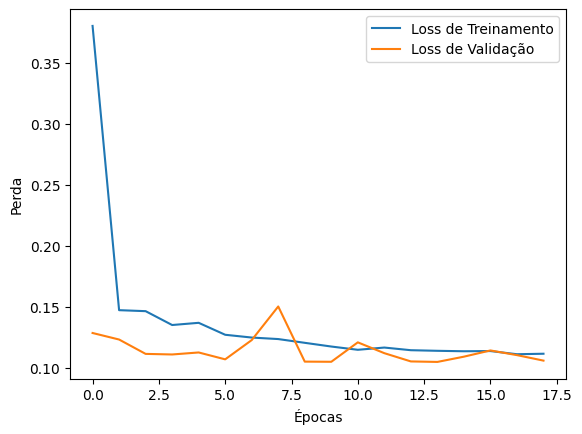

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1125
units 150
dropout_rate 0.4
learning_rate 0.005
batch_size 20
patience 4
num_camadas_LSTM 2
activation relu
loss <function wmae at 0x000001E2BD959760>
optimizer rmsprop


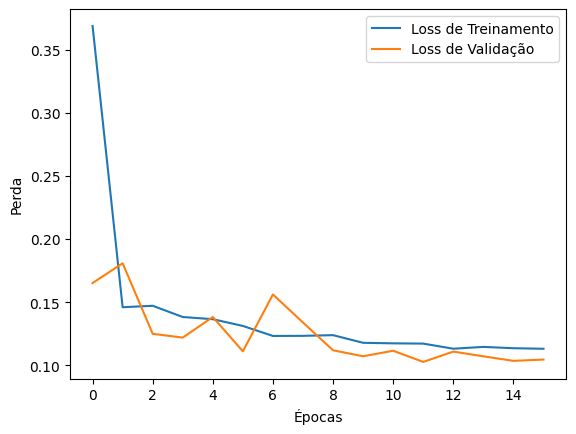

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0971
Melhor solução encontrada: [1.36658614]
Melhor score: 0.05549975484609604


In [14]:
import numpy as np

# Definições para PSO
n_particles = 15   # Número de partículas (conjunto-candidato de hiperparâmetros) otimizadas por iteração
n_iterations = 30  # Número de vezes que o PSO otimiza as partículas
w = 0.5            # Inércia - controla a influência da velocidade anterior da partícula
c1 = 0.5           # Coeficiente cognitivo - controla a influência da melhor posição da partícula
c2 = 0.5           # Coeficiente social - controla a influência da melhor posição global

# Limites dos hiperparâmetros (neurônios, dropout, learning rate, batch size, patience,num_camadas_LSTM, activation, loss)
#bounds = [(10, 200), (0.1, 0.4), (0.00001, 0.005), (12, 64), (2, 8), (1, 5)] #, (0, 2), (0, 1)]
bounds = [(0, 2)]

# Inicialização das partículas
particles = np.random.rand(n_particles, len(bounds))                                                     
# Gera uma matriz de números aleatórios no intervalo [0,1). A matriz 
# tem dimensões n_particles - linhas e len(bounds) - colunas, sendo len(bounds)
# o número de hiperparâmetros sendo otimizados.
particles = particles * (np.array([ub - lb for lb, ub in bounds])) + np.array([lb for lb, ub in bounds]) 
# Cada linha de particles representa uma partícula, e cada coluna representa um valor correspondente a um hiperparâmetro.
# O primeiro np.array cria um array que contém a diferença entre o limite superior (ub)
# e o limite inferior (lb) de cada hiperparâmetro. Após isso, particles (definidas inicialmente entre [0,1))
# são multiplicadas pela amplitude de cada intervalo.
# O segundo np.array cria um array com os valores mínimos de cada hiperparâmetro. Esse array é somado ao primeiro array
# para garantir que todas as partículas terão seus hiperparâmetros dentro dos limites estabelecidos. 


velocities = np.random.rand(n_particles, len(bounds)) # Define as velocidades iniciais das partículas de forma aleatória
pbest_positions = particles.copy()                    # Guarda a melhor posição individual de cada partícula
pbest_scores = [float('inf')] * n_particles  # Inicialização com um valor alto
#pbest_scores = np.full(n_particles, np.inf)           # Inicializa os melhores scores individuais como infinito
gbest_position = None                                 # A melhor posição global encontrada por todas as partículas (inicialmente None)
gbest_score = np.inf                                  # O melhor score global, inicialmente infinito

# Função para atualizar a posição e a velocidade das partículas
# Ajusta as partículas para que se movam em direção à melhor solução encontrada até o momento, 
# tanto individualmente (pbest_positions) quanto globalmente (gbest_position).
def update_particles(particles, velocities):
    # particles - array com as posições atuais de todas as partículas
    # velocities - array com as velocidades atuais de todas as partículas
    for i in range(n_particles):            # Loop para atualizar todas as partículas
        velocities[i] = w * velocities[i] + c1 * np.random.rand() * (pbest_positions[i] - particles[i]) + c2 * np.random.rand() * (gbest_position - particles[i])
        # Atualiza a velocidade da partícula. W (inercia) multiplica a velocidade atual da partícula.
        # C1 (componente cognitiva) multiplica a diferença entre a melhor posição e a posição atual (da partícula).
        # np.random.rand() gera uma matriz de números aleatórios entre [0,1) para evitar que a partícula fique presa em uma trajetória fixa
        # C2 - (componente social) multiplica a diferença entre a melhor posição considerando todas as partículas
        # e a posição atual da partícula.        
        particles[i] += velocities[i]
        # A nova posição da partícula é atualizada somando a posição atual à nova velocidade
        # Move a partícula em direção à sua nova posição no espaço de soluções
        particles[i] = np.clip(particles[i], [lb for lb, ub in bounds], [ub for lb, ub in bounds])
        # np.clip garante que cada partícula permaneça dentro dos limites definidos em bounds para cada hiperparâmetro
        # np.clip(x, a, b) faz com que, se x for menor que a, ele se torne a, e se for maior que b, ele se torne b.

# Otimização
# O PSO irá atualizar as partículas e verificar as melhores soluções n_iterations vezes.
for iteration in range(n_iterations):
    # Para cada iteração todas as partículas são avaliadas: seu desempenho e ajuste de sua posição e velocidade
    for i in range(n_particles):
        score = fitness_function(particles[i])
        # Função que treina e testa o modelo com os hiperparâmetros da partícula atual
        # Cada partícula é avaliada através da sua posição/estado atual (valores-candidatos dos seus hiperparâmetros)
        # É retornado o erro que avalia quão boa é a posição atual

        if score < pbest_scores[i]:
            pbest_scores[i] = score
            pbest_positions[i] = particles[i].copy()
        # Se o score for o melhor score pessoal da partícula, este valor e a posição (hiperparâmetros) são salvos
        # copy() é usado para garantir que uma nova instância da posição seja armazenada, evitando modificações acidentais.

        if score < gbest_score:
            gbest_score = score
            gbest_position = particles[i].copy()
            print(f"best_score_until_now", gbest_score)
            print("Melhor solução encontrada até agora:", gbest_position)
        # Se o score for o melhor score global de todas as partículas, este valor e a posição (hiperparâmetros) são salvos

    update_particles(particles, velocities)
    # Após a avaliação de todas as partículas e seus hiperparâmetros (dentro da mesma iteração), a função update_particles
    # é chamada para atualizar as posições das partículas (hiperparâmetros) com base nos resultados da iteração atual 

print("Melhor solução encontrada:", gbest_position)
print("Melhor score:", gbest_score)


In [15]:
print("Melhor solução encontrada:", gbest_position)
print("Melhor score:", gbest_score)

Melhor solução encontrada: [1.36658614]
Melhor score: 0.05549975484609604


In [16]:
def avaliacao_multistep(janela_real, janela_prevista):
    
    mae_med = 0
    mse_med = 0
    rmse_med = 0
    mape_med = 0
    acuracia_med = 0
    # Converte as listas para arrays NumPy
    #janela_real = np.array(janela_real)
    #janela_prevista = np.array(janela_prevista)
    print(len(janela_real[0]))
    
    for j in range(len(janela_prevista)):
        if len(janela_real) != len(janela_prevista):
            raise ValueError("As janelas reais e previstas devem ter o mesmo comprimento.")

        else:
        #r2 =  round(r2_score(janela_real, janela_prevista), 2)   # Relacionado à regressão linear dos valores verdadeiros. É calculado com base no erro quadrático residual e erro total. O valor pode ser interpretado como a proporção dos valores previstos que estão na linha criada pela regressão.
        #print("R^2 Score of LSTM model = ",r2)
        #print(" ")

            mae = round(mean_absolute_error(janela_real[j], janela_prevista[j]), 3) # Arredondamento com três casas decimais
            print("MAE(Erro absoluto médio) Score of LSTM model = ",mae)
            print(" ")

            mse = round(mean_squared_error(janela_real[j], janela_prevista[j]), 3)
            print("MSE(Erro quadrático médio) Score of LSTM model = ",mse)
            print(" ")
            
            rmse = round(np.sqrt(mse), 3)
            print("RMSE(Raiz do erro quadrático médio) Score of LSTM model = ",rmse)
            print(" ")

            mape = round(mean_absolute_percentage_error(janela_real[j], janela_prevista[j]), 2)
            print("MAPE(Erro percentual médio absoluto) Score of LSTM model = ",mape)
            print(" ")
            
            ### Cálculo da ACURÁCIA ###
            
            # Calcula a diferença percentual
            diferencas_percentuais = np.abs((np.array(janela_real[j]) - np.array(janela_prevista[j])) / np.array(janela_real[j]))

            # Conta quantas diferenças percentuais estão dentro da tolerância
            acertos = np.sum(diferencas_percentuais <= 0.05) #0.05 é a tolerância

            # Calcula a acurácia
            acuracia = acertos / len(janela_real[0])   
            acuracia = round(100 * acuracia, 2)
            
            print("Accuracy Score of LSTM model = ",acuracia)
            mae_med += mae
            mse_med += mse
            rmse_med += rmse
            mape_med += mape
            acuracia_med += acuracia
            
    mae_med = mae_med/(len(janela_prevista))
    mse_med /=(len(janela_prevista))
    rmse_med /=(len(janela_prevista))
    mape_med /=(len(janela_prevista))
    acuracia_med /=(len(janela_prevista))
    
    return round(mae_med,2), round(mse_med,2), round(rmse_med,2), round(mape_med,2), round(acuracia_med,2)

In [17]:
y_pred = model.predict(X_validation)
print(len(X_validation), len(y_pred), len(X_validation[0]))
y_pred_rescaled = scaler.inverse_transform(y_pred)

y_test_rescaled = scaler.inverse_transform(y_validation)
#indices_to_validate = indices_to_validate[:len(y_pred_rescaled)]
indices_to_validate = indices_to_validate[:validation_interval]
print(indices_to_validate)

plt.figure(figsize=(8,6))
plt.plot(indices_to_validate[0:output_steps], y_test_rescaled[0], label="Original", color='blue')
plt.plot(indices_to_validate[0:output_steps], y_pred_rescaled[0], label="Predição", color='red')
plt.yticks(np.arange(0,200000,step=10000))
plt.show()

plt.figure(figsize=(8,6))
plt.plot(indices_to_validate[1:1+output_steps], y_test_rescaled[1], label="Original", color='blue')
plt.plot(indices_to_validate[1:1+output_steps], y_pred_rescaled[1], label="Predição", color='red')
plt.yticks(np.arange(0,200000,step=10000))
plt.show()


plt.figure(figsize=(8,6))
plt.plot(indices_to_validate[2:2+output_steps], y_test_rescaled[2], label="Original", color='blue')
plt.plot(indices_to_validate[2:2+output_steps], y_pred_rescaled[2], label="Predição", color='red')
plt.yticks(np.arange(0,200000,step=10000))
plt.show()


plt.figure(figsize=(8,6))
plt.plot(indices_to_validate[3:3+output_steps], y_test_rescaled[3], label="Original", color='blue')
plt.plot(indices_to_validate[3:3+output_steps], y_pred_rescaled[3], label="Predição", color='red')
plt.yticks(np.arange(0,200000,step=10000))
plt.show()


plt.figure(figsize=(8,6))
plt.plot(indices_to_validate[4:4+output_steps], y_test_rescaled[4], label="Original", color='blue')
plt.plot(indices_to_validate[4:4+output_steps], y_pred_rescaled[4], label="Predição", color='red')
plt.yticks(np.arange(0,200000,step=10000))
plt.show()


NameError: name 'model' is not defined

In [ ]:
avaliacao_multistep(y_test_rescaled,y_pred_rescaled)